In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling   #need to install using anaconda prompt (pip install pandas_profiling)
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
import statsmodels.formula.api as sm

In [3]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
%matplotlib inline
import math

In [4]:
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

In [5]:
from collections import defaultdict
import time
import gc
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets.samples_generator import make_regression
from sklearn.ensemble.forest import RandomForestRegressor
from sklearn.linear_model.ridge import Ridge
from sklearn.linear_model.stochastic_gradient import SGDRegressor
from sklearn.svm.classes import SVR
from sklearn.utils import shuffle

In [6]:
DataSet = pd.read_excel ("C:\\Users\\RAMKUMAR\\Desktop\\Data Set.xlsx")
DataSet.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,1,0,0,0,1,0


In [7]:
DataSet1 = DataSet.assign(TotalSpend = DataSet.cardspent + DataSet.card2spent)
DataSet1.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,TotalSpend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,149.46
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,77.54
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,359.97
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,359.41
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,507.83


In [8]:
DataSet1["ln_TotalSpend"]= np.log(DataSet1["TotalSpend"])
DataSet1.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,TotalSpend,ln_TotalSpend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,1,1,0,0,0,1,0,149.46,5.007029
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,0,0,0,77.54,4.350794
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,1,0,0,0,359.97,5.886021
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,1,1,0,1,1,0,0,359.41,5.884464
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,0,0,1,0,507.83,6.230147


In [9]:
DataSet1 = DataSet1.drop(['TotalSpend'],axis = 1)
DataSet1.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147


In [10]:
DataSet1.to_csv("DataSet1.csv")

In [11]:
DataSet1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 131 entries, custid to ln_TotalSpend
dtypes: float64(32), int64(97), object(2)
memory usage: 5.0+ MB


In [12]:
DataSet1_des = DataSet1.describe()
DataSet1_des

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
count,5000.00000,4998.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.0000,5000.00000,5000.000000,...,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,3.00140,2.687275,0.503600,47.025600,4.238800,14.543000,2.672000,2.7528,0.15120,9.730400,...,0.201000,0.63280,0.479200,0.474800,0.178800,0.472600,0.083600,0.129800,0.102600,6.001244
std,1.42176,1.425925,0.500037,17.770338,1.308785,3.281083,1.211738,1.7379,0.35828,9.690929,...,0.400788,0.48209,0.499617,0.499415,0.383223,0.499299,0.276815,0.336117,0.303466,0.671473
min,1.00000,1.000000,0.000000,18.000000,2.000000,6.000000,1.000000,1.0000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.093098
25%,2.00000,1.000000,0.000000,31.000000,3.000000,12.000000,2.000000,1.0000,0.00000,2.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.621424
50%,3.00000,3.000000,1.000000,47.000000,4.000000,14.000000,2.000000,2.0000,0.00000,7.000000,...,0.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.026470
75%,4.00000,4.000000,1.000000,62.000000,5.000000,17.000000,4.000000,4.0000,0.00000,15.000000,...,0.000000,1.00000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,6.422536
max,5.00000,5.000000,1.000000,79.000000,6.000000,23.000000,5.000000,6.0000,1.00000,52.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.493116


In [13]:
DataSet1_des.to_csv("DataSet1_des.csv")

In [14]:
pandas_profiling.ProfileReport(DataSet1)

Number of variables,131
Number of observations,5000
Total Missing (%),0.2%
Total size in memory,5.0 MiB
Average record size in memory,1.0 KiB
Numeric,60
Categorical,1
Boolean,49
Date,0
Text (Unique),1
Rejected,20


In [15]:
ramkumar = pandas_profiling.ProfileReport(DataSet1)

ramkumar.to_file(outputfile='pandas_profilingramkumar.html')

In [16]:
DataSet2 = DataSet1.drop(['cardspent','card2spent'], axis=1)
DataSet2.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147


In [17]:
DataSet2.to_csv("DataSet2.csv")

In [18]:
DataSet2['custid'] = DataSet2.custid.astype('category').cat.codes
DataSet2['custid']
DataSet2.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147


In [19]:
DataSet3 = DataSet2
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,1,2.0,1,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,3,4.0,1,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,4,3.0,0,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,2,2.0,0,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,4,4.0,0,64,5,August,17,4,3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,2,5.0,1,52,5,July,14,2,1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,3,4.0,1,44,4,October,16,3,1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,2,3.0,1,66,6,October,12,2,1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,2,2.0,0,47,4,July,11,1,6,...,0,0,0,0,0,0,0,0,0,5.739182


In [20]:
g = {0 : 'm', 1 : 'f'}

DataSet3.gender= DataSet3.gender.map(g)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,1,2.0,f,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,5,5.0,m,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,3,4.0,f,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,4,3.0,m,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,2,2.0,m,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,4,4.0,m,64,5,August,17,4,3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,2,5.0,f,52,5,July,14,2,1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,3,4.0,f,44,4,October,16,3,1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,2,3.0,f,66,6,October,12,2,1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,2,2.0,m,47,4,July,11,1,6,...,0,0,0,0,0,0,0,0,0,5.739182


In [21]:
r = {1 : 'z1',2 : 'z2', 3 : 'z3',4 : 'z4',5 : 'z5'}

DataSet3.region= DataSet3.region.map(r)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,2,September,15,3,1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,2,May,17,4,2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,6,June,14,2,2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,2,May,16,3,2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,3,July,16,3,2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,5,August,17,4,3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,5,July,14,2,1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,4,October,16,3,1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,6,October,12,2,1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,4,July,11,1,6,...,0,0,0,0,0,0,0,0,0,5.739182


In [22]:
j = {1 : 'j1',2 : 'j2', 3 : 'j3',4 : 'j4',5 : 'j5',6 : 'j6' }

DataSet3.jobcat= DataSet3.jobcat.map(j)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,2,September,15,3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,2,May,17,4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,6,June,14,2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,2,May,16,3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,3,July,16,3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,5,August,17,4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,5,July,14,2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,4,October,16,3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,6,October,12,2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,4,July,11,1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [23]:
e= {1 : 'e1',2 : 'e2', 3 : 'e3',4 : 'e4',5 : 'e5' }

DataSet3.edcat= DataSet3.edcat.map(e)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [24]:
u= {0 : 'n',1 : 'y'}

DataSet3.union= DataSet3.union.map(u)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [25]:
e1= {1 : 'ec1', 2 : 'ec2', 3 : 'ec3', 4 : 'ec4', 5 :'ec5'}

DataSet3.empcat= DataSet3.empcat.map(e1)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [26]:
a= {1 : 'ac1', 2 : 'ac2', 3 : 'ac3', 4 : 'ac4', 5 :'ac5', 6:'ac6'}

DataSet3.agecat= DataSet3.agecat.map(a)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [27]:
i= {1 : 'ic1', 2 : 'ic2', 3 : 'ic3', 4 : 'ic4', 5 :'ic5'}

DataSet3.inccat= DataSet3.inccat.map(i)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [28]:
r1= {0 : 'n', 1 : 'y'}

DataSet3.retire= DataSet3.retire.map(r1)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [29]:
d= {0 : 'n', 1 : 'y'}

DataSet3.default= DataSet3.default.map(d)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [30]:
m= {0 : 'u', 1 : 'm'}

DataSet3.marital= DataSet3.marital.map(m)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [31]:
jobsat= {1 : 'js1', 2 : 'js2', 3 : 'js3', 4 : 'js4', 5 :'js5'}

DataSet3.jobsat= DataSet3.jobsat.map(jobsat)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [32]:
s= {-1 : 'spo1', 1 : 'spo2', 2 : 'spo3', 3 : 'spo4', 4 :'spo5',5 : 'spo6'}

DataSet3.spousedcat= DataSet3.spousedcat.map(s)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [33]:
h= {0 : 'r', 1 : 'o'}

DataSet3.homeown= DataSet3.homeown.map(h)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [34]:
h1= {1 : 'ht1', 2 : 'ht2',3 : 'ht3', 4 : 'ht4'}

DataSet3.hometype= DataSet3.hometype.map(h1)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [35]:
a1= {1 : 'acat1', 2 : 'acat2',3 : 'acat3', 4 : 'acat4', 5 : 'acat5'}

DataSet3.addresscat= DataSet3.addresscat.map(a1)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [36]:
c1= {-1 : 'n', 0 : 'l',1 : 'o'}

DataSet3.carown= DataSet3.carown.map(c1)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [37]:
c2= {-1 : 'n', 0 : 'd',1 : 'i'}

DataSet3.cartype= DataSet3.cartype.map(c2)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [38]:
c3= {-1 : 'n', 1 : 'e',2 : 's',3 : 'l'}

DataSet3.carcatvalue= DataSet3.carcatvalue.map(c3)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [39]:
c5= {0 : 'n', 1 : 'y'}

DataSet3.carbuy= DataSet3.carbuy.map(c5)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [40]:
c9= {0 : 'n',1 : 'y'}

DataSet3.commutemotorcycle= DataSet3.commutemotorcycle.map(c9)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [41]:
c14= {0 : 'n',1 : 'y'}

DataSet3.commutebike= DataSet3.commutebike.map(c14)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [42]:
rea= {1 : 'rea1',2 : 'rea2',3 : 'rea3', 4 : 'rea4',8 : 'rea8',9 : 'rea9'}

DataSet3.reason= DataSet3.reason.map(rea)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [43]:
pol= {1 : 'pol1',2 : 'pol2',3 : 'pol3', 4 : 'pol4',5 : 'pol5',6 : 'pol6', 7: 'pol7'}

DataSet3.polview= DataSet3.polview.map(pol)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [44]:
pol2= {0 : 'n',1 : 'y'}

DataSet3.polcontrib= DataSet3.polcontrib.map(pol2)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [45]:
v= {0 : 'n',1 : 'y'}

DataSet3.vote= DataSet3.vote.map(v)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [46]:
card= {1 : 'card1',2 : 'card2',3 : 'card3', 4 : 'card4',5 : 'card5'}

DataSet3.card= DataSet3.card.map(card)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [47]:
cardtenurecat= {1 : 'cat1',2 : 'cat2',3 : 'cat3', 4 : 'cat4',5 : 'cat5'}

DataSet3.cardtenurecat= DataSet3.cardtenurecat.map(cardtenurecat)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [48]:
card2= {1 : 'a',2 : 'v',3 : 'm', 4 : 'd',5 : 'o'}

DataSet3.card2= DataSet3.card2.map(card2)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [49]:
card2benefit= {1 : 'n',2 : 'c',3 : 'a', 4 : 'o'}

DataSet3.card2benefit= DataSet3.card2benefit.map(card2benefit)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [50]:
card2tenurecat= {1 : 'l',2 : 'l1',3 : 'l2', 4 : 'l3', 5: 'm'}

DataSet3.card2tenurecat= DataSet3.card2tenurecat.map(card2tenurecat)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [51]:
bfast= {1 : 'e',2 : 'o',3 : 'c'}

DataSet3.bfast= DataSet3.bfast.map(bfast)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [52]:
churn= {0 : 'n',1 : 'y'}

DataSet3.churn= DataSet3.churn.map(churn)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [53]:
tollfree= {0 : 'n',1 : 'y'}

DataSet3.tollfree= DataSet3.tollfree.map(tollfree)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [54]:
equip= {0 : 'n',1 : 'y'}

DataSet3.equip= DataSet3.equip.map(equip)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [55]:
callcard= {0 : 'n',1 : 'y'}

DataSet3.callcard= DataSet3.callcard.map(callcard)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [56]:
wireless= {0 : 'n',1 : 'y'}

DataSet3.wireless= DataSet3.wireless.map(wireless)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [57]:
multline= {0 : 'n',1 : 'y'}

DataSet3.multline= DataSet3.multline.map(multline)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [58]:
voice= {0 : 'n',1 : 'y'}

DataSet3.voice= DataSet3.voice.map(voice)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [59]:
pager= {0 : 'n',1 : 'y'}

DataSet3.pager= DataSet3.pager.map(pager)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [60]:
internet= {0 : 'n',1 : 'd',2 : 'd1',3 : 'c', 4 : 'o'}

DataSet3.internet= DataSet3.internet.map(internet)
DataSet3    

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [61]:
callid= {0 : 'n',1 : 'y'}

DataSet3.callid= DataSet3.callid.map(callid)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [62]:
callwait= {0 : 'n',1 : 'y'}

DataSet3.callwait= DataSet3.callwait.map(callwait)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [63]:
forward= {0 : 'n',1 : 'y'}

DataSet3.forward= DataSet3.forward.map(forward)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [64]:
confer= {0 : 'n',1 : 'y'}

DataSet3.confer= DataSet3.confer.map(confer)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [65]:
ebill= {0 : 'n',1 : 'y'}

DataSet3.ebill= DataSet3.ebill.map(ebill)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [66]:
owntv= {0 : 'n',1 : 'y'}

DataSet3.owntv= DataSet3.owntv.map(owntv)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [67]:
ownvcr= {0 : 'n',1 : 'y'}

DataSet3.ownvcr= DataSet3.ownvcr.map(ownvcr)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [68]:
owndvd= {0 : 'n',1 : 'y'}

DataSet3.owndvd= DataSet3.owndvd.map(owndvd)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [69]:
owncd= {0 : 'n',1 : 'y'}

DataSet3.owncd= DataSet3.owncd.map(owncd)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,0,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,1,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,0,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,0,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,0,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,1,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,0,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,0,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,0,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,0,0,0,0,0,0,0,0,0,5.739182


In [70]:
ownpda= {0 : 'n',1 : 'y'}

DataSet3.ownpda= DataSet3.ownpda.map(ownpda)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,0,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,1,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,0,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,1,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,1,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,0,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,1,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,0,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,0,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,0,0,0,0,0,0,0,0,5.739182


In [71]:
ownpc= {0 : 'n',1 : 'y'}

DataSet3.ownpc= DataSet3.ownpc.map(ownpc)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,1,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,1,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,0,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,1,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,0,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,0,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,1,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,0,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,0,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,0,0,0,0,0,0,0,5.739182


In [72]:
ownipod= {0 : 'n',1 : 'y'}

DataSet3.ownipod= DataSet3.ownipod.map(ownipod)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,1,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,1,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,0,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,1,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,1,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,0,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,0,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,0,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,0,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,0,0,0,0,0,0,5.739182


In [73]:
owngame= {0 : 'n',1 : 'y'}

DataSet3.owngame= DataSet3.owngame.map(owngame)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,0,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,1,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,0,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,0,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,0,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,n,0,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,n,0,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,n,0,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,n,0,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,n,0,0,0,0,0,5.739182


In [74]:
ownfax= {0 : 'n',1 : 'y'}

DataSet3.ownfax= DataSet3.ownfax.map(ownfax)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,n,0,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,y,1,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,n,1,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,n,1,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,n,0,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,n,n,0,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,n,n,0,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,n,n,1,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,n,n,0,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,n,n,0,0,0,0,5.739182


In [75]:
news= {0 : 'n',1 : 'y'}

DataSet3.news= DataSet3.news.map(news)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,n,n,0,1,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,y,y,0,0,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,n,y,0,0,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,n,y,1,0,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,n,n,0,1,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,n,n,n,0,1,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,n,n,n,0,0,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,n,n,y,0,0,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,n,n,n,1,0,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,n,n,n,0,0,0,5.739182


In [76]:
response_02= {0 : 'n',1 : 'y'}

DataSet3.response_02= DataSet3.response_02.map(response_02)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,n,n,0,y,0,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,y,y,0,n,0,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,n,y,0,n,0,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,n,y,1,n,0,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,n,n,0,y,0,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,n,n,n,0,y,0,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,n,n,n,0,n,0,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,n,n,y,0,n,0,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,n,n,n,1,n,0,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,n,n,n,0,n,0,5.739182


In [77]:
response_03= {0 : 'n',1 : 'y'}

DataSet3.response_03= DataSet3.response_03.map(response_03)
DataSet3

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,n,n,0,y,n,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,y,y,0,n,n,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,n,y,0,n,n,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,n,y,1,n,n,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,n,n,0,y,n,6.230147
5,4825,z4,4.0,m,64,ac5,August,17,e4,j3,...,y,n,n,n,n,n,0,y,n,5.430529
6,3669,z2,5.0,f,52,ac5,July,14,e2,j1,...,n,y,y,n,n,n,0,n,n,6.859048
7,4453,z3,4.0,f,44,ac4,October,16,e3,j1,...,n,n,n,n,n,y,0,n,n,7.173805
8,4530,z2,3.0,f,66,ac6,October,12,e2,j1,...,n,n,n,n,n,n,1,n,n,6.148105
9,1757,z2,2.0,m,47,ac4,July,11,e1,j6,...,n,n,n,n,n,n,0,n,n,5.739182


In [78]:
DataSet3.to_csv("DataSet3.csv")

In [79]:
pandas_profiling.ProfileReport(DataSet3)

Number of variables,129
Number of observations,5000
Total Missing (%),0.2%
Total size in memory,4.9 MiB
Average record size in memory,1.0 KiB
Numeric,45
Categorical,59
Boolean,13
Date,0
Text (Unique),0
Rejected,12


In [80]:
ramkumar1 = pandas_profiling.ProfileReport(DataSet3)
ramkumar1.to_file(outputfile='pandas_profilingramkumar1.html')

In [81]:
DataSet3.to_csv("DataSet3.csv")

In [82]:
DataSet3.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
0,1979,z1,2.0,f,20,ac2,September,15,e3,j1,...,n,n,y,y,n,n,0,y,n,5.007029
1,346,z5,5.0,m,22,ac2,May,17,e4,j2,...,y,y,y,y,y,y,0,n,n,4.350794
2,2605,z3,4.0,f,67,ac6,June,14,e2,j2,...,n,n,n,n,n,y,0,n,n,5.886021
3,2220,z4,3.0,m,23,ac2,May,16,e3,j2,...,n,y,y,y,n,y,1,n,n,5.884464
4,4036,z2,2.0,m,26,ac3,July,16,e3,j2,...,n,y,n,y,n,n,0,y,n,6.230147


In [83]:
DataSet3.tail()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,ln_TotalSpend
4995,1836,z2,2.0,m,68,ac6,January,10,e1,j1,...,n,n,n,n,n,y,0,n,n,7.262397
4996,2344,z3,3.0,m,51,ac5,May,14,e2,j1,...,n,n,n,n,n,n,0,n,n,5.903589
4997,4214,z4,5.0,m,75,ac6,August,17,e4,j1,...,y,n,n,n,n,y,0,n,n,7.331551
4998,4638,z1,1.0,m,47,ac4,December,19,e4,j2,...,n,y,y,y,n,y,0,n,n,6.623999
4999,3971,z3,5.0,f,41,ac4,May,10,e1,j5,...,n,n,n,n,n,n,0,n,n,6.010924


In [84]:
DataSet3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 129 entries, custid to ln_TotalSpend
dtypes: float64(30), int16(1), int64(39), object(59)
memory usage: 4.9+ MB


In [85]:
DataSet3.dtypes

custid             int16
region            object
townsize         float64
gender            object
age                int64
agecat            object
birthmonth        object
ed                 int64
edcat             object
jobcat            object
union             object
employ             int64
empcat            object
retire            object
income             int64
lninc            float64
inccat            object
debtinc          float64
creddebt         float64
lncreddebt       float64
othdebt          float64
lnothdebt        float64
default           object
jobsat            object
marital           object
spoused            int64
spousedcat        object
reside             int64
pets               int64
pets_cats          int64
                  ...   
lncardten        float64
wireless          object
wiremon          float64
lnwiremon        float64
wireten          float64
lnwireten        float64
multline          object
voice             object
pager             object


In [86]:
DataSet3.dtypes.value_counts()

object     59
int64      39
float64    30
int16       1
dtype: int64

In [87]:
DataSet3.get_dtype_counts()

float64    30
int16       1
int64      39
object     59
dtype: int64

In [88]:
DataSet3.custid.value_counts().head()

2047    1
4655    1
549     1
4647    1
2600    1
Name: custid, dtype: int64

In [89]:
DataSet3.birthmonth.value_counts()

September    458
May          451
June         420
January      420
February     418
March        416
July         413
October      410
August       406
November     399
December     398
April        391
Name: birthmonth, dtype: int64

In [90]:
DataSet3.describe().T

,count,mean,std,min,25%,50%,75%,max
custid,5000.0,2499.500000,1443.520003,0.000000,1249.750000,2499.500000,3749.250000,4999.000000
townsize,4998.0,2.687275,1.425925,1.000000,1.000000,3.000000,4.000000,5.000000
age,5000.0,47.025600,17.770338,18.000000,31.000000,47.000000,62.000000,79.000000
ed,5000.0,14.543000,3.281083,6.000000,12.000000,14.000000,17.000000,23.000000
employ,5000.0,9.730400,9.690929,0.000000,2.000000,7.000000,15.000000,52.000000
income,5000.0,54.759600,55.377511,9.000000,24.000000,38.000000,67.000000,1073.000000
lninc,5000.0,3.699909,0.747072,2.197225,3.178054,3.637586,4.204693,6.978214
debtinc,5000.0,9.954160,6.399783,0.000000,5.100000,8.800000,13.600000,43.100000
creddebt,5000.0,1.857326,3.415732,0.000000,0.385520,0.926437,2.063820,109.072596
lncreddebt,4999.0,-0.130454,1.273058,-6.597334,-0.952685,-0.076106,0.724665,4.692014


In [91]:
DataSet3.columns

Index(['custid', 'region', 'townsize', 'gender', 'age', 'agecat', 'birthmonth',
       'ed', 'edcat', 'jobcat',
       ...
       'ownpda', 'ownpc', 'ownipod', 'owngame', 'ownfax', 'news',
       'response_01', 'response_02', 'response_03', 'ln_TotalSpend'],
      dtype='object', length=129)

In [92]:
numeric_var_names=[key for key in dict(DataSet3.dtypes) if dict(DataSet3.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]
cat_var_names=[key for key in dict(DataSet3.dtypes) if dict(DataSet3.dtypes)[key] in ['object']]
print(numeric_var_names)
print(cat_var_names)

['townsize', 'age', 'ed', 'employ', 'income', 'lninc', 'debtinc', 'creddebt', 'lncreddebt', 'othdebt', 'lnothdebt', 'spoused', 'reside', 'pets', 'pets_cats', 'pets_dogs', 'pets_birds', 'pets_reptiles', 'pets_small', 'pets_saltfish', 'pets_freshfish', 'address', 'cars', 'carvalue', 'carbought', 'commute', 'commutecat', 'commutetime', 'commutecar', 'commutecarpool', 'commutebus', 'commuterail', 'commutepublic', 'commutewalk', 'commutenonmotor', 'telecommute', 'polparty', 'cardtype', 'cardbenefit', 'cardfee', 'cardtenure', 'card2type', 'card2fee', 'card2tenure', 'active', 'tenure', 'longmon', 'lnlongmon', 'longten', 'lnlongten', 'tollmon', 'lntollmon', 'tollten', 'lntollten', 'equipmon', 'lnequipmon', 'equipten', 'lnequipten', 'cardmon', 'lncardmon', 'cardten', 'lncardten', 'wiremon', 'lnwiremon', 'wireten', 'lnwireten', 'hourstv', 'response_01', 'ln_TotalSpend']
['region', 'gender', 'agecat', 'birthmonth', 'edcat', 'jobcat', 'union', 'empcat', 'retire', 'inccat', 'default', 'jobsat', 'ma

In [93]:
DataSet3_num = DataSet3[numeric_var_names]

In [94]:
DataSet3_cat = DataSet3[cat_var_names]

In [95]:
DataSet3_num.to_csv("DataSet3_num.csv")

In [96]:
DataSet3_cat.to_csv("DataSet3_cat.csv")

In [97]:
DataSet3_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 69 columns):
townsize           4998 non-null float64
age                5000 non-null int64
ed                 5000 non-null int64
employ             5000 non-null int64
income             5000 non-null int64
lninc              5000 non-null float64
debtinc            5000 non-null float64
creddebt           5000 non-null float64
lncreddebt         4999 non-null float64
othdebt            5000 non-null float64
lnothdebt          4999 non-null float64
spoused            5000 non-null int64
reside             5000 non-null int64
pets               5000 non-null int64
pets_cats          5000 non-null int64
pets_dogs          5000 non-null int64
pets_birds         5000 non-null int64
pets_reptiles      5000 non-null int64
pets_small         5000 non-null int64
pets_saltfish      5000 non-null int64
pets_freshfish     5000 non-null int64
address            5000 non-null int64
cars               50

In [98]:
DataSet3_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 59 columns):
region               5000 non-null object
gender               5000 non-null object
agecat               5000 non-null object
birthmonth           5000 non-null object
edcat                5000 non-null object
jobcat               5000 non-null object
union                5000 non-null object
empcat               5000 non-null object
retire               5000 non-null object
inccat               5000 non-null object
default              5000 non-null object
jobsat               5000 non-null object
marital              5000 non-null object
spousedcat           5000 non-null object
homeown              5000 non-null object
hometype             5000 non-null object
addresscat           5000 non-null object
carown               5000 non-null object
cartype              5000 non-null object
carcatvalue          5000 non-null object
carbuy               5000 non-null object
commutemoto

# Creating Data audit Report

In [99]:
# Use a general function that returns multiple values
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

num_summary = DataSet3_num.apply(lambda x: var_summary(x)).T

In [100]:
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
townsize,4998.0,2.0,1.343100e+04,2.687275,3.000000,1.425925,2.033262e+00,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,4.000000,5.000000,5.000000,5.000000,5.000000
age,5000.0,0.0,2.351280e+05,47.025600,47.000000,17.770338,3.157849e+02,18.000000,18.000000,20.000000,23.000000,31.000000,47.000000,62.000000,72.000000,76.000000,79.000000,79.000000
ed,5000.0,0.0,7.271500e+04,14.543000,14.000000,3.281083,1.076550e+01,6.000000,8.000000,9.000000,10.000000,12.000000,14.000000,17.000000,19.000000,20.000000,21.000000,23.000000
employ,5000.0,0.0,4.865200e+04,9.730400,7.000000,9.690929,9.391410e+01,0.000000,0.000000,0.000000,0.000000,2.000000,7.000000,15.000000,25.000000,31.000000,39.000000,52.000000
income,5000.0,0.0,2.737980e+05,54.759600,38.000000,55.377511,3.066669e+03,9.000000,9.000000,13.000000,16.000000,24.000000,38.000000,67.000000,109.100000,147.000000,272.010000,1073.000000
lninc,5000.0,0.0,1.849955e+04,3.699909,3.637586,0.747072,5.581164e-01,2.197225,2.197225,2.564949,2.772589,3.178054,3.637586,4.204693,4.692261,4.990433,5.605839,6.978214
debtinc,5000.0,0.0,4.977080e+04,9.954160,8.800000,6.399783,4.095723e+01,0.000000,0.700000,1.900000,2.800000,5.100000,8.800000,13.600000,18.600000,22.200000,29.200000,43.100000
creddebt,5000.0,0.0,9.286628e+03,1.857326,0.926437,3.415732,1.166722e+01,0.000000,0.033160,0.101088,0.175682,0.385520,0.926437,2.063820,4.299470,6.373010,14.280358,109.072596
lncreddebt,4999.0,1.0,-6.521372e+02,-0.130454,-0.076106,1.273058,1.620678e+00,-6.597334,-3.401690,-2.291604,-1.737842,-0.952685,-0.076106,0.724665,1.458625,1.852297,2.658910,4.692014
othdebt,5000.0,0.0,1.827230e+04,3.654460,2.098540,5.395172,2.910788e+01,0.000000,0.114299,0.287692,0.457997,0.980301,2.098540,4.314780,8.062046,11.815981,24.064260,141.459150


In [101]:
num_summary.head().T

,townsize,age,ed,employ,income
N,4998.000000,5000.000000,5000.000000,5000.000000,5000.000000
NMISS,2.000000,0.000000,0.000000,0.000000,0.000000
SUM,13431.000000,235128.000000,72715.000000,48652.000000,273798.000000
MEAN,2.687275,47.025600,14.543000,9.730400,54.759600
MEDIAN,3.000000,47.000000,14.000000,7.000000,38.000000
STD,1.425925,17.770338,3.281083,9.690929,55.377511
VAR,2.033262,315.784902,10.765504,93.914099,3066.668742
MIN,1.000000,18.000000,6.000000,0.000000,9.000000
P1,1.000000,18.000000,8.000000,0.000000,9.000000
P5,1.000000,20.000000,9.000000,0.000000,13.000000


In [102]:
num_summary.to_csv("num_summary.csv")

In [103]:
#Handling Outliers - Method2
def outlier_capping(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return x

DataSet3_num=DataSet3_num.apply(lambda x: outlier_capping(x))

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: clip_upper(threshold) is deprecated, use clip(upper=threshold) instead
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: clip_lower(threshold) is deprecated, use clip(lower=threshold) instead
  after removing the cwd from sys.path.


In [104]:
#Handling missings - Method2
def Missing_imputation(x):
    x = x.fillna(x.median())
    return x

DataSet3_num=DataSet3_num.apply(lambda x: Missing_imputation(x))

In [105]:
#Handling missings - Method2
def Cat_Missing_imputation(x):
    x = x.fillna(x.mode())
    return x

DataSet3_cat=DataSet3_cat.apply(lambda x: Cat_Missing_imputation(x))

In [106]:
DataSet3_cat=DataSet3_cat.apply(lambda x: Cat_Missing_imputation(x))

In [107]:
# An utility function to create dummy variable
def create_dummies( df, colname ):
    col_dummies = pd.get_dummies(df[colname], prefix=colname, drop_first=True)
    df = pd.concat([df, col_dummies], axis=1)
    df.drop( colname, axis = 1, inplace = True )
    return df

for c_feature in DataSet3_cat.columns:
    DataSet3_cat[c_feature] = DataSet3_cat[c_feature].astype('category')
    DataSet3_cat = create_dummies(DataSet3_cat , c_feature )

In [108]:
DataSet3_cat.head()

,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac3,agecat_ac4,agecat_ac5,agecat_ac6,birthmonth_August,...,owndvd_y,owncd_y,ownpda_y,ownpc_y,ownipod_y,owngame_y,ownfax_y,news_y,response_02_y,response_03_y
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,1,0,0,1,0
1,0,0,0,1,1,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,0
2,0,1,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,1,0,0
3,0,0,1,0,1,0,0,0,0,0,...,1,1,0,1,1,1,0,1,0,0
4,1,0,0,0,1,1,0,0,0,0,...,1,1,0,1,0,1,0,0,1,0


In [109]:
DataSet3_cat.head().T

,0,1,2,3,4
region_z2,0,0,0,0,1
region_z3,0,0,1,0,0
region_z4,0,0,0,1,0
region_z5,0,1,0,0,0
gender_m,0,1,0,1,1
agecat_ac3,0,0,0,0,1
agecat_ac4,0,0,0,0,0
agecat_ac5,0,0,0,0,0
agecat_ac6,0,0,1,0,0
birthmonth_August,0,0,0,0,0


In [110]:
DataSet3_cat.to_csv("DataSet3_cat.csv")

In [111]:
DataSet3_num.head()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,2.0,20,15,0,31.0,3.433987,11.1,1.200909,0.183079,2.240091,...,2.656757,60.0,4.094345,0.00,3.597997,0.00,7.147185,13,0,5.007029
1,5.0,22,17,0,15.0,2.708050,18.6,1.222020,0.200505,1.567980,...,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.428660,18,0,4.350794
2,4.0,67,14,16,35.0,3.555348,9.9,0.928620,-0.074056,2.536380,...,3.135494,1410.0,7.251345,0.00,3.597997,0.00,7.147185,21,0,5.886021
3,3.0,23,16,0,20.0,2.995732,5.7,0.033160,-3.401690,1.117200,...,3.044522,685.0,6.529419,0.00,3.597997,0.00,7.147185,26,1,5.884464
4,2.0,26,16,1,23.0,3.135494,1.7,0.214659,-1.538705,0.176341,...,2.847812,360.0,5.886104,19.05,2.947067,410.80,6.018106,27,0,6.230147


In [112]:
DataSet3_new = pd.concat([DataSet3_num, DataSet3_cat], axis=1)

DataSet3_new.head()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,owndvd_y,owncd_y,ownpda_y,ownpc_y,ownipod_y,owngame_y,ownfax_y,news_y,response_02_y,response_03_y
0,2.0,20,15,0,31.0,3.433987,11.1,1.200909,0.183079,2.240091,...,1,0,0,0,1,1,0,0,1,0
1,5.0,22,17,0,15.0,2.708050,18.6,1.222020,0.200505,1.567980,...,1,1,1,1,1,1,1,1,0,0
2,4.0,67,14,16,35.0,3.555348,9.9,0.928620,-0.074056,2.536380,...,1,1,0,0,0,0,0,1,0,0
3,3.0,23,16,0,20.0,2.995732,5.7,0.033160,-3.401690,1.117200,...,1,1,0,1,1,1,0,1,0,0
4,2.0,26,16,1,23.0,3.135494,1.7,0.214659,-1.538705,0.176341,...,1,1,0,1,0,1,0,0,1,0


In [532]:
DataSet3_new.describe().T.head(10)

,count,mean,std,min,25%,50%,75%,max
townsize,5000.0,2.687400,1.425653,1.000000,1.000000,3.000000,4.000000,5.000000
age,5000.0,47.025600,17.770338,18.000000,31.000000,47.000000,62.000000,79.000000
ed,5000.0,14.544200,3.242553,8.000000,12.000000,14.000000,17.000000,21.000000
employ,5000.0,9.698000,9.581689,0.000000,2.000000,7.000000,15.000000,39.000000
income,5000.0,53.629900,46.567698,9.000000,24.000000,38.000000,67.000000,272.010000
lninc,5000.0,3.697049,0.738495,2.197225,3.178054,3.637586,4.204693,5.605839
debtinc,5000.0,9.914120,6.241691,0.700000,5.100000,8.800000,13.600000,29.200000
creddebt,5000.0,1.758369,2.380681,0.033160,0.385520,0.926437,2.063820,14.280358
lncreddebt,5000.0,-0.127769,1.241274,-3.401690,-0.952498,-0.076106,0.724559,2.658910
othdebt,5000.0,3.522506,4.221760,0.114299,0.980301,2.098540,4.314780,24.064260


In [113]:
DataSet3_new.to_csv("DataSet3_new.csv")

In [114]:
from sklearn.cluster import KMeans

# center and scale the data
from sklearn.preprocessing import StandardScaler

In [115]:
from sklearn.decomposition import PCA

# Applying PCA

In [116]:
sc=StandardScaler()

DataSet3_scaled=sc.fit_transform(DataSet3_num)

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [117]:
pc = PCA(n_components=69)

In [118]:
pc.fit(DataSet3_scaled)

PCA(copy=True, iterated_power='auto', n_components=69, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [119]:
pc.explained_variance_

array([1.14715955e+01, 5.05189832e+00, 3.86341205e+00, 3.29416451e+00,
       2.02462164e+00, 1.93239676e+00, 1.88153507e+00, 1.82893721e+00,
       1.73714064e+00, 1.62188541e+00, 1.39531691e+00, 1.22318471e+00,
       1.14058945e+00, 1.10160904e+00, 1.08394909e+00, 1.07719714e+00,
       1.07192933e+00, 1.04056159e+00, 1.03637516e+00, 1.03391634e+00,
       1.01836310e+00, 1.00252051e+00, 9.90483915e-01, 9.84793315e-01,
       9.79815635e-01, 9.72167702e-01, 9.59286582e-01, 9.46425619e-01,
       9.36413828e-01, 9.25778543e-01, 9.19530430e-01, 8.98397144e-01,
       8.82055687e-01, 8.52307565e-01, 8.26546003e-01, 7.93020731e-01,
       7.71960342e-01, 7.29226184e-01, 6.41455097e-01, 5.86535465e-01,
       5.55721370e-01, 4.97720660e-01, 4.51238091e-01, 4.41781143e-01,
       4.17458512e-01, 3.74450123e-01, 3.52603096e-01, 3.22331757e-01,
       3.16951600e-01, 3.01536434e-01, 2.32025521e-01, 1.93483928e-01,
       1.64095751e-01, 1.35382014e-01, 1.22865619e-01, 1.08945916e-01,
      

In [120]:
#The amount of variance that each PC explains
var= pc.explained_variance_ratio_

In [121]:
var

array([1.66221757e-01, 7.32012745e-02, 5.59802807e-02, 4.77319663e-02,
       2.93364742e-02, 2.80001489e-02, 2.72631705e-02, 2.65010351e-02,
       2.51709161e-02, 2.35008845e-02, 2.02179399e-02, 1.77237691e-02,
       1.65269758e-02, 1.59621553e-02, 1.57062652e-02, 1.56084304e-02,
       1.55321006e-02, 1.50775866e-02, 1.50169258e-02, 1.49812979e-02,
       1.47559338e-02, 1.45263769e-02, 1.43519684e-02, 1.42695124e-02,
       1.41973865e-02, 1.40865691e-02, 1.38999235e-02, 1.37135701e-02,
       1.35685007e-02, 1.34143969e-02, 1.33238627e-02, 1.30176444e-02,
       1.27808591e-02, 1.23498131e-02, 1.19765318e-02, 1.14907555e-02,
       1.11855935e-02, 1.05663817e-02, 9.29459139e-03, 8.49881388e-03,
       8.05232211e-03, 7.21190022e-03, 6.53837454e-03, 6.40134473e-03,
       6.04891334e-03, 5.42572802e-03, 5.10916776e-03, 4.67054044e-03,
       4.59258274e-03, 4.36921922e-03, 3.36201617e-03, 2.80355408e-03,
       2.37772365e-03, 1.96166576e-03, 1.78030502e-03, 1.57861053e-03,
      

In [122]:
#Cumulative Variance explains
var1=np.cumsum(np.round(pc.explained_variance_ratio_, decimals=4)*100)

In [123]:
var1

array([ 16.62,  23.94,  29.54,  34.31,  37.24,  40.04,  42.77,  45.42,
        47.94,  50.29,  52.31,  54.08,  55.73,  57.33,  58.9 ,  60.46,
        62.01,  63.52,  65.02,  66.52,  68.  ,  69.45,  70.89,  72.32,
        73.74,  75.15,  76.54,  77.91,  79.27,  80.61,  81.94,  83.24,
        84.52,  85.75,  86.95,  88.1 ,  89.22,  90.28,  91.21,  92.06,
        92.87,  93.59,  94.24,  94.88,  95.48,  96.02,  96.53,  97.  ,
        97.46,  97.9 ,  98.24,  98.52,  98.76,  98.96,  99.14,  99.3 ,
        99.44,  99.54,  99.64,  99.73,  99.81,  99.86,  99.91,  99.94,
        99.97,  99.99, 100.01, 100.02, 100.02])

In [124]:
pc_final=PCA(n_components=35).fit(DataSet3_scaled)

In [125]:
pc_final.explained_variance_

array([11.47159553,  5.05189832,  3.86341205,  3.2941645 ,  2.02462112,
        1.93239581,  1.88153424,  1.82893703,  1.73713678,  1.62188524,
        1.39530076,  1.22314502,  1.14057563,  1.10160453,  1.08389462,
        1.07716538,  1.07190183,  1.04044386,  1.03629333,  1.03306941,
        1.01834296,  1.00239188,  0.99016556,  0.9847792 ,  0.97977096,
        0.97213968,  0.95921023,  0.94632534,  0.93626034,  0.92490002,
        0.91938016,  0.89828469,  0.88200499,  0.85154676,  0.82592965])

In [126]:
reduced_cr=pc_final.fit_transform(DataSet3_scaled)  # the out put is Factors (F1, F2, ...F9)

In [127]:
dimensions = pd.DataFrame(reduced_cr)

In [128]:
dimensions.columns = ["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8","C9","C10","C11","C12", "C13", "C14", "C15","C16","C17","C18","C19","C20","C21","C22","C23","C24","C25","C26","C27","C28","C29","C30","C31","C32","C33","C34","C35"]

In [129]:
dimensions.head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,-4.530404,0.630370,1.218073,2.134130,-1.520959,0.459085,-0.812909,1.152866,-0.253293,0.228945,...,-0.157444,-0.557389,-1.336762,-0.765324,-0.294522,-0.196116,-0.832674,-0.850072,0.401271,1.585038
1,-1.159000,0.974227,3.930496,-1.982162,1.514635,-0.419950,2.072816,-0.713477,0.294993,-3.712431,...,-1.850072,-1.107995,-1.201575,2.535817,1.289070,0.497490,0.391154,0.453070,2.979081,0.491319
2,2.942604,-2.525949,-1.403418,0.512901,0.094544,-0.225701,1.363111,-0.762983,-0.756278,0.275605,...,-0.599154,0.720213,0.039477,1.129207,-0.730522,0.803245,0.751972,-1.620000,-0.761927,-0.137406
3,-2.728999,-1.581526,0.586631,-2.120163,-1.703178,0.251453,0.111723,-3.036369,-0.991273,0.144353,...,1.504928,0.245003,0.170080,0.399575,-0.275488,1.865656,-1.038198,1.868281,-0.830922,-1.414809
4,-4.249824,-1.444033,1.641040,1.442626,-1.807629,0.850895,1.254313,-0.666283,-0.225260,2.073108,...,0.455614,1.459992,1.698214,-0.035318,-0.094314,-1.628035,-1.332701,0.157016,0.155383,-0.451475


In [130]:
dimensions.to_csv("dimensions1.csv")

In [131]:
Loadings1 =  pd.DataFrame((pc_final.components_.T * np.sqrt(pc_final.explained_variance_)).T,columns=DataSet3_num.columns).T
Loadings1

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
townsize,-0.042874,-0.007993,0.096259,0.168458,-0.031842,0.087861,0.408974,-0.492141,0.457601,-0.205720,...,-0.052757,-0.047333,-0.041665,0.021132,-0.001272,0.003628,0.017510,0.019037,-0.099546,-0.026984
age,0.657543,-0.231671,-0.234685,0.089945,0.103380,-0.104653,0.035607,0.305823,0.179920,0.008066,...,-0.114410,0.073713,-0.032358,0.059583,-0.011500,-0.085370,-0.038369,0.077749,0.012562,-0.279879
ed,-0.008647,0.395676,0.288601,-0.051424,0.121055,-0.076422,0.326989,0.099891,-0.146792,0.142751,...,-0.001826,-0.025341,-0.071304,0.017171,0.004485,0.072490,-0.097956,0.021085,-0.012393,-0.087861
employ,0.666447,-0.132667,-0.286454,0.120960,0.028445,0.004895,-0.013255,0.197947,0.179210,0.061963,...,-0.050107,-0.000260,0.000599,0.015692,-0.014744,-0.062083,-0.000007,0.059196,0.026917,-0.177386
income,0.475877,0.662689,-0.213706,0.176291,-0.016644,0.055200,0.027311,-0.019185,0.129964,0.321964,...,-0.000784,-0.028795,0.041111,-0.003907,0.000698,-0.010829,0.001396,0.008976,0.020686,-0.019970
lninc,0.422012,0.694907,-0.199778,0.178712,-0.015596,0.049678,0.029796,-0.044150,0.105561,0.321583,...,0.015642,-0.021436,0.033430,0.004019,-0.010365,-0.000679,0.005714,0.022513,0.008078,-0.001306
debtinc,0.099231,0.351501,-0.224462,0.202948,0.011260,-0.082820,-0.085816,-0.013682,-0.316989,-0.677194,...,-0.003884,0.038229,-0.041885,0.007325,-0.001121,0.023063,-0.006305,-0.037808,0.001556,0.008977
creddebt,0.343522,0.628014,-0.287402,0.231085,-0.020104,-0.020858,-0.036163,-0.014528,-0.114635,-0.140337,...,-0.022042,-0.002399,-0.007344,0.007352,-0.005650,-0.006800,-0.008933,-0.001977,-0.003389,0.007620
lncreddebt,0.300341,0.642291,-0.273777,0.257707,-0.003905,-0.050067,-0.037563,-0.017345,-0.168429,-0.217455,...,-0.003230,0.003702,-0.009446,0.022923,0.001994,-0.002161,-0.001714,0.004329,-0.007159,0.021338
othdebt,0.393720,0.674228,-0.269889,0.218202,-0.000945,-0.000387,-0.030125,-0.040697,-0.081393,-0.142732,...,0.004511,-0.005429,0.017196,-0.000663,-0.001853,0.022596,0.006193,-0.023441,0.023517,-0.011775


In [132]:
Loadings1.to_csv("Loadings2.csv")

In [133]:
list_var = ['card2tenure','tenure','lninc','lnothdebt','wiremon','wireten','commutecat','commute','pets','pets_freshfish','lncardmon','cardmon','spoused','reside','debtinc','pets_dogs','commutebus',
'pets_saltfish','card2fee','commutenonmotor','active','ln_TotalSpend']
list_var

['card2tenure',
 'tenure',
 'lninc',
 'lnothdebt',
 'wiremon',
 'wireten',
 'commutecat',
 'commute',
 'pets',
 'pets_freshfish',
 'lncardmon',
 'cardmon',
 'spoused',
 'reside',
 'debtinc',
 'pets_dogs',
 'commutebus',
 'pets_saltfish',
 'card2fee',
 'commutenonmotor',
 'active',
 'ln_TotalSpend']

# ANOVA

In [134]:
DataSet1.region.value_counts()

5    1027
1    1009
3    1003
2     995
4     966
Name: region, dtype: int64

In [135]:
r1 = DataSet1.ln_TotalSpend[DataSet1.region==1]
r2 = DataSet1.ln_TotalSpend[DataSet1.region==2]
r3 = DataSet1.ln_TotalSpend[DataSet1.region==3]
r4 = DataSet1.ln_TotalSpend[DataSet1.region==4]
r5 = DataSet1.ln_TotalSpend[DataSet1.region==5]
# Perform the ANOVA
stats.f_oneway(r1,r2,r3,r4,r5)

F_onewayResult(statistic=1.9472880362316225, pvalue=0.09979326260590124)

In [136]:
DataSet1.jobcat.value_counts()

2    1640
1    1388
6     688
3     620
5     452
4     212
Name: jobcat, dtype: int64

In [137]:
j1 = DataSet1.ln_TotalSpend[DataSet1.jobcat==1]
j2 = DataSet1.ln_TotalSpend[DataSet1.jobcat==2]
j3 = DataSet1.ln_TotalSpend[DataSet1.jobcat==3]
j4 = DataSet1.ln_TotalSpend[DataSet1.jobcat==4]
j5 = DataSet1.ln_TotalSpend[DataSet1.jobcat==5]
j6 = DataSet1.ln_TotalSpend[DataSet1.jobcat==6]
# Perform the ANOVA
stats.f_oneway(j1,j2,j3,j4,j5,j6)

F_onewayResult(statistic=8.120629529716375, pvalue=1.21104627081679e-07)

In [138]:
DataSet1.empcat.value_counts()

2    1180
5    1135
1    1048
3     968
4     669
Name: empcat, dtype: int64

In [139]:
e1 = DataSet1.ln_TotalSpend[DataSet1.empcat==1]
e2 = DataSet1.ln_TotalSpend[DataSet1.empcat==2]
e3 = DataSet1.ln_TotalSpend[DataSet1.empcat==3]
e4 = DataSet1.ln_TotalSpend[DataSet1.empcat==4]
e5 = DataSet1.ln_TotalSpend[DataSet1.empcat==5]
# Perform the ANOVA
stats.f_oneway(e1,e2,e3,e4,e5)

F_onewayResult(statistic=11.738381501937534, pvalue=1.724453514755624e-09)

In [140]:
DataSet1.retire.value_counts()

0    4262
1     738
Name: retire, dtype: int64

In [141]:
re0 = DataSet1.ln_TotalSpend[DataSet1.retire==0]
re1 = DataSet1.ln_TotalSpend[DataSet1.retire==1]
# Perform the ANOVA
stats.f_oneway(re0,re1)

F_onewayResult(statistic=209.26493264328883, pvalue=1.7087725943958084e-46)

In [142]:
DataSet1.inccat.value_counts()

2    1797
1    1330
3     839
4     650
5     384
Name: inccat, dtype: int64

In [143]:
i1 = DataSet1.ln_TotalSpend[DataSet1.inccat==1]
i2 = DataSet1.ln_TotalSpend[DataSet1.inccat==2]
i3 = DataSet1.ln_TotalSpend[DataSet1.inccat==3]
i4 = DataSet1.ln_TotalSpend[DataSet1.inccat==4]
i5 = DataSet1.ln_TotalSpend[DataSet1.inccat==5]
# Perform the ANOVA
stats.f_oneway(i1,i2,i3,i4,i5)

F_onewayResult(statistic=212.001943592404, pvalue=3.0080760912704385e-168)

In [144]:
DataSet1.jobsat.value_counts()

3    1085
2    1031
4    1016
1     975
5     893
Name: jobsat, dtype: int64

In [145]:
jb1 = DataSet1.ln_TotalSpend[DataSet1.jobsat==1]
jb2 = DataSet1.ln_TotalSpend[DataSet1.jobsat==2]
jb3 = DataSet1.ln_TotalSpend[DataSet1.jobsat==3]
jb4 = DataSet1.ln_TotalSpend[DataSet1.jobsat==4]
jb5 = DataSet1.ln_TotalSpend[DataSet1.jobsat==5]
# Perform the ANOVA
stats.f_oneway(jb1,jb2,jb3,jb4,jb5)

F_onewayResult(statistic=5.636345733924731, pvalue=0.00015940112328800604)

In [146]:
DataSet1.reside.value_counts()

1    2035
2    1467
3     552
4     521
5     288
6      99
7      29
8       7
9       2
Name: reside, dtype: int64

In [147]:
rs1 = DataSet1.ln_TotalSpend[DataSet1.reside==1]
rs2 = DataSet1.ln_TotalSpend[DataSet1.reside==2]
rs3 = DataSet1.ln_TotalSpend[DataSet1.reside==3]
rs4 = DataSet1.ln_TotalSpend[DataSet1.reside==4]
rs5 = DataSet1.ln_TotalSpend[DataSet1.reside==5]
rs6 = DataSet1.ln_TotalSpend[DataSet1.reside==6]
rs7 = DataSet1.ln_TotalSpend[DataSet1.reside==7]
rs8 = DataSet1.ln_TotalSpend[DataSet1.reside==8]
rs9 = DataSet1.ln_TotalSpend[DataSet1.reside==9]

# Perform the ANOVA
stats.f_oneway(rs1,rs2,rs3,rs4,rs5,rs6,rs7,rs8,rs9)

F_onewayResult(statistic=0.5695950809593697, pvalue=0.8036614227449419)

In [148]:
DataSet1.carcatvalue.value_counts()

 1    2399
 2    1267
 3     837
-1     497
Name: carcatvalue, dtype: int64

In [149]:
ccv1 = DataSet1.ln_TotalSpend[DataSet1.carcatvalue==-1]
ccv2 = DataSet1.ln_TotalSpend[DataSet1.carcatvalue==1]
ccv3 = DataSet1.ln_TotalSpend[DataSet1.carcatvalue==2]
ccv4 = DataSet1.ln_TotalSpend[DataSet1.carcatvalue==3]
# Perform the ANOVA
stats.f_oneway(ccv1,ccv2,ccv3,ccv4)

F_onewayResult(statistic=190.4780928306787, pvalue=5.890087521330907e-117)

In [150]:
DataSet1.commute.value_counts()

1     2855
4      635
8      585
5      302
3      295
10     153
7       56
2       50
6       44
9       25
Name: commute, dtype: int64

In [151]:
co1 = DataSet1.ln_TotalSpend[DataSet1.commute==1]
co2 = DataSet1.ln_TotalSpend[DataSet1.commute==2]
co3 = DataSet1.ln_TotalSpend[DataSet1.commute==3]
co4 = DataSet1.ln_TotalSpend[DataSet1.commute==4]
co5 = DataSet1.ln_TotalSpend[DataSet1.commute==5]
co6 = DataSet1.ln_TotalSpend[DataSet1.commute==6]
co7 = DataSet1.ln_TotalSpend[DataSet1.commute==7]
co8 = DataSet1.ln_TotalSpend[DataSet1.commute==8]
co9 = DataSet1.ln_TotalSpend[DataSet1.commute==9]
co10 = DataSet1.ln_TotalSpend[DataSet1.commute==10]

# Perform the ANOVA
stats.f_oneway(co1,co2,co3,co4,co5,co6,co7,co8,co9,co10)

F_onewayResult(statistic=0.8010923569400654, pvalue=0.61529888336538)

In [152]:
DataSet1.card.value_counts()

4    1344
2    1247
3    1200
1     986
5     223
Name: card, dtype: int64

In [153]:
card1 = DataSet1.ln_TotalSpend[DataSet1.card==1]
card2 = DataSet1.ln_TotalSpend[DataSet1.card==2]
card3 = DataSet1.ln_TotalSpend[DataSet1.card==3]
card4 = DataSet1.ln_TotalSpend[DataSet1.card==4]
card5 = DataSet1.ln_TotalSpend[DataSet1.card==5]
# Perform the ANOVA
stats.f_oneway(card1,card2,card3,card4,card5)

F_onewayResult(statistic=173.33000037285464, pvalue=3.196555162981268e-139)

In [154]:
DataSet1.cardtype.value_counts()

4    1260
3    1257
1    1242
2    1241
Name: cardtype, dtype: int64

In [155]:
cardtype1 = DataSet1.ln_TotalSpend[DataSet1.cardtype==1]
cardtype2 = DataSet1.ln_TotalSpend[DataSet1.cardtype==2]
cardtype3 = DataSet1.ln_TotalSpend[DataSet1.cardtype==3]
cardtype4 = DataSet1.ln_TotalSpend[DataSet1.cardtype==4]

# Perform the ANOVA
stats.f_oneway(cardtype1,cardtype2,cardtype3,cardtype4)

F_onewayResult(statistic=0.003720890507830529, pvalue=0.9996873334377833)

In [156]:
DataSet1.cardbenefit.value_counts()

3    1274
4    1250
1    1245
2    1231
Name: cardbenefit, dtype: int64

In [157]:
cb1 = DataSet1.ln_TotalSpend[DataSet1.cardbenefit==1]
cb2 = DataSet1.ln_TotalSpend[DataSet1.cardbenefit==2]
cb3 = DataSet1.ln_TotalSpend[DataSet1.cardbenefit==3]
cb4 = DataSet1.ln_TotalSpend[DataSet1.cardbenefit==4]
# Perform the ANOVA
stats.f_oneway(cb1,cb2,cb3,cb4)

F_onewayResult(statistic=0.7973463581437835, pvalue=0.49518043006444545)

In [158]:
DataSet1.cardtenurecat.value_counts()

5    2351
2     847
3     789
4     694
1     319
Name: cardtenurecat, dtype: int64

In [159]:
ctc1 = DataSet1.ln_TotalSpend[DataSet1.cardtenurecat==1]
ctc2 = DataSet1.ln_TotalSpend[DataSet1.cardtenurecat==2]
ctc3 = DataSet1.ln_TotalSpend[DataSet1.cardtenurecat==3]
ctc4 = DataSet1.ln_TotalSpend[DataSet1.cardtenurecat==4]
ctc5 = DataSet1.ln_TotalSpend[DataSet1.cardtenurecat==5]
# Perform the ANOVA
stats.f_oneway(ctc1,ctc2,ctc3,ctc4,ctc5)

F_onewayResult(statistic=8.077448650722996, pvalue=1.731261798109382e-06)

In [160]:
DataSet1.card2.value_counts()

3    1384
2    1301
4    1141
1     829
5     345
Name: card2, dtype: int64

In [161]:
card21 = DataSet1.ln_TotalSpend[DataSet1.card2==1]
card22 = DataSet1.ln_TotalSpend[DataSet1.card2==2]
card23 = DataSet1.ln_TotalSpend[DataSet1.card2==3]
card24 = DataSet1.ln_TotalSpend[DataSet1.card2==4]
card25 = DataSet1.ln_TotalSpend[DataSet1.card2==5]
# Perform the ANOVA
stats.f_oneway(card21,card22,card23,card24,card25)

F_onewayResult(statistic=46.364908212182456, pvalue=2.5929581875031425e-38)

In [162]:
DataSet1.card2type.value_counts()

4    1319
3    1257
2    1235
1    1189
Name: card2type, dtype: int64

In [163]:
card2type1 = DataSet1.ln_TotalSpend[DataSet1.card2type==1]
card2type2 = DataSet1.ln_TotalSpend[DataSet1.card2type==2]
card2type3 = DataSet1.ln_TotalSpend[DataSet1.card2type==3]
card2type4 = DataSet1.ln_TotalSpend[DataSet1.card2type==4]

# Perform the ANOVA
stats.f_oneway(card2type1,card2type2,card2type3,card2type4)

F_onewayResult(statistic=0.3515910964831451, pvalue=0.7880030488433516)

In [164]:
DataSet1.card2benefit.value_counts()

4    1294
3    1286
2    1216
1    1204
Name: card2benefit, dtype: int64

In [165]:
card2benefit1 = DataSet1.ln_TotalSpend[DataSet1.card2benefit==1]
card2benefit2 = DataSet1.ln_TotalSpend[DataSet1.card2benefit==2]
card2benefit3 = DataSet1.ln_TotalSpend[DataSet1.card2benefit==3]
card2benefit4 = DataSet1.ln_TotalSpend[DataSet1.card2benefit==4]

# Perform the ANOVA
stats.f_oneway(card2benefit1,card2benefit2,card2benefit3,card2benefit4)

F_onewayResult(statistic=2.039408626714097, pvalue=0.1061429383101543)

In [166]:
DataSet1.news.value_counts()

0    2637
1    2363
Name: news, dtype: int64

In [167]:
news1 = DataSet1.ln_TotalSpend[DataSet1.news==0]
news2 = DataSet1.ln_TotalSpend[DataSet1.news==1]

# Perform the ANOVA
stats.f_oneway(news1,news2)

F_onewayResult(statistic=3.7837772006463566, pvalue=0.051807713931232395)

In [168]:
DataSet1.response_01.value_counts()

0    4582
1     418
Name: response_01, dtype: int64

In [169]:
res01 = DataSet1.ln_TotalSpend[DataSet1.response_01==0]
res02 = DataSet1.ln_TotalSpend[DataSet1.response_01==1]

# Perform the ANOVA
stats.f_oneway(res01,res02)

F_onewayResult(statistic=0.5276343785133528, pvalue=0.46763713291873954)

In [170]:
DataSet1.response_02.value_counts()

0    4351
1     649
Name: response_02, dtype: int64

In [171]:
res21 = DataSet1.ln_TotalSpend[DataSet1.response_02==0]
res22 = DataSet1.ln_TotalSpend[DataSet1.response_02==1]

# Perform the ANOVA
stats.f_oneway(res21,res22)

F_onewayResult(statistic=3.0981998828763953, pvalue=0.07844007716270687)

In [172]:
DataSet1.response_03.value_counts()

0    4487
1     513
Name: response_03, dtype: int64

In [173]:
res31 = DataSet1.ln_TotalSpend[DataSet1.response_03==0]
res32 = DataSet1.ln_TotalSpend[DataSet1.response_03==1]

# Perform the ANOVA
stats.f_oneway(res31,res32)

F_onewayResult(statistic=19.023185323497735, pvalue=1.3173800879200623e-05)

In [174]:
DataSet1.owntv.value_counts()

1    4915
0      85
Name: owntv, dtype: int64

In [175]:
otv0 = DataSet1.ln_TotalSpend[DataSet1.owntv==0]
otv1 = DataSet1.ln_TotalSpend[DataSet1.owntv==1]

# Perform the ANOVA
stats.f_oneway(otv0,otv1)

F_onewayResult(statistic=36.77174328507755, pvalue=1.4256277933139019e-09)

In [176]:
DataSet1.ownvcr.value_counts()

1    4578
0     422
Name: ownvcr, dtype: int64

In [177]:
ovcr0 = DataSet1.ln_TotalSpend[DataSet1.ownvcr==0]
ovcr1 = DataSet1.ln_TotalSpend[DataSet1.ownvcr==1]

# Perform the ANOVA
stats.f_oneway(ovcr0,ovcr1)

F_onewayResult(statistic=132.20573583172887, pvalue=3.226650068469174e-30)

In [178]:
DataSet1.owndvd.value_counts()

1    4568
0     432
Name: owndvd, dtype: int64

In [179]:
odvd0 = DataSet1.ln_TotalSpend[DataSet1.owndvd==0]
odvd1 = DataSet1.ln_TotalSpend[DataSet1.owndvd==1]

# Perform the ANOVA
stats.f_oneway(odvd0,odvd1)

F_onewayResult(statistic=138.52268995830156, pvalue=1.4571028818023886e-31)

In [180]:
DataSet1.owncd.value_counts()

1    4664
0     336
Name: owncd, dtype: int64

In [181]:
ocd0 = DataSet1.ln_TotalSpend[DataSet1.owncd==0]
ocd1 = DataSet1.ln_TotalSpend[DataSet1.owncd==1]

# Perform the ANOVA
stats.f_oneway(ocd0,ocd1)

F_onewayResult(statistic=121.9956225800035, pvalue=4.871055814304532e-28)

In [182]:
DataSet1.ownpda.value_counts()

0    3995
1    1005
Name: ownpda, dtype: int64

In [183]:
opda0 = DataSet1.ln_TotalSpend[DataSet1.ownpda==0]
opda1 = DataSet1.ln_TotalSpend[DataSet1.ownpda==1]

# Perform the ANOVA
stats.f_oneway(opda0,opda1)

F_onewayResult(statistic=24.77802993422778, pvalue=6.648759888534908e-07)

In [184]:
DataSet1.ownpc.value_counts()

1    3164
0    1836
Name: ownpc, dtype: int64

In [185]:
opc0 = DataSet1.ln_TotalSpend[DataSet1.ownpc==0]
opc1 = DataSet1.ln_TotalSpend[DataSet1.ownpc==1]

# Perform the ANOVA
stats.f_oneway(opc0,opc1)

F_onewayResult(statistic=9.517056618813907, pvalue=0.002046832820295241)

In [186]:
DataSet1.ownipod.value_counts()

0    2604
1    2396
Name: ownipod, dtype: int64

In [187]:
oipod0 = DataSet1.ln_TotalSpend[DataSet1.ownipod==0]
oipod1 = DataSet1.ln_TotalSpend[DataSet1.ownipod==1]

# Perform the ANOVA
stats.f_oneway(oipod0,oipod1)

F_onewayResult(statistic=9.403348155669178, pvalue=0.0021774732987223217)

In [188]:
DataSet1.owngame.value_counts()

0    2626
1    2374
Name: owngame, dtype: int64

In [189]:
ogame0 = DataSet1.ln_TotalSpend[DataSet1.owngame==0]
ogame1 = DataSet1.ln_TotalSpend[DataSet1.owngame==1]

# Perform the ANOVA
stats.f_oneway(ogame0,ogame1)

F_onewayResult(statistic=9.395210512282066, pvalue=0.0021871409575293073)

In [190]:
DataSet1.ownfax.value_counts()

0    4106
1     894
Name: ownfax, dtype: int64

In [191]:
ofax0 = DataSet1.ln_TotalSpend[DataSet1.ownfax==0]
ofax1 = DataSet1.ln_TotalSpend[DataSet1.ownfax==1]

# Perform the ANOVA
stats.f_oneway(ofax0,ofax1)

F_onewayResult(statistic=20.36243335640047, pvalue=6.554528645278208e-06)

In [192]:
DataSet1.townsize.value_counts()

1.0    1436
2.0    1048
3.0     907
4.0     857
5.0     750
Name: townsize, dtype: int64

In [193]:
ts1 = DataSet1.ln_TotalSpend[DataSet1.townsize==1.0]
ts2 = DataSet1.ln_TotalSpend[DataSet1.townsize==2.0]
ts3 = DataSet1.ln_TotalSpend[DataSet1.townsize==3.0]
ts4 = DataSet1.ln_TotalSpend[DataSet1.townsize==4.0]
ts5 = DataSet1.ln_TotalSpend[DataSet1.townsize==5.0]

# Perform the ANOVA
stats.f_oneway(ts1,ts2,ts3,ts4,ts5)

F_onewayResult(statistic=0.24784391173869938, pvalue=0.9110857780582163)

In [194]:
DataSet1.gender.value_counts()

1    2518
0    2482
Name: gender, dtype: int64

In [195]:
gender1 = DataSet1.ln_TotalSpend[DataSet1.gender==0]
gender2 = DataSet1.ln_TotalSpend[DataSet1.gender==1]

# Perform the ANOVA
stats.f_oneway(gender1,gender2)

F_onewayResult(statistic=30.871849854509936, pvalue=2.899232731135983e-08)

In [196]:
DataSet1.agecat.value_counts()

4    1222
5    1195
6    1068
3     893
2     622
Name: agecat, dtype: int64

In [197]:
agecat1 = DataSet1.ln_TotalSpend[DataSet1.agecat==2]
agecat2 = DataSet1.ln_TotalSpend[DataSet1.agecat==3]
agecat3 = DataSet1.ln_TotalSpend[DataSet1.agecat==4]
agecat4 = DataSet1.ln_TotalSpend[DataSet1.agecat==5]
agecat5 = DataSet1.ln_TotalSpend[DataSet1.agecat==6]

# Perform the ANOVA
stats.f_oneway(agecat1,agecat2,agecat3,agecat4,agecat5)

F_onewayResult(statistic=36.77749100132514, pvalue=2.3817102202979913e-30)

In [198]:
DataSet1.edcat.value_counts()

2    1567
4    1111
3    1022
1     946
5     354
Name: edcat, dtype: int64

In [199]:
edcat1 = DataSet1.ln_TotalSpend[DataSet1.edcat==1]
edcat2 = DataSet1.ln_TotalSpend[DataSet1.edcat==2]
edcat3 = DataSet1.ln_TotalSpend[DataSet1.edcat==3]
edcat4 = DataSet1.ln_TotalSpend[DataSet1.edcat==4]
edcat5 = DataSet1.ln_TotalSpend[DataSet1.edcat==5]

# Perform the ANOVA
stats.f_oneway(edcat1,edcat2,edcat3,edcat4,edcat5)

F_onewayResult(statistic=11.533642981293845, pvalue=2.544408837866162e-09)

In [200]:
DataSet1.union.value_counts()

0    4244
1     756
Name: union, dtype: int64

In [201]:
union1 = DataSet1.ln_TotalSpend[DataSet1.union==0]
union2 = DataSet1.ln_TotalSpend[DataSet1.union==1]

# Perform the ANOVA
stats.f_oneway(union1,union2)

F_onewayResult(statistic=2.5666348911423102, pvalue=0.10920286915332676)

In [202]:
DataSet1.default.value_counts()

0    3829
1    1171
Name: default, dtype: int64

In [203]:
default1 = DataSet1.ln_TotalSpend[DataSet1.default==0]
default2 = DataSet1.ln_TotalSpend[DataSet1.default==1]

# Perform the ANOVA
stats.f_oneway(default1,default2)

F_onewayResult(statistic=2.3710963728620347, pvalue=0.12366352313806013)

In [204]:
DataSet1.marital.value_counts()

0    2599
1    2401
Name: marital, dtype: int64

In [205]:
marital1 = DataSet1.ln_TotalSpend[DataSet1.marital==0]
marital2 = DataSet1.ln_TotalSpend[DataSet1.marital==1]

# Perform the ANOVA
stats.f_oneway(marital1,marital2)

F_onewayResult(statistic=1.796096599157658, pvalue=0.1802460344347774)

In [206]:
DataSet1.spousedcat.value_counts()

-1    2599
 2     789
 1     606
 3     507
 4     394
 5     105
Name: spousedcat, dtype: int64

In [207]:
spousedcat1 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==-1]
spousedcat2 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==1]
spousedcat3 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==2]
spousedcat4 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==3]
spousedcat5 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==4]
spousedcat6 = DataSet1.ln_TotalSpend[DataSet1.spousedcat==5]

# Perform the ANOVA
stats.f_oneway(spousedcat1,spousedcat2,spousedcat3,spousedcat4,spousedcat5,spousedcat6)

F_onewayResult(statistic=3.014618752269067, pvalue=0.010130269655039117)

In [208]:
DataSet1.homeown.value_counts()

1    3148
0    1852
Name: homeown, dtype: int64

In [209]:
homeown1 = DataSet1.ln_TotalSpend[DataSet1.homeown==0]
homeown2 = DataSet1.ln_TotalSpend[DataSet1.homeown==1]
# Perform the ANOVA
stats.f_oneway(homeown1,homeown2)

F_onewayResult(statistic=24.121112844095553, pvalue=9.334672601554933e-07)

In [210]:
DataSet1.hometype.value_counts()

1    2265
2    1548
3     896
4     291
Name: hometype, dtype: int64

In [211]:
hometype1 = DataSet1.ln_TotalSpend[DataSet1.hometype==1]
hometype2 = DataSet1.ln_TotalSpend[DataSet1.hometype==2]
hometype3 = DataSet1.ln_TotalSpend[DataSet1.hometype==3]
hometype4 = DataSet1.ln_TotalSpend[DataSet1.hometype==4]

# Perform the ANOVA
stats.f_oneway(hometype1,hometype2,hometype3,hometype4)

F_onewayResult(statistic=7.3414304392532985, pvalue=6.591957586305412e-05)

In [212]:
DataSet1.addresscat.value_counts()

3    1221
5    1157
4    1139
2     873
1     610
Name: addresscat, dtype: int64

In [213]:
addresscat1 = DataSet1.ln_TotalSpend[DataSet1.addresscat==1]
addresscat2 = DataSet1.ln_TotalSpend[DataSet1.addresscat==2]
addresscat3 = DataSet1.ln_TotalSpend[DataSet1.addresscat==3]
addresscat4 = DataSet1.ln_TotalSpend[DataSet1.addresscat==4]
addresscat5 = DataSet1.ln_TotalSpend[DataSet1.addresscat==5]

# Perform the ANOVA
stats.f_oneway(addresscat1,addresscat2,addresscat3,addresscat4,addresscat5)

F_onewayResult(statistic=12.498336383005974, pvalue=4.0626525312277816e-10)

In [214]:
DataSet1.cars.value_counts()

2    1607
1    1119
3    1082
0     497
4     481
5     149
6      51
7      13
8       1
Name: cars, dtype: int64

In [215]:
cars0 = DataSet1.ln_TotalSpend[DataSet1.cars==0]
cars1 = DataSet1.ln_TotalSpend[DataSet1.cars==1]
cars2 = DataSet1.ln_TotalSpend[DataSet1.cars==2]
cars3 = DataSet1.ln_TotalSpend[DataSet1.cars==3]
cars4 = DataSet1.ln_TotalSpend[DataSet1.cars==4]
cars5 = DataSet1.ln_TotalSpend[DataSet1.cars==5]
cars6 = DataSet1.ln_TotalSpend[DataSet1.cars==6]
cars7 = DataSet1.ln_TotalSpend[DataSet1.cars==7]
cars8 = DataSet1.ln_TotalSpend[DataSet1.cars==8]

# Perform the ANOVA
stats.f_oneway(cars0,cars1,cars2,cars3,cars4,cars5,cars6,cars7,cars8)

F_onewayResult(statistic=1.221863896992852, pvalue=0.2814519605320208)

In [216]:
DataSet1.carown.value_counts()

 1    3704
 0     799
-1     497
Name: carown, dtype: int64

In [217]:
carown0 = DataSet1.ln_TotalSpend[DataSet1.carown==-1]
carown1 = DataSet1.ln_TotalSpend[DataSet1.carown==0]
carown2 = DataSet1.ln_TotalSpend[DataSet1.carown==1]

# Perform the ANOVA
stats.f_oneway(carown0,carown1,carown2)

F_onewayResult(statistic=68.53695909503156, pvalue=4.322249608587225e-30)

In [218]:
DataSet1.cartype.value_counts()

 0    2287
 1    2216
-1     497
Name: cartype, dtype: int64

In [219]:
cartype0 = DataSet1.ln_TotalSpend[DataSet1.cartype==-1]
cartype1 = DataSet1.ln_TotalSpend[DataSet1.cartype==0]
cartype2 = DataSet1.ln_TotalSpend[DataSet1.cartype==1]
# Perform the ANOVA
stats.f_oneway(cartype0,cartype1,cartype2)

F_onewayResult(statistic=1.7095682145233149, pvalue=0.18104971705716055)

In [220]:
DataSet1.carbought.value_counts()

 0    2901
 1    1602
-1     497
Name: carbought, dtype: int64

In [221]:
carbought0 = DataSet1.ln_TotalSpend[DataSet1.carbought==-1]
carbought1 = DataSet1.ln_TotalSpend[DataSet1.carbought==0]
carbought2 = DataSet1.ln_TotalSpend[DataSet1.carbought==1]
# Perform the ANOVA
stats.f_oneway(carbought0,carbought1,carbought2)

F_onewayResult(statistic=0.8656546137889868, pvalue=0.42083910705487104)

In [222]:
DataSet1.carbuy.value_counts()

0    3195
1    1805
Name: carbuy, dtype: int64

In [223]:
carbuy0 = DataSet1.ln_TotalSpend[DataSet1.carbuy==0]
carbuy1 = DataSet1.ln_TotalSpend[DataSet1.carbuy==1]
# Perform the ANOVA
stats.f_oneway(carbuy0,carbuy1)

F_onewayResult(statistic=1.2826233029970617, pvalue=0.2574661740566495)

In [224]:
DataSet1.commutecat.value_counts()

1    2905
3     981
4     666
2     295
5     153
Name: commutecat, dtype: int64

In [225]:
commutecat1 = DataSet1.ln_TotalSpend[DataSet1.commutecat==1]
commutecat2 = DataSet1.ln_TotalSpend[DataSet1.commutecat==2]
commutecat3 = DataSet1.ln_TotalSpend[DataSet1.commutecat==3]
commutecat4 = DataSet1.ln_TotalSpend[DataSet1.commutecat==4]
commutecat5 = DataSet1.ln_TotalSpend[DataSet1.commutecat==5]

# Perform the ANOVA
stats.f_oneway(commutecat1,commutecat2,commutecat3,commutecat4,commutecat5)

F_onewayResult(statistic=0.9603803866144927, pvalue=0.4279778113626662)

In [226]:
DataSet1.commutecar.value_counts()

1    3395
0    1605
Name: commutecar, dtype: int64

In [227]:
commutecar1 = DataSet1.ln_TotalSpend[DataSet1.commutecar==0]
commutecar2 = DataSet1.ln_TotalSpend[DataSet1.commutecar==1]
# Perform the ANOVA
stats.f_oneway(commutecar1,commutecar2)

F_onewayResult(statistic=0.804538374730053, pvalue=0.36978312623013065)

In [228]:
DataSet1.commutemotorcycle.value_counts()

0    4487
1     513
Name: commutemotorcycle, dtype: int64

In [229]:
commutemotorcycle1 = DataSet1.ln_TotalSpend[DataSet1.commutemotorcycle==0]
commutemotorcycle2 = DataSet1.ln_TotalSpend[DataSet1.commutemotorcycle==1]
# Perform the ANOVA
stats.f_oneway(commutemotorcycle1,commutemotorcycle2)

F_onewayResult(statistic=1.5873146440867174, pvalue=0.20776904097305518)

In [230]:
DataSet1.commutecarpool.value_counts()

0    3641
1    1359
Name: commutecarpool, dtype: int64

In [231]:
commutecarpool1 = DataSet1.ln_TotalSpend[DataSet1.commutecarpool==0]
commutecarpool2 = DataSet1.ln_TotalSpend[DataSet1.commutecarpool==1]
# Perform the ANOVA
stats.f_oneway(commutecarpool1,commutecarpool2)

F_onewayResult(statistic=0.18282960705226145, pvalue=0.6689711351141588)

In [232]:
DataSet1.commutebus.value_counts()

0    2970
1    2030
Name: commutebus, dtype: int64

In [233]:
commutebus1 = DataSet1.ln_TotalSpend[DataSet1.commutebus==0]
commutebus2 = DataSet1.ln_TotalSpend[DataSet1.commutebus==1]
# Perform the ANOVA
stats.f_oneway(commutebus1,commutebus2)

F_onewayResult(statistic=0.8019441508236285, pvalue=0.37055586114757144)

In [234]:
DataSet1.commuterail.value_counts()

0    3627
1    1373
Name: commuterail, dtype: int64

In [235]:
commuterail1 = DataSet1.ln_TotalSpend[DataSet1.commuterail==0]
commuterail2 = DataSet1.ln_TotalSpend[DataSet1.commuterail==1]
# Perform the ANOVA
stats.f_oneway(commuterail1,commuterail2)

F_onewayResult(statistic=0.7958035726736258, pvalue=0.3723939470357145)

In [236]:
DataSet1.commutepublic.value_counts()

0    4523
1     477
Name: commutepublic, dtype: int64

In [237]:
commutepublic1 = DataSet1.ln_TotalSpend[DataSet1.commutepublic==0]
commutepublic2 = DataSet1.ln_TotalSpend[DataSet1.commutepublic==1]
# Perform the ANOVA
stats.f_oneway(commutepublic1,commutepublic2)

F_onewayResult(statistic=0.0912631060081849, pvalue=0.7625900475372385)

In [238]:
DataSet1.commutebike.value_counts()

0    4383
1     617
Name: commutebike, dtype: int64

In [239]:
commutebike1 = DataSet1.ln_TotalSpend[DataSet1.commutebike==0]
commutebike2 = DataSet1.ln_TotalSpend[DataSet1.commutebike==1]
# Perform the ANOVA
stats.f_oneway(commutebike1,commutebike2)

F_onewayResult(statistic=3.4076737262774053, pvalue=0.06495296556100505)

In [240]:
DataSet1.commutewalk.value_counts()

0    3081
1    1919
Name: commutewalk, dtype: int64

In [241]:
commutewalk1 = DataSet1.ln_TotalSpend[DataSet1.commutewalk==0]
commutewalk2 = DataSet1.ln_TotalSpend[DataSet1.commutewalk==1]
# Perform the ANOVA
stats.f_oneway(commutewalk1,commutewalk2)

F_onewayResult(statistic=0.014601461809568235, pvalue=0.9038253896007623)

In [242]:
DataSet1.commutenonmotor.value_counts()

0    4708
1     292
Name: commutenonmotor, dtype: int64

In [243]:
commutenonmotor1 = DataSet1.ln_TotalSpend[DataSet1.commutenonmotor==0]
commutenonmotor2 = DataSet1.ln_TotalSpend[DataSet1.commutenonmotor==1]
# Perform the ANOVA
stats.f_oneway(commutenonmotor1,commutenonmotor2)

F_onewayResult(statistic=0.7553394869710027, pvalue=0.38483269784550445)

In [244]:
DataSet1.telecommute.value_counts()

0    4060
1     940
Name: telecommute, dtype: int64

In [245]:
telecommute1 = DataSet1.ln_TotalSpend[DataSet1.telecommute==0]
telecommute2 = DataSet1.ln_TotalSpend[DataSet1.telecommute==1]
# Perform the ANOVA
stats.f_oneway(telecommute1,telecommute2)

F_onewayResult(statistic=0.10381617251170656, pvalue=0.7473107428835288)

In [246]:
DataSet1.reason.value_counts()

9    4052
1     447
2     339
4     105
3      57
Name: reason, dtype: int64

In [247]:
reason1 = DataSet1.ln_TotalSpend[DataSet1.reason==1]
reason2 = DataSet1.ln_TotalSpend[DataSet1.reason==2]
reason3 = DataSet1.ln_TotalSpend[DataSet1.reason==3]
reason4 = DataSet1.ln_TotalSpend[DataSet1.reason==4]
reason9 = DataSet1.ln_TotalSpend[DataSet1.reason==9]
# Perform the ANOVA

stats.f_oneway(reason1,reason2,reason3,reason4,reason9)

F_onewayResult(statistic=34.8039753661258, pvalue=1.0479624660659527e-28)

In [248]:
DataSet1.polview.value_counts()

4    1733
5     893
6     843
3     659
2     623
1     163
7      86
Name: polview, dtype: int64

In [249]:
polview1 = DataSet1.ln_TotalSpend[DataSet1.polview==1]
polview2 = DataSet1.ln_TotalSpend[DataSet1.polview==2]
polview3 = DataSet1.ln_TotalSpend[DataSet1.polview==3]
polview4 = DataSet1.ln_TotalSpend[DataSet1.polview==4]
polview5 = DataSet1.ln_TotalSpend[DataSet1.polview==5]
polview6 = DataSet1.ln_TotalSpend[DataSet1.polview==6]
polview7 = DataSet1.ln_TotalSpend[DataSet1.polview==7]
# Perform the ANOVA

stats.f_oneway(polview1,polview2,polview3,polview4,polview5,polview6,polview7)

F_onewayResult(statistic=1.5579588960295732, pvalue=0.15519955254008685)

In [250]:
DataSet1.polparty.value_counts()

0    3093
1    1907
Name: polparty, dtype: int64

In [251]:
polparty1 = DataSet1.ln_TotalSpend[DataSet1.polparty==0]
polparty2 = DataSet1.ln_TotalSpend[DataSet1.polparty==1]
# Perform the ANOVA

stats.f_oneway(polparty1,polparty2)

F_onewayResult(statistic=0.27085795819991487, pvalue=0.6027798792821947)

In [252]:
DataSet1.polcontrib.value_counts()

0    3808
1    1192
Name: polcontrib, dtype: int64

In [253]:
polcontrib1 = DataSet1.ln_TotalSpend[DataSet1.polcontrib==0]
polcontrib2 = DataSet1.ln_TotalSpend[DataSet1.polcontrib==1]
# Perform the ANOVA

stats.f_oneway(polcontrib1,polcontrib2)

F_onewayResult(statistic=4.9164773124437176, pvalue=0.026646524457281717)

In [254]:
DataSet1.vote.value_counts()

1    2590
0    2410
Name: vote, dtype: int64

In [255]:
vote1 = DataSet1.ln_TotalSpend[DataSet1.vote==0]
vote2 = DataSet1.ln_TotalSpend[DataSet1.vote==1]
# Perform the ANOVA

stats.f_oneway(vote1,vote2)

F_onewayResult(statistic=16.30009063073623, pvalue=5.4870495324241714e-05)

In [256]:
DataSet1.cardfee.value_counts()

0    4051
1     949
Name: cardfee, dtype: int64

In [257]:
cardfee1 = DataSet1.ln_TotalSpend[DataSet1.cardfee==0]
cardfee2 = DataSet1.ln_TotalSpend[DataSet1.cardfee==1]
# Perform the ANOVA

stats.f_oneway(cardfee1,cardfee2)

F_onewayResult(statistic=0.28142443618513663, pvalue=0.5957926757779757)

In [258]:
DataSet1.card2fee.value_counts()

0    4064
1     936
Name: card2fee, dtype: int64

In [259]:
card2fee1 = DataSet1.ln_TotalSpend[DataSet1.card2fee==0]
card2fee2 = DataSet1.ln_TotalSpend[DataSet1.card2fee==1]
# Perform the ANOVA

stats.f_oneway(card2fee1,card2fee2)

F_onewayResult(statistic=1.7407101838496464, pvalue=0.18710930311631674)

In [260]:
DataSet1.card2tenurecat.value_counts()

5    1923
2    1019
3     933
4     760
1     365
Name: card2tenurecat, dtype: int64

In [261]:
card2tenurecat1 = DataSet1.ln_TotalSpend[DataSet1.card2tenurecat==1]
card2tenurecat2 = DataSet1.ln_TotalSpend[DataSet1.card2tenurecat==2]
card2tenurecat3 = DataSet1.ln_TotalSpend[DataSet1.card2tenurecat==3]
card2tenurecat4 = DataSet1.ln_TotalSpend[DataSet1.card2tenurecat==4]
card2tenurecat5 = DataSet1.ln_TotalSpend[DataSet1.card2tenurecat==5]
# Perform the ANOVA

stats.f_oneway(card2tenurecat1,card2tenurecat2,card2tenurecat3,card2tenurecat4,card2tenurecat5)

F_onewayResult(statistic=6.692629827419517, pvalue=2.2810559235670417e-05)

In [262]:
DataSet1.active.value_counts()

0    2670
1    2330
Name: active, dtype: int64

In [263]:
active1 = DataSet1.ln_TotalSpend[DataSet1.active==0]
active2 = DataSet1.ln_TotalSpend[DataSet1.active==1]
# Perform the ANOVA

stats.f_oneway(active1,active2)

F_onewayResult(statistic=0.08968954553305976, pvalue=0.7645846586277141)

In [264]:
DataSet1.bfast.value_counts()

3    1875
1    1582
2    1543
Name: bfast, dtype: int64

In [265]:
bfast1 = DataSet1.ln_TotalSpend[DataSet1.bfast==1]
bfast2 = DataSet1.ln_TotalSpend[DataSet1.bfast==2]
bfast3 = DataSet1.ln_TotalSpend[DataSet1.bfast==3]

# Perform the ANOVA

stats.f_oneway(bfast1,bfast2,bfast3)

F_onewayResult(statistic=5.656764740836188, pvalue=0.0035162128962231286)

In [266]:
DataSet1.churn.value_counts()

0    3734
1    1266
Name: churn, dtype: int64

In [267]:
churn1 = DataSet1.ln_TotalSpend[DataSet1.churn==0]
churn2 = DataSet1.ln_TotalSpend[DataSet1.churn==1]
# Perform the ANOVA

stats.f_oneway(churn1,churn2)

F_onewayResult(statistic=1.9514184205227816, pvalue=0.16249610322043753)

In [268]:
DataSet1.tollfree.value_counts()

0    2622
1    2378
Name: tollfree, dtype: int64

In [269]:
tollfree1 = DataSet1.ln_TotalSpend[DataSet1.tollfree==0]
tollfree2 = DataSet1.ln_TotalSpend[DataSet1.tollfree==1]
# Perform the ANOVA

stats.f_oneway(tollfree1,tollfree2)

F_onewayResult(statistic=14.591414746374921, pvalue=0.00013514078334665394)

In [270]:
DataSet1.equip.value_counts()

0    3296
1    1704
Name: equip, dtype: int64

In [271]:
equip1 = DataSet1.ln_TotalSpend[DataSet1.equip==0]
equip2 = DataSet1.ln_TotalSpend[DataSet1.equip==1]
# Perform the ANOVA

stats.f_oneway(equip1,equip2)

F_onewayResult(statistic=13.543008719708412, pvalue=0.00023561464332983148)

In [272]:
DataSet1.callcard.value_counts()

1    3581
0    1419
Name: callcard, dtype: int64

In [273]:
callcard1 = DataSet1.ln_TotalSpend[DataSet1.callcard==0]
callcard2 = DataSet1.ln_TotalSpend[DataSet1.callcard==1]
# Perform the ANOVA

stats.f_oneway(callcard1,callcard2)

F_onewayResult(statistic=1.9718477794554599, pvalue=0.16031400336764276)

In [274]:
DataSet1.wireless.value_counts()

0    3656
1    1344
Name: wireless, dtype: int64

In [275]:
wireless1 = DataSet1.ln_TotalSpend[DataSet1.wireless==0]
wireless2 = DataSet1.ln_TotalSpend[DataSet1.wireless==1]
# Perform the ANOVA

stats.f_oneway(wireless1,wireless2)

F_onewayResult(statistic=28.498824787994682, pvalue=9.790177119979146e-08)

In [276]:
DataSet1.multline.value_counts()

0    2558
1    2442
Name: multline, dtype: int64

In [277]:
multline1 = DataSet1.ln_TotalSpend[DataSet1.multline==0]
multline2 = DataSet1.ln_TotalSpend[DataSet1.multline==1]
# Perform the ANOVA

stats.f_oneway(multline1,multline2)

F_onewayResult(statistic=9.771875013750916, pvalue=0.0017821819194439334)

In [278]:
DataSet1.voice.value_counts()

0    3485
1    1515
Name: voice, dtype: int64

In [279]:
voice1 = DataSet1.ln_TotalSpend[DataSet1.voice==0]
voice2 = DataSet1.ln_TotalSpend[DataSet1.voice==1]
# Perform the ANOVA

stats.f_oneway(voice1,voice2)

F_onewayResult(statistic=10.288569078814161, pvalue=0.0013470127196269052)

In [280]:
DataSet1.pager.value_counts()

0    3782
1    1218
Name: pager, dtype: int64

In [281]:
pager1 = DataSet1.ln_TotalSpend[DataSet1.pager==0]
pager2 = DataSet1.ln_TotalSpend[DataSet1.pager==1]
# Perform the ANOVA

stats.f_oneway(pager1,pager2)

F_onewayResult(statistic=17.331625340969342, pvalue=3.1920132885053526e-05)

In [282]:
DataSet1.internet.value_counts()

0    2498
1     774
3     598
4     585
2     545
Name: internet, dtype: int64

In [283]:
internet1 = DataSet1.ln_TotalSpend[DataSet1.internet==0]
internet2 = DataSet1.ln_TotalSpend[DataSet1.internet==1]
internet3 = DataSet1.ln_TotalSpend[DataSet1.internet==2]
internet4 = DataSet1.ln_TotalSpend[DataSet1.internet==3]
internet5 = DataSet1.ln_TotalSpend[DataSet1.internet==4]

# Perform the ANOVA

stats.f_oneway(internet1,internet2,internet3,internet4,internet5)

F_onewayResult(statistic=7.616861496088388, pvalue=4.0936810340427336e-06)

In [284]:
DataSet1.callid.value_counts()

0    2624
1    2376
Name: callid, dtype: int64

In [285]:
callid1 = DataSet1.ln_TotalSpend[DataSet1.callid==0]
callid2 = DataSet1.ln_TotalSpend[DataSet1.callid==1]
# Perform the ANOVA

stats.f_oneway(callid1,callid2)

F_onewayResult(statistic=14.745872038235676, pvalue=0.00012453851952908245)

In [286]:
DataSet1.callwait.value_counts()

0    2605
1    2395
Name: callwait, dtype: int64

In [287]:
callwait1 = DataSet1.ln_TotalSpend[DataSet1.callwait==0]
callwait2 = DataSet1.ln_TotalSpend[DataSet1.callwait==1]
# Perform the ANOVA

stats.f_oneway(callwait1,callwait2)

F_onewayResult(statistic=15.230887147269296, pvalue=9.638613999792324e-05)

In [288]:
DataSet1.forward.value_counts()

0    2597
1    2403
Name: forward, dtype: int64

In [289]:
forward1 = DataSet1.ln_TotalSpend[DataSet1.forward==0]
forward2 = DataSet1.ln_TotalSpend[DataSet1.forward==1]
# Perform the ANOVA

stats.f_oneway(forward1,forward2)

F_onewayResult(statistic=13.414455849579705, pvalue=0.00025227627431043006)

In [290]:
DataSet1.confer.value_counts()

0    2610
1    2390
Name: confer, dtype: int64

In [291]:
confer1 = DataSet1.ln_TotalSpend[DataSet1.confer==0]
confer2 = DataSet1.ln_TotalSpend[DataSet1.confer==1]
# Perform the ANOVA

stats.f_oneway(confer1,confer2)

F_onewayResult(statistic=15.334872964334503, pvalue=9.123882388756971e-05)

In [292]:
DataSet1.ebill.value_counts()

0    3257
1    1743
Name: ebill, dtype: int64

In [293]:
ebill1 = DataSet1.ln_TotalSpend[DataSet1.ebill==0]
ebill2 = DataSet1.ln_TotalSpend[DataSet1.ebill==1]
# Perform the ANOVA

stats.f_oneway(ebill1,ebill2)

F_onewayResult(statistic=4.988124150199655, pvalue=0.025565946269653306)

# RESULT : Categorical variables selected from conducting ANOVA test :
region,jobcat,empcat,retire,inccat,carcatvalue,card,cardtenurecat,card2,card2benefit, news,response_02,response_03,owntv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,gender,agecat,edcat,union, employ,default,marital,spousedcat,homeown,hometype,address,addresscat,cars,carown,cartype,carbuy,commutecat,commutemotorcycle, commutebike,reason,polview,polcontrib,vote,cardtenure,card2fee,card2tenure,card2tenurecat,bfast,churn,tollfree,equip,callcard, wireless,multline,voice,pager,internet,callid,callwait,confer,ebill

# Variable Reduction.
Recursive Feature Elimination.

# Assumptions of Regression¶

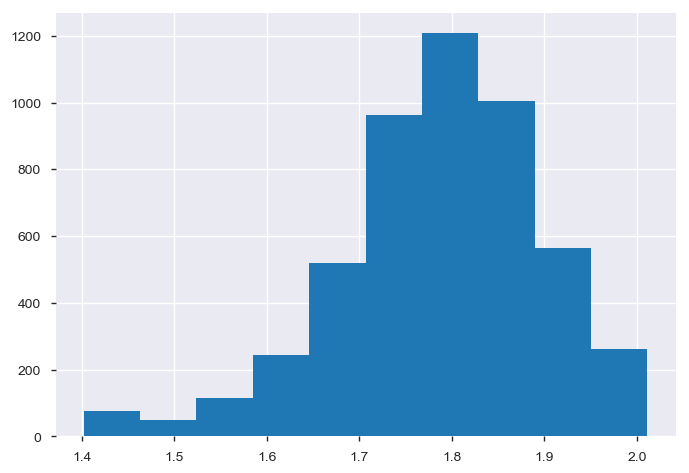

In [294]:
np.log(DataSet3_new.ln_TotalSpend).hist()

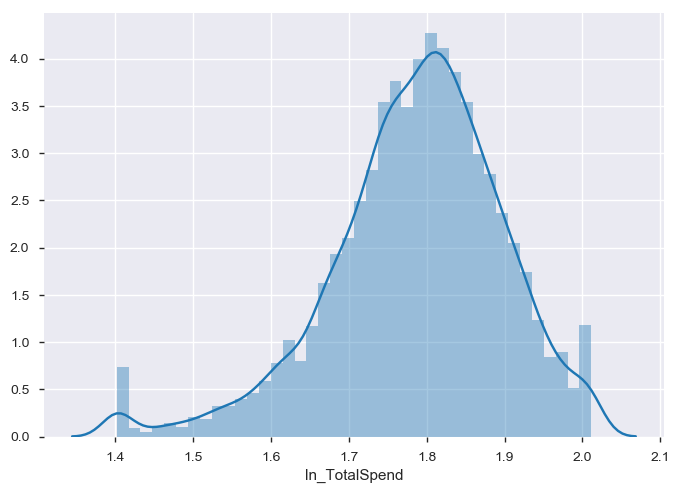

In [295]:
# Distribution of variables
import seaborn as sns
sns.distplot(np.log(DataSet3_new.ln_TotalSpend))

In [296]:
# correlation matrix (ranges from 1 to -1)
corrm=DataSet3_new.corr()

corrm.to_csv('corrm.csv')

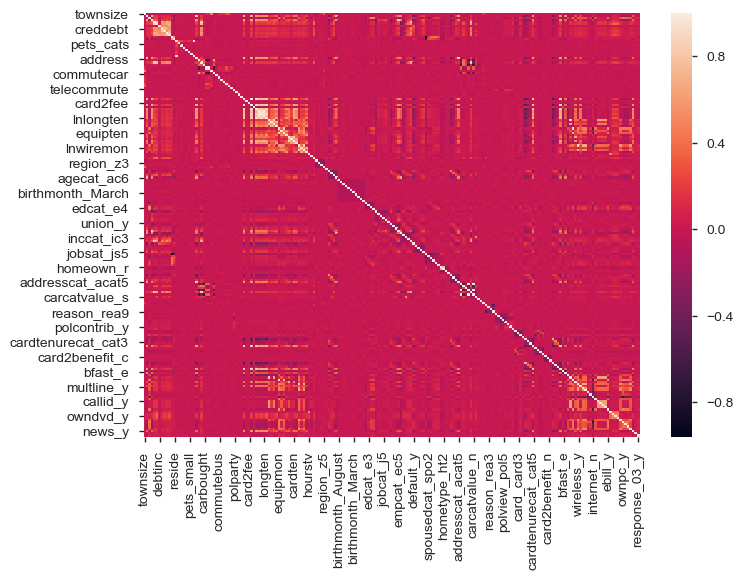

In [297]:
# visualize correlation matrix in Seaborn using a heatmap
sns.heatmap(DataSet3_new.corr())

# Variable Reduction
Recursive Feature Elimination

In [298]:
#DataSet3_new.columns = DataSet3_new.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
#DataSet3_new.columns

In [299]:
DataSet3_new

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,owndvd_y,owncd_y,ownpda_y,ownpc_y,ownipod_y,owngame_y,ownfax_y,news_y,response_02_y,response_03_y
0,2.0,20,15,0,31.00,3.433987,11.1,1.200909,0.183079,2.240091,...,1,0,0,0,1,1,0,0,1,0
1,5.0,22,17,0,15.00,2.708050,18.6,1.222020,0.200505,1.567980,...,1,1,1,1,1,1,1,1,0,0
2,4.0,67,14,16,35.00,3.555348,9.9,0.928620,-0.074056,2.536380,...,1,1,0,0,0,0,0,1,0,0
3,3.0,23,16,0,20.00,2.995732,5.7,0.033160,-3.401690,1.117200,...,1,1,0,1,1,1,0,1,0,0
4,2.0,26,16,1,23.00,3.135494,1.7,0.214659,-1.538705,0.176341,...,1,1,0,1,0,1,0,0,1,0
5,4.0,64,17,22,107.00,4.672829,5.6,1.060584,0.058820,4.931416,...,1,1,1,0,0,0,0,0,1,0
6,5.0,52,14,10,77.00,4.343805,1.9,0.501809,-0.689536,0.961191,...,1,1,0,1,1,0,0,0,0,0
7,4.0,44,16,11,97.00,4.574711,14.4,5.950368,1.783453,8.017632,...,1,1,0,0,0,0,0,1,0,0
8,3.0,66,12,15,16.00,2.772589,2.6,0.102336,-2.279494,0.313664,...,1,1,0,0,0,0,0,0,0,0
9,2.0,47,11,19,84.00,4.430817,4.1,1.770216,0.571102,1.673784,...,1,1,0,0,0,0,0,0,0,0


In [300]:
features = DataSet3_new[DataSet3_new.columns.difference( ['ln_TotalSpend'] )]
target = DataSet3_new['ln_TotalSpend']

In [301]:
features.columns

Index(['active', 'address', 'addresscat_acat2', 'addresscat_acat3',
       'addresscat_acat4', 'addresscat_acat5', 'age', 'agecat_ac3',
       'agecat_ac4', 'agecat_ac5',
       ...
       'tollfree_y', 'tollmon', 'tollten', 'townsize', 'union_y', 'voice_y',
       'vote_y', 'wireless_y', 'wiremon', 'wireten'],
      dtype='object', length=198)

In [302]:
features.shape

(5000, 198)

In [303]:
target

0       5.007029
1       4.350794
2       5.886021
3       5.884464
4       6.230147
5       5.430529
6       6.859048
7       7.173805
8       6.148105
9       5.739182
10      6.698317
11      5.974903
12      6.596805
13      6.885959
14      5.609838
15      5.981717
16      5.996875
17      7.165540
18      6.374650
19      4.063844
20      6.239028
21      5.850045
22      5.732240
23      6.612149
24      6.549479
25      5.680548
26      6.307497
27      5.718671
28      5.710460
29      6.173515
          ...   
4970    5.820439
4971    5.161810
4972    4.063844
4973    5.276378
4974    6.172306
4975    6.868078
4976    5.318218
4977    5.772904
4978    4.332442
4979    5.710824
4980    5.703116
4981    4.511409
4982    5.914016
4983    6.101327
4984    6.354700
4985    6.246165
4986    5.627369
4987    6.043867
4988    5.962628
4989    5.332912
4990    6.375485
4991    5.742394
4992    7.033251
4993    5.834109
4994    6.082082
4995    7.262397
4996    5.903589
4997    7.3315

In [304]:
features.to_csv("features.csv")

In [305]:
target.to_csv("target.csv")

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [306]:
from sklearn.feature_selection import RFE

In [307]:
from sklearn.linear_model import LinearRegression

In [308]:
import itertools

In [309]:
features.shape

(5000, 198)

In [310]:
lm = LinearRegression()

In [311]:
# create the RFE model and select 10 attributes
rfe = RFE(lm, n_features_to_select=60)
rfe = rfe.fit(features,target)

In [312]:
rfe.get_support()

array([False, False, False, False,  True,  True, False, False, False,
       False, False, False, False, False,  True,  True, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False,  True, False, False,
       False,  True,  True,  True,  True, False, False, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False,  True, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False,  True,  True,  True,  True,
       False,  True,  True, False, False, False, False,  True,  True,
        True, False,  True, False,  True, False, False, False,  True,
       False,  True,

In [313]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

import itertools

lm = LinearRegression()

# create the RFE model and select 10 attributes
rfe = RFE(lm, n_features_to_select=60)
rfe = rfe.fit(features,target)

In [314]:
rfe.get_support()

array([False, False, False, False,  True,  True, False, False, False,
       False, False, False, False, False,  True,  True, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False,  True, False, False,
       False,  True,  True,  True,  True, False, False, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False,  True, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False,  True,  True,  True,  True,
       False,  True,  True, False, False, False, False,  True,  True,
        True, False,  True, False,  True, False, False, False,  True,
       False,  True,

In [315]:
# summarize the selection of the attributes
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, rfe.get_support())]

In [316]:
feature_map

[('active', False),
 ('address', False),
 ('addresscat_acat2', False),
 ('addresscat_acat3', False),
 ('addresscat_acat4', True),
 ('addresscat_acat5', True),
 ('age', False),
 ('agecat_ac3', False),
 ('agecat_ac4', False),
 ('agecat_ac5', False),
 ('agecat_ac6', False),
 ('bfast_e', False),
 ('bfast_o', False),
 ('birthmonth_August', False),
 ('birthmonth_December', True),
 ('birthmonth_February', True),
 ('birthmonth_January', False),
 ('birthmonth_July', False),
 ('birthmonth_June', True),
 ('birthmonth_March', False),
 ('birthmonth_May', False),
 ('birthmonth_November', False),
 ('birthmonth_October', False),
 ('birthmonth_September', False),
 ('callcard_y', False),
 ('callid_y', False),
 ('callwait_y', False),
 ('carbought', False),
 ('carbuy_y', False),
 ('carcatvalue_l', True),
 ('carcatvalue_n', False),
 ('carcatvalue_s', True),
 ('card2_d', True),
 ('card2_m', True),
 ('card2_o', True),
 ('card2_v', True),
 ('card2benefit_c', True),
 ('card2benefit_n', True),
 ('card2benefit_o

In [317]:
#Alternative of capturing the important variables
RFE_features=features.columns[rfe.get_support()]

In [318]:
RFE_features

Index(['addresscat_acat4', 'addresscat_acat5', 'birthmonth_December',
       'birthmonth_February', 'birthmonth_June', 'carcatvalue_l',
       'carcatvalue_s', 'card2_d', 'card2_m', 'card2_o', 'card2_v',
       'card2benefit_c', 'card2benefit_n', 'card2benefit_o',
       'card2tenurecat_l2', 'card_card2', 'card_card3', 'card_card4',
       'card_card5', 'cardtenurecat_cat3', 'cardtenurecat_cat4', 'commuterail',
       'default_y', 'edcat_e5', 'gender_m', 'inccat_ic2', 'inccat_ic3',
       'inccat_ic4', 'inccat_ic5', 'internet_d', 'internet_d1', 'jobcat_j4',
       'jobcat_j5', 'jobcat_j6', 'jobsat_js3', 'jobsat_js5', 'lnequipmon',
       'lninc', 'lnwiremon', 'marital_u', 'owntv_y', 'pets_reptiles',
       'pets_saltfish', 'polview_pol3', 'polview_pol4', 'polview_pol5',
       'polview_pol7', 'reason_rea2', 'reason_rea4', 'reason_rea9',
       'region_z5', 'response_03_y', 'spoused', 'spousedcat_spo2',
       'spousedcat_spo3', 'spousedcat_spo4', 'spousedcat_spo5',
       'spousedcat_s

In [319]:
features1 = features[RFE_features]

In [320]:
features1.head()

,addresscat_acat4,addresscat_acat5,birthmonth_December,birthmonth_February,birthmonth_June,carcatvalue_l,carcatvalue_s,card2_d,card2_m,card2_o,...,region_z5,response_03_y,spoused,spousedcat_spo2,spousedcat_spo3,spousedcat_spo4,spousedcat_spo5,spousedcat_spo6,union_y,voice_y
0,0,0,0,0,0,0,0,0,0,1,...,0,0,-1,0,0,0,0,0,1,1
1,0,0,0,0,0,0,0,1,0,0,...,1,0,-1,0,0,0,0,0,0,1
2,0,1,0,0,1,0,0,1,0,0,...,0,0,13,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,18,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,13,0,1,0,0,0,0,1


In [321]:
features1.to_csv("features2.csv")

# F-Regression

In [322]:
# Feature Selection based on importance
from sklearn.feature_selection import f_regression
F_values, p_values  = f_regression(  features1, target )

In [323]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features1.columns, F_values,  ['%.3f' % p for p in p_values])]

In [324]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [325]:
f_reg_results.sort_values(by=['F_Value'],ascending = False)

,Variable,F_Value,P_Value
37,lninc,979.942210,0.000
5,carcatvalue_l,362.711392,0.000
28,inccat_ic5,261.047063,0.000
27,inccat_ic4,158.231494,0.000
47,reason_rea2,113.372065,0.000
15,card_card2,72.100414,0.000
16,card_card3,61.980089,0.000
26,inccat_ic3,59.180235,0.000
6,carcatvalue_s,41.388424,0.000
8,card2_m,37.936645,0.000


In [326]:
f_reg_results.P_Value = pd.to_numeric(f_reg_results.P_Value)

In [327]:
f_reg_results_new=f_reg_results[f_reg_results.P_Value<=0.2]

In [328]:
f_reg_results_new

,Variable,F_Value,P_Value
0,addresscat_acat4,15.206003,0.000
2,birthmonth_December,2.645083,0.104
3,birthmonth_February,1.691716,0.193
5,carcatvalue_l,362.711392,0.000
6,carcatvalue_s,41.388424,0.000
7,card2_d,17.147552,0.000
8,card2_m,37.936645,0.000
9,card2_o,13.881408,0.000
10,card2_v,28.810884,0.000
15,card_card2,72.100414,0.000


In [329]:
f_reg_results_new.to_csv("f_reg_results_new1.csv")

In [330]:
f_reg_results_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42 entries, 0 to 59
Data columns (total 3 columns):
Variable    42 non-null object
F_Value     42 non-null float64
P_Value     42 non-null float64
dtypes: float64(2), object(1)
memory usage: 1.3+ KB


# Variable reduction using Select K-Best technique

In [331]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif

In [332]:
features = DataSet3_new[DataSet3_new.columns.difference( ['ln_TotalSpend'] )]
target = DataSet3_new['ln_TotalSpend']
features_new = SelectKBest(f_classif, k=30).fit(features, target )

In [333]:
features_new.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False,  True, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True, False,
        True, False,

In [334]:
features_new.scores_

array([0.99558822, 0.92536224, 1.08704152, 1.0414592 , 0.94161071,
       0.82063665, 0.90102018, 1.10381184, 1.10587352, 0.91862271,
       0.93020365, 1.01799554, 0.86633879, 1.26632032, 1.02719361,
       0.81153137, 0.97480409, 0.77302604, 0.82525139, 1.13961749,
       1.43564649, 1.03391606, 0.85953583, 1.22335687, 1.04965806,
       0.96246007, 0.94495912, 0.97175901, 1.00279754, 1.11201822,
       1.09354761, 1.06791064, 0.94733587, 0.89716336, 1.80695462,
       0.94615713, 1.05075485, 1.12185801, 1.17498667, 1.10060702,
       1.02745464, 1.25973718, 1.06537134, 0.8898364 , 0.940273  ,
       0.90447528, 1.02399857, 0.96103406, 1.01105412, 1.38926354,
       1.01883609, 0.96917035, 0.96847512, 0.98360157, 1.01073485,
       1.30856787, 0.96295454, 1.14830047, 0.93056025, 0.95537703,
       1.09354761, 1.00342923, 1.11380553, 0.95023453, 1.09354761,
       1.03295509, 1.12647526, 1.0161885 , 1.10381263, 0.95756014,
       0.98967281, 1.08831692, 1.01056788, 0.83970671, 1.02716

In [335]:
# summarize the selection of the attributes
import itertools
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, features_new.get_support())]
feature_map
#Alternative of capturing the important variables
KBest_features=features.columns[features_new.get_support()]

selected_features_from_KBest = features[KBest_features]

In [336]:
KBest_features

Index(['birthmonth_August', 'birthmonth_May', 'birthmonth_September',
       'card2_o', 'card2benefit_o', 'card2tenurecat_l1', 'card_card5',
       'cardtenurecat_cat2', 'cardtenurecat_cat4', 'default_y', 'ed',
       'inccat_ic2', 'inccat_ic3', 'inccat_ic4', 'internet_d1', 'lncardten',
       'lncreddebt', 'lnequipten', 'lnlongten', 'lnothdebt', 'lntollmon',
       'lntollten', 'lnwireten', 'ownfax_y', 'ownpda_y', 'pets_saltfish',
       'reason_rea2', 'response_03_y', 'spousedcat_spo3', 'spousedcat_spo6'],
      dtype='object')

# Variance Inflation Factor (VIF)

In [337]:
list_vars1 = list(f_reg_results_new.Variable)
list_vars1

['addresscat_acat4',
 'birthmonth_December',
 'birthmonth_February',
 'carcatvalue_l',
 'carcatvalue_s',
 'card2_d',
 'card2_m',
 'card2_o',
 'card2_v',
 'card_card2',
 'card_card3',
 'card_card4',
 'card_card5',
 'cardtenurecat_cat3',
 'cardtenurecat_cat4',
 'default_y',
 'edcat_e5',
 'gender_m',
 'inccat_ic2',
 'inccat_ic3',
 'inccat_ic4',
 'inccat_ic5',
 'jobsat_js5',
 'lnequipmon',
 'lninc',
 'lnwiremon',
 'marital_u',
 'owntv_y',
 'pets_reptiles',
 'polview_pol4',
 'reason_rea2',
 'reason_rea4',
 'reason_rea9',
 'region_z5',
 'response_03_y',
 'spoused',
 'spousedcat_spo2',
 'spousedcat_spo4',
 'spousedcat_spo5',
 'spousedcat_spo6',
 'union_y',
 'voice_y']

In [338]:
all_columns = "+".join(list_vars1)
my_formula = "ln_TotalSpend~" + all_columns

print(my_formula)

ln_TotalSpend~addresscat_acat4+birthmonth_December+birthmonth_February+carcatvalue_l+carcatvalue_s+card2_d+card2_m+card2_o+card2_v+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat3+cardtenurecat_cat4+default_y+edcat_e5+gender_m+inccat_ic2+inccat_ic3+inccat_ic4+inccat_ic5+jobsat_js5+lnequipmon+lninc+lnwiremon+marital_u+owntv_y+pets_reptiles+polview_pol4+reason_rea2+reason_rea4+reason_rea9+region_z5+response_03_y+spoused+spousedcat_spo2+spousedcat_spo4+spousedcat_spo5+spousedcat_spo6+union_y+voice_y


In [339]:
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
import statsmodels.formula.api as sm

In [340]:
model = sm.ols('ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac3+agecat_ac4+agecat_ac5+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e3+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+empcat_ec5+retire_y+inccat_ic2+inccat_ic3+inccat_ic4+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+marital_u+spousedcat_spo2+spousedcat_spo3+spousedcat_spo4+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat4+addresscat_acat5+carown_n+carown_o+cartype_i+cartype_n+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol4+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat_cat3+cardtenurecat_cat4+cardtenurecat_cat5+card2_d+card2_m+card2_o+card2_v+card2benefit_c+card2benefit_n+card2benefit_o+card2tenurecat_l1+card2tenurecat_l2+card2tenurecat_l3+card2tenurecat_m+bfast_e+bfast_o+churn_y+tollfree_y+equip_y+callcard_y+wireless_y+multline_y+voice_y+pager_y+internet_d+internet_d1+internet_n+internet_o+callid_y+callwait_y+forward_y+confer_y+ebill_y+owntv_y+ownvcr_y+owndvd_y+owncd_y+ownpda_y+ownpc_y+ownipod_y+owngame_y+ownfax_y+news_y+response_02_y+response_03_y+card2tenure+tenure+lninc+lnothdebt+wiremon+wireten+commutecat+commute+pets+pets_freshfish+lncardmon+cardmon+spoused+reside+debtinc+pets_dogs+commutebus+pets_saltfish+card2fee+commutenonmotor+active+cardtenure+lnlongten+lnlongmon+longten+cardten+longmon+address+employ+lncardten+age+lntollten+tollten+lnequipten+lntollmon+lnwireten+othdebt+income+lncreddebt+creddebt+carvalue+equipten+equipmon+lnequipmon+cars+commutecar',data = DataSet3_new)

In [341]:
model = model.fit()

In [342]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          ln_TotalSpend   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                     16.20
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:01:27   Log-Likelihood:                -3756.5
No. Observations:                5000   AIC:                             7861.
Df Residuals:                    4826   BIC:                             8995.
Df Model:                         173                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                5.8533      1.160      5.044      0.000       3.578       8.128
region_z2                0.0215      0.024      0.906      0.365      -0.025       0.068
region_z3               -0.0100      0.024     -0.418      0.676      -0.057       0.037
region_z4                0.0185      0.024      0.770      0.442      -0.029       0.066
region_z5                0.0561      0.024      2.346      0.019       0.009       0.103
gender_m                 0.0531      0.015      3.511      0.000       0.023       0.083
agecat_ac3               0.0501      0.045      1.112      0.266      -0.038       0.138
agecat_ac4               0.0879      0.062      1.429      0.153      -0.033       0.209
agecat_ac5               0.1223      0.082      1.486      0.137      -0.039       0.284
agecat_ac6               0.1679      0.105      1.602      0.109      -0.038       0.373
birthmonth_August        0.0189      0.038      0.502      0.616      -0.055       0.093
birthmonth_December      0.0480      0.038      1.271      0.204      -0.026       0.122
birthmonth_February     -0.0337      0.037     -0.901      0.368      -0.107       0.040
birthmonth_January       0.0124      0.037      0.333      0.739      -0.061       0.086
birthmonth_July          0.0101      0.037      0.269      0.788      -0.063       0.083
birthmonth_June          0.0439      0.037      1.180      0.238      -0.029       0.117
birthmonth_March         0.0040      0.037      0.106      0.915      -0.069       0.077
birthmonth_May           0.0196      0.037      0.535      0.592      -0.052       0.091
birthmonth_November     -0.0089      0.038     -0.237      0.813      -0.083       0.065
birthmonth_October       0.0215      0.037      0.576      0.565      -0.052       0.095
birthmonth_September     0.0138      0.037      0.377      0.706      -0.058       0.086
edcat_e2                -0.0377      0.024     -1.589      0.112      -0.084       0.009
edcat_e3                -0.0406      0.028     -1.447      0.148      -0.096       0.014
edcat_e4                -0.0619      0.031     -2.010      0.045      -0.122      -0.002
edcat_e5                -0.1083      0.043     -2.544      0.011      -0.192      -0.025
jobcat_j2                0.0067      0.022      0.311      0.756      -0.036       0.049
jobcat_j3               -0.0097      0.027     -0.359      0.720      -0.063       0.043
jobcat_j4               -0.0684      0.041     -1.653      0.098      -0.150       0.013
jobcat_j5               -0.0646      0.031     -2.058      0.040      -0.126      -0.003
jobcat_j6               -0.0595      0.028     -2.125      0.034      -0.114      -0.005
union_y                  0.0326      0.021      1.537      0.124      -0.009       0.074
empcat_ec2               0.0216      0.031      0.694    

In [343]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          ln_TotalSpend   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                  0.345
Method:                 Least Squares   F-statistic:                     16.20
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:01:28   Log-Likelihood:                -3756.5
No. Observations:                5000   AIC:                             7861.
Df Residuals:                    4826   BIC:                             8995.
Df Model:                         173                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                5.8533 

In [344]:
my_formula ='ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac4+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e3+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+retire_y+inccat_ic2+inccat_ic3+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+spousedcat_spo3+spousedcat_spo4+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat5+carown_o+cartype_i+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol4+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat_cat4+card2_d+card2_m+card2_o+card2_v+card2benefit_c+card2benefit_n+card2benefit_o+card2tenurecat_l1+card2tenurecat_l2+card2tenurecat_m+bfast_e+bfast_o+churn_y+multline_y+voice_y+pager_y+internet_d+internet_d1+internet_n+internet_o+callid_y+callwait_y+forward_y+confer_y+ebill_y+owntv_y+ownvcr_y+owndvd_y+owncd_y+ownpda_y+ownpc_y+ownipod_y+owngame_y+ownfax_y+news_y+response_02_y+response_03_y+lnothdebt+wireten+commute+pets+pets_freshfish+lncardmon+spoused+reside+debtinc+pets_dogs+commutebus+pets_saltfish+card2fee+commutenonmotor+active+cardten+longmon+address+employ+lncardten+lntollten+tollten+lnequipten+lntollmon+lnwireten+othdebt+lncreddebt+creddebt+equipmon+lnequipmon+cars+commutecar'
my_formula

'ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac4+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e3+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+retire_y+inccat_ic2+inccat_ic3+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+spousedcat_spo3+spousedcat_spo4+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat5+carown_o+cartype_i+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol4+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat

In [345]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [346]:
# get y and X dataframes based on this regression
y, X = dmatrices(my_formula,DataSet3_new,return_type='dataframe')

In [347]:
# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

vif.round(1)

,VIF Factor,features
0,1601.5,Intercept
1,1.6,region_z2
2,1.7,region_z3
3,1.6,region_z4
4,1.7,region_z5
5,1.0,gender_m
6,1.5,agecat_ac4
7,2.5,agecat_ac6
8,1.9,birthmonth_August
9,1.9,birthmonth_December


In [348]:
vif.round(1).to_csv("vif.round(1)1.csv")

Transformation on numerical variables

In [349]:
DataSet4 = DataSet3.loc[:,[ 'townsize', 'age', 'ed', 'employ', 'income', 'lninc', 'debtinc', 'creddebt', 'lncreddebt', 'othdebt', 'lnothdebt', 'spoused', 'reside', 'pets', 'pets_cats', 'pets_dogs', 'pets_birds', 'pets_reptiles', 'pets_small', 'pets_saltfish', 'pets_freshfish', 'address', 'cars', 'carvalue', 'carbought', 'commute', 'commutecat', 'commutetime', 'commutecar', 'commutecarpool', 'commutebus', 'commuterail', 'commutepublic', 'commutewalk', 'commutenonmotor', 'telecommute', 'polparty', 'cardtype', 'cardbenefit', 'cardfee', 'cardtenure', 'card2type', 'card2fee', 'card2tenure', 'active', 'tenure', 'longmon', 'lnlongmon', 'longten', 'lnlongten', 'tollmon', 'lntollmon', 'tollten', 'lntollten', 'equipmon', 'lnequipmon', 'equipten', 'lnequipten', 'cardmon', 'lncardmon', 'cardten', 'lncardten', 'wiremon', 'lnwiremon', 'wireten', 'lnwireten', 'hourstv', 'response_01', 'ln_TotalSpend']]
DataSet4

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,2.0,20,15,0,31,3.433987,11.1,1.200909,0.183079,2.240091,...,2.656757,60.0,4.094345,0.00,NaN,0.00,NaN,13,0,5.007029
1,5.0,22,17,0,15,2.708050,18.6,1.222020,0.200505,1.567980,...,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.428660,18,0,4.350794
2,4.0,67,14,16,35,3.555348,9.9,0.928620,-0.074056,2.536380,...,3.135494,1410.0,7.251345,0.00,NaN,0.00,NaN,21,0,5.886021
3,3.0,23,16,0,20,2.995732,5.7,0.022800,-3.780995,1.117200,...,3.044522,685.0,6.529419,0.00,NaN,0.00,NaN,26,1,5.884464
4,2.0,26,16,1,23,3.135494,1.7,0.214659,-1.538705,0.176341,...,2.847812,360.0,5.886104,19.05,2.947067,410.80,6.018106,27,0,6.230147
5,4.0,64,17,22,107,4.672829,5.6,1.060584,0.058820,4.931416,...,3.341093,765.0,6.639876,0.00,NaN,0.00,NaN,21,0,5.430529
6,5.0,52,14,10,77,4.343805,1.9,0.501809,-0.689536,0.961191,...,NaN,0.0,NaN,0.00,NaN,0.00,NaN,19,0,6.859048
7,4.0,44,16,11,97,4.574711,14.4,5.950368,1.783453,8.017632,...,2.674149,630.0,6.445720,0.00,NaN,0.00,NaN,13,0,7.173805
8,3.0,66,12,15,16,2.772589,2.6,0.102336,-2.279494,0.313664,...,2.740840,830.0,6.721426,0.00,NaN,0.00,NaN,25,1,6.148105
9,2.0,47,11,19,84,4.430817,4.1,1.770216,0.571102,1.673784,...,NaN,0.0,NaN,0.00,NaN,0.00,NaN,21,0,5.739182


In [350]:
import numpy as np
DataSet5 = np.sqrt(DataSet4)
DataSet5

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in sqrt
  


,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,1.414214,4.472136,3.872983,0.000000,5.567764,1.853102,3.331666,1.095860,0.427877,1.496693,...,1.629956,7.745967,2.023449,0.000000,NaN,0.000000,NaN,3.605551,0.0,2.237639
1,2.236068,4.690416,4.123106,0.000000,3.872983,1.645615,4.312772,1.105450,0.447778,1.252190,...,1.665109,24.698178,2.532481,6.756478,1.954739,41.031086,2.725557,4.242641,0.0,2.085856
2,2.000000,8.185353,3.741657,4.000000,5.916080,1.885563,3.146427,0.963649,NaN,1.592602,...,1.770733,37.549967,2.692832,0.000000,NaN,0.000000,NaN,4.582576,0.0,2.426112
3,1.732051,4.795832,4.000000,0.000000,4.472136,1.730818,2.387467,0.150997,NaN,1.056977,...,1.744856,26.172505,2.555273,0.000000,NaN,0.000000,NaN,5.099020,1.0,2.425791
4,1.414214,5.099020,4.000000,1.000000,4.795832,1.770733,1.303840,0.463313,NaN,0.419930,...,1.687546,18.973666,2.426129,4.364631,1.716702,20.268202,2.453183,5.196152,0.0,2.496026
5,2.000000,8.000000,4.123106,4.690416,10.344080,2.161673,2.366432,1.029847,0.242528,2.220679,...,1.827866,27.658633,2.576796,0.000000,NaN,0.000000,NaN,4.582576,0.0,2.330350
6,2.236068,7.211103,3.741657,3.162278,8.774964,2.084180,1.378405,0.708385,NaN,0.980403,...,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,4.358899,0.0,2.618978
7,2.000000,6.633250,4.000000,3.316625,9.848858,2.138857,3.794733,2.439338,1.335460,2.831542,...,1.635282,25.099801,2.538842,0.000000,NaN,0.000000,NaN,3.605551,0.0,2.678396
8,1.732051,8.124038,3.464102,3.872983,4.000000,1.665109,1.612452,0.319900,NaN,0.560057,...,1.655548,28.809721,2.592571,0.000000,NaN,0.000000,NaN,5.000000,1.0,2.479537
9,1.414214,6.855655,3.316625,4.358899,9.165151,2.104951,2.024846,1.330495,0.755713,1.293748,...,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,4.582576,0.0,2.395659


In [351]:
DataSet5.to_csv("DataSet5_1.csv")

In [352]:
DataSet6 = DataSet4**2
DataSet6

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,4.0,400,225,0,961,11.792268,123.21,1.442182,0.033518,5.018008,...,7.058357,3600.0,16.763657,0.0000,NaN,0.000000e+00,NaN,169,0,25.070337
1,25.0,484,289,0,225,7.333536,345.96,1.493333,0.040202,2.458561,...,7.687248,372100.0,41.132456,2083.9225,14.600069,2.834341e+06,55.184988,324,0,18.929408
2,16.0,4489,196,256,1225,12.640500,98.01,0.862335,0.005484,6.433224,...,9.831324,1988100.0,52.582004,0.0000,NaN,0.000000e+00,NaN,441,0,34.645240
3,9.0,529,256,0,400,8.974412,32.49,0.000520,14.295921,1.248136,...,9.269117,469225.0,42.633310,0.0000,NaN,0.000000e+00,NaN,676,1,34.626914
4,4.0,676,256,1,529,9.831324,2.89,0.046078,2.367612,0.031096,...,8.110034,129600.0,34.646221,362.9025,8.685205,1.687566e+05,36.217606,729,0,38.814728
5,16.0,4096,289,484,11449,21.835329,31.36,1.124838,0.003460,24.318864,...,11.162905,585225.0,44.087951,0.0000,NaN,0.000000e+00,NaN,441,0,29.490647
6,25.0,2704,196,100,5929,18.868646,3.61,0.251812,0.475459,0.923888,...,NaN,0.0,NaN,0.0000,NaN,0.000000e+00,NaN,361,0,47.046541
7,16.0,1936,256,121,9409,20.927981,207.36,35.406879,3.180705,64.282423,...,7.151071,396900.0,41.547304,0.0000,NaN,0.000000e+00,NaN,169,0,51.463479
8,9.0,4356,144,225,256,7.687248,6.76,0.010473,5.196092,0.098385,...,7.512204,688900.0,45.177563,0.0000,NaN,0.000000e+00,NaN,625,1,37.799195
9,4.0,2209,121,361,7056,19.632138,16.81,3.133665,0.326157,2.801553,...,NaN,0.0,NaN,0.0000,NaN,0.000000e+00,NaN,441,0,32.938208


In [353]:
DataSet6.to_csv("DataSet6_1.csv")

In [354]:
DataSet7 = np.exp(DataSet4)
DataSet7

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,7.389056,4.851652e+08,3.269017e+06,1.000000e+00,2.904885e+13,31.0,6.617116e+04,3.323136,1.200909,9.394186e+00,...,14.25,1.142007e+26,60.0,1.000000e+00,NaN,1.000000e+00,NaN,4.424134e+05,1.000000,149.46
1,148.413159,3.584913e+09,2.415495e+07,1.000000e+00,3.269017e+06,15.0,1.196403e+08,3.394037,1.222020,4.796949e+00,...,16.00,8.310630e+264,610.0,6.691802e+19,45.65,inf,1683.55,6.565997e+07,1.000000,77.54
2,54.598150,1.252363e+29,1.202604e+06,8.886111e+06,1.586013e+15,35.0,1.993037e+04,2.531014,0.928620,1.263385e+01,...,23.00,inf,1410.0,1.000000e+00,NaN,1.000000e+00,NaN,1.318816e+09,1.000000,359.97
3,20.085537,9.744803e+09,8.886111e+06,1.000000e+00,4.851652e+08,20.0,2.988674e+02,1.023062,0.022800,3.056285e+00,...,21.00,3.102559e+297,685.0,1.000000e+00,NaN,1.000000e+00,NaN,1.957296e+11,2.718282,359.41
4,7.389056,1.957296e+11,8.886111e+06,2.718282e+00,9.744803e+09,23.0,5.473947e+00,1.239439,0.214659,1.192845e+00,...,17.25,2.218265e+156,360.0,1.876333e+08,19.05,2.559606e+178,410.80,5.320482e+11,1.000000,507.83
5,54.598150,6.235149e+27,2.415495e+07,3.584913e+09,2.947878e+46,107.0,2.704264e+02,2.888057,1.060584,1.385756e+02,...,28.25,inf,765.0,1.000000e+00,NaN,1.000000e+00,NaN,1.318816e+09,1.000000,228.27
6,148.413159,3.831008e+22,1.202604e+06,2.202647e+04,2.758513e+33,77.0,6.685894e+00,1.651707,0.501809,2.614809e+00,...,NaN,1.000000e+00,NaN,1.000000e+00,NaN,1.000000e+00,NaN,1.784823e+08,1.000000,952.46
7,54.598150,1.285160e+19,8.886111e+06,5.987414e+04,1.338335e+42,97.0,1.794075e+06,383.894586,5.950368,3.033984e+03,...,14.50,4.032029e+273,630.0,1.000000e+00,NaN,1.000000e+00,NaN,4.424134e+05,1.000000,1304.80
8,20.085537,4.607187e+28,1.627548e+05,3.269017e+06,8.886111e+06,16.0,1.346374e+01,1.107756,0.102336,1.368430e+00,...,15.50,inf,830.0,1.000000e+00,NaN,1.000000e+00,NaN,7.200490e+10,2.718282,467.83
9,7.389056,2.581313e+20,5.987414e+04,1.784823e+08,3.025077e+36,84.0,6.034029e+01,5.872122,1.770216,5.332307e+00,...,NaN,1.000000e+00,NaN,1.000000e+00,NaN,1.000000e+00,NaN,1.318816e+09,1.000000,310.81


In [355]:
DataSet7.to_csv("DataSet7_1.csv")

In [356]:
DataSet8 = DataSet4.apply(lambda x: np.log10(x+1) if np.issubdtype(x.dtype, np.number) else x)
DataSet8

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log10
  """Entry point for launching an IPython kernel.
C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,0.477121,1.322219,1.204120,0.000000,1.505150,0.646794,1.082785,0.342602,0.073014,0.510557,...,0.563096,1.785330,0.707088,0.000000,NaN,0.000000,NaN,1.146128,0.00000,0.778660
1,0.778151,1.361728,1.255273,0.000000,1.204120,0.569146,1.292256,0.346748,0.079364,0.409592,...,0.576639,2.786041,0.870021,1.668852,0.683137,3.226484,0.925759,1.278754,0.00000,0.728418
2,0.698970,1.832509,1.176091,1.230449,1.556303,0.658522,1.037426,0.285247,-0.033415,0.548559,...,0.616527,3.149527,0.916525,0.000000,NaN,0.000000,NaN,1.342423,0.00000,0.837968
3,0.602060,1.380211,1.230449,0.000000,1.322219,0.601596,0.826075,0.009791,NaN,0.325762,...,0.606867,2.836324,0.876761,0.000000,NaN,0.000000,NaN,1.431364,0.30103,0.837870
4,0.477121,1.431364,1.230449,0.301030,1.380211,0.616527,0.431364,0.084454,NaN,0.070533,...,0.585214,2.557507,0.837974,1.302114,0.596275,2.614686,0.846220,1.447158,0.00000,0.859147
5,0.698970,1.812913,1.255273,1.361728,2.033424,0.753800,0.819544,0.313990,0.024822,0.773158,...,0.637599,2.884229,0.883086,0.000000,NaN,0.000000,NaN,1.342423,0.00000,0.808247
6,0.778151,1.724276,1.176091,1.041393,1.892095,0.727851,0.462398,0.176615,-0.507988,0.292520,...,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,1.301030,0.00000,0.895370
7,0.698970,1.653213,1.230449,1.079181,1.991226,0.746222,1.187521,0.842008,0.444584,0.955093,...,0.565157,2.800029,0.871907,0.000000,NaN,0.000000,NaN,1.146128,0.00000,0.912424
8,0.602060,1.826075,1.113943,1.204120,1.230449,0.576639,0.556303,0.042314,NaN,0.118484,...,0.572969,2.919601,0.887697,0.000000,NaN,0.000000,NaN,1.414973,0.30103,0.854191
9,0.477121,1.681241,1.079181,1.301030,1.929419,0.734865,0.707570,0.442514,0.196204,0.427126,...,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,1.342423,0.00000,0.828607


In [357]:
DataSet8.to_csv("DataSet8_1.csv")

In [358]:
DataSet5.corr()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
townsize,1.000000,-0.075683,0.002087,-0.065483,-0.003268,0.004440,-0.022933,-0.033516,-0.057343,-0.009583,...,-0.000382,-0.025552,-0.019990,0.007744,-0.018637,-0.002659,-0.045809,0.005842,-0.005534,0.012093
age,-0.075683,1.000000,-0.091526,0.782981,0.221948,0.168230,0.042789,0.157180,0.205623,0.176007,...,0.177256,0.487759,0.513845,-0.042317,0.268826,0.065069,0.501078,-0.039086,0.014762,0.014674
ed,0.002087,-0.091526,1.000000,-0.222396,0.197754,0.203681,0.016680,0.130885,0.081537,0.149997,...,-0.017652,-0.080798,-0.058232,0.341453,0.232190,0.300436,0.070043,0.001780,-0.119254,0.095293
employ,-0.065483,0.782981,-0.222396,1.000000,0.357091,0.304360,0.031978,0.239418,0.286840,0.264693,...,0.191365,0.512555,0.503595,-0.049395,0.261062,0.063244,0.491586,0.008697,0.033343,0.076828
income,-0.003268,0.221948,0.197754,0.357091,1.000000,0.944009,0.010091,0.648326,0.534515,0.717288,...,0.085785,0.205434,0.173738,0.206457,0.269269,0.248737,0.300678,0.114902,-0.004323,0.373120
lninc,0.004440,0.168230,0.203681,0.304360,0.944009,1.000000,0.007770,0.599497,0.540352,0.673808,...,0.072079,0.164813,0.148567,0.202099,0.271975,0.232486,0.301575,0.177563,-0.001479,0.398583
debtinc,-0.022933,0.042789,0.016680,0.031978,0.010091,0.007770,1.000000,0.523821,0.332237,0.597548,...,-0.001347,0.016518,0.021097,-0.004394,0.014417,0.003409,0.038768,-0.012535,0.008584,0.013399
creddebt,-0.033516,0.157180,0.130885,0.239418,0.648326,0.599497,0.523821,1.000000,0.873339,0.682518,...,0.046140,0.134253,0.109860,0.118254,0.154201,0.150501,0.189567,0.066772,0.001137,0.249548
lncreddebt,-0.057343,0.205623,0.081537,0.286840,0.534515,0.540352,0.332237,0.873339,1.000000,0.511616,...,0.073528,0.156517,0.150741,0.066490,0.144349,0.103650,0.204805,0.037168,0.017361,0.211913
othdebt,-0.009583,0.176007,0.149997,0.264693,0.717288,0.673808,0.597548,0.682518,0.511616,1.000000,...,0.062041,0.156436,0.138563,0.152243,0.215397,0.187792,0.242421,0.080532,0.005898,0.275818


In [359]:
DataSet5.corr().to_csv("corr5.csv")

In [360]:
DataSet6.corr()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
townsize,1.000000,-0.071776,0.002221,-0.044985,0.013193,-0.002719,-0.008589,0.012382,-0.011892,0.017015,...,0.000802,0.011866,-0.013774,0.000602,-0.015892,-0.004030,-0.032485,0.001147,-0.006487,0.004690
age,-0.071776,1.000000,-0.095432,0.591797,0.077628,0.098538,0.029191,0.032739,0.057320,0.041666,...,0.175620,0.246560,0.494116,0.006938,0.247146,0.099965,0.494149,-0.015999,0.014154,-0.022026
ed,0.002221,-0.095432,1.000000,-0.183672,0.101288,0.212101,0.002654,0.045081,0.000342,0.059795,...,-0.010674,-0.045349,-0.060217,0.296266,0.251146,0.185081,0.093754,-0.014231,-0.113074,0.098998
employ,-0.044985,0.591797,-0.183672,1.000000,0.147515,0.208728,0.029963,0.057922,0.071002,0.084378,...,0.176105,0.247230,0.385983,0.005097,0.215709,0.088272,0.381129,-0.005397,0.043926,0.046191
income,0.013193,0.077628,0.101288,0.147515,1.000000,0.477445,0.021266,0.779829,0.217842,0.807766,...,0.033609,0.052172,0.079279,0.131426,0.115365,0.134418,0.136233,0.020407,-0.010888,0.184213
lninc,-0.002719,0.098538,0.212101,0.208728,0.477445,1.000000,0.019110,0.217827,0.076503,0.284524,...,0.081554,0.063199,0.165002,0.200818,0.276618,0.177154,0.327168,0.048291,-0.003132,0.404704
debtinc,-0.008589,0.029191,0.002654,0.029963,0.021266,0.019110,1.000000,0.097475,0.000427,0.148637,...,0.010517,0.002843,0.020465,-0.003094,0.010471,0.005949,0.040564,-0.011657,-0.004648,0.018156
creddebt,0.012382,0.032739,0.045081,0.057922,0.779829,0.217827,0.097475,1.000000,0.240851,0.684057,...,0.008447,0.014714,0.031200,0.045902,0.035634,0.058575,0.064510,0.030451,-0.005307,0.101938
lncreddebt,-0.011892,0.057320,0.000342,0.071002,0.217842,0.076503,0.000427,0.240851,1.000000,0.183894,...,0.040992,0.033189,0.054886,0.018577,0.034374,0.036734,0.059408,0.020729,0.019519,0.004649
othdebt,0.017015,0.041666,0.059795,0.084378,0.807766,0.284524,0.148637,0.684057,0.183894,1.000000,...,0.004678,0.018407,0.039942,0.090731,0.072181,0.099332,0.088684,0.020828,-0.009175,0.132396


In [361]:
DataSet6.corr().to_csv("corr6.csv")

In [362]:
DataSet7.corr()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
townsize,1.000000,-0.041161,0.006710,-0.011484,-0.0,-0.001416,-0.009091,0.004818,-0.015096,0.031420,...,0.001681,NaN,0.003325,0.004818,-0.011663,NaN,-0.012843,0.042504,-0.003343,-0.000969
age,-0.041161,1.000000,-0.001663,0.075419,NaN,-0.099397,-0.003577,-0.002511,-0.053738,-0.002511,...,0.054614,NaN,0.127711,-0.002511,0.054242,NaN,0.124173,-0.001448,0.016546,-0.073348
ed,0.006710,-0.001663,1.000000,-0.004279,0.0,0.106662,-0.004378,0.002476,0.067309,-0.001079,...,0.002643,NaN,-0.018741,0.038411,0.160907,NaN,0.086524,0.000488,-0.037445,0.037487
employ,-0.011484,0.075419,-0.004279,1.000000,-0.0,0.009758,-0.000388,-0.000272,0.011295,-0.000272,...,0.026251,NaN,0.037890,-0.000272,-0.000400,NaN,0.021772,-0.001005,0.014246,0.024987
income,-0.000000,NaN,0.000000,-0.000000,NaN,0.000000,-0.000000,-0.000000,0.000000,-0.000000,...,-0.000000,NaN,-0.000000,NaN,0.000000,NaN,0.000000,-0.000000,-0.000000,0.000000
lninc,-0.001416,-0.099397,0.106662,0.009758,0.0,1.000000,-0.006268,0.260087,0.667857,0.240164,...,0.074231,0.0,0.124726,-0.005047,0.221375,-0.0,0.272782,-0.014109,-0.007106,0.372731
debtinc,-0.009091,-0.003577,-0.004378,-0.000388,-0.0,-0.006268,1.000000,-0.000285,0.027436,-0.000285,...,-0.006762,NaN,-0.006915,-0.000285,-0.002694,NaN,0.005787,-0.001062,-0.006090,-0.006950
creddebt,0.004818,-0.002511,0.002476,-0.000272,-0.0,0.260087,-0.000285,1.000000,0.444003,-0.000200,...,-0.006265,NaN,0.003059,-0.000200,0.008027,NaN,0.031564,-0.000577,-0.004272,0.124646
lncreddebt,-0.015096,-0.053738,0.067309,0.011295,0.0,0.667857,0.027436,0.444003,1.000000,0.271803,...,0.035350,0.0,0.064020,-0.007415,0.091947,-0.0,0.148791,-0.016919,-0.001422,0.265357
othdebt,0.031420,-0.002511,-0.001079,-0.000272,-0.0,0.240164,-0.000285,-0.000200,0.271803,1.000000,...,-0.015236,NaN,-0.008132,-0.000200,0.001481,NaN,0.010691,-0.000744,-0.004272,0.109335


In [363]:
DataSet7.corr().to_csv("corr7.csv")

In [364]:
DataSet8.corr()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
townsize,1.000000,-0.073988,0.001901,-0.066808,0.001386,0.006031,-0.023132,-0.036556,-0.018115,-0.009456,...,-0.000411,-0.029307,-0.020650,0.009235,-0.018921,0.005032,-0.047026,0.009993,-0.005270,0.014015
age,-0.073988,1.000000,-0.086473,0.806360,0.226778,0.198129,0.043662,0.177937,0.121955,0.198409,...,0.173372,0.409349,0.512478,-0.047542,0.271808,-0.008207,0.498071,-0.037172,0.013785,0.026995
ed,0.001901,-0.086473,1.000000,-0.217833,0.200369,0.199132,0.019883,0.130726,0.089239,0.151756,...,-0.019186,-0.065993,-0.057821,0.330354,0.225617,0.319647,0.062276,0.009232,-0.120230,0.092973
employ,-0.066808,0.806360,-0.217833,1.000000,0.340185,0.312118,0.029498,0.245830,0.178159,0.266249,...,0.181611,0.424874,0.504473,-0.059626,0.256118,-0.017802,0.487527,0.012759,0.029183,0.078118
income,0.001386,0.226778,0.200369,0.340185,1.000000,0.993233,0.003605,0.625416,0.444681,0.698264,...,0.077481,0.175180,0.159438,0.192608,0.275976,0.207880,0.302170,0.185927,-0.002175,0.390120
lninc,0.006031,0.198129,0.199132,0.312118,0.993233,1.000000,0.002737,0.607096,0.449256,0.683993,...,0.069509,0.157340,0.143739,0.189268,0.269009,0.202932,0.292850,0.216650,-0.001147,0.394054
debtinc,-0.023132,0.043662,0.019883,0.029498,0.003605,0.002737,1.000000,0.537570,0.378992,0.634953,...,-0.004952,0.014897,0.018782,-0.006443,0.013604,-0.003327,0.035343,-0.010871,0.010442,0.010875
creddebt,-0.036556,0.177937,0.130726,0.245830,0.625416,0.607096,0.537570,1.000000,0.737555,0.679474,...,0.046331,0.130523,0.112228,0.107683,0.165712,0.119750,0.194657,0.084175,0.003437,0.250068
lncreddebt,-0.018115,0.121955,0.089239,0.178159,0.444681,0.449256,0.378992,0.737555,1.000000,0.461742,...,0.047009,0.090742,0.093015,0.066626,0.135390,0.074402,0.155758,0.074587,-0.000956,0.168426
othdebt,-0.009456,0.198409,0.151756,0.266249,0.698264,0.683993,0.634953,0.679474,0.461742,1.000000,...,0.060685,0.141485,0.138091,0.135349,0.216192,0.149108,0.244157,0.107822,0.007989,0.274990


In [365]:
DataSet8.corr().to_csv("corr8.csv")

In [366]:
#Handling Outliers - Method2
def outlier_capping(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return x

DataSet6=DataSet6.apply(lambda x: outlier_capping(x))

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: clip_upper(threshold) is deprecated, use clip(upper=threshold) instead
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: clip_lower(threshold) is deprecated, use clip(lower=threshold) instead
  after removing the cwd from sys.path.


In [367]:
#Handling missings - Method2
def Missing_imputation(x):
    x = x.fillna(x.median())
    return x

DataSet6=DataSet6.apply(lambda x: Missing_imputation(x))

In [368]:
DataSet6

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,4.0,400,225,0,961.00,11.792268,123.21,1.442182,0.033518,5.018008,...,7.058357,3600.0,16.763657,0.0000,12.945581,0.000000e+00,51.082257,169,0,25.070337
1,25.0,484,289,0,225.00,7.333536,345.96,1.493333,0.040202,2.458561,...,7.687248,372100.0,41.132456,2083.9225,14.600069,2.834341e+06,55.184988,324,0,18.929408
2,16.0,4489,196,256,1225.00,12.640500,98.01,0.862335,0.005484,6.433224,...,9.831324,1988100.0,52.582004,0.0000,12.945581,0.000000e+00,51.082257,441,0,34.645240
3,9.0,529,256,0,400.00,8.974412,32.49,0.001100,12.024582,1.248136,...,9.269117,469225.0,42.633310,0.0000,12.945581,0.000000e+00,51.082257,676,1,34.626914
4,4.0,676,256,1,529.00,9.831324,2.89,0.046078,2.367612,0.031096,...,8.110034,129600.0,34.646221,362.9025,8.685205,1.687566e+05,36.217606,729,0,38.814728
5,16.0,4096,289,484,11449.00,21.835329,31.36,1.124838,0.003460,24.318864,...,11.162905,585225.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,29.490647
6,25.0,2704,196,100,5929.00,18.868646,3.61,0.251812,0.475459,0.923888,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,361,0,47.046541
7,16.0,1936,256,121,9409.00,20.927981,207.36,35.406879,3.180705,64.282423,...,7.151071,396900.0,41.547304,0.0000,12.945581,0.000000e+00,51.082257,169,0,51.463479
8,9.0,4356,144,225,256.00,7.687248,6.76,0.010473,5.196092,0.098385,...,7.512204,688900.0,45.177563,0.0000,12.945581,0.000000e+00,51.082257,625,1,37.799195
9,4.0,2209,121,361,7056.00,19.632138,16.81,3.133665,0.326157,2.801553,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,32.938208


In [369]:
DataSet6 = DataSet6.mask(np.isinf(DataSet6))
DataSet6

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,4.0,400,225,0,961.00,11.792268,123.21,1.442182,0.033518,5.018008,...,7.058357,3600.0,16.763657,0.0000,12.945581,0.000000e+00,51.082257,169,0,25.070337
1,25.0,484,289,0,225.00,7.333536,345.96,1.493333,0.040202,2.458561,...,7.687248,372100.0,41.132456,2083.9225,14.600069,2.834341e+06,55.184988,324,0,18.929408
2,16.0,4489,196,256,1225.00,12.640500,98.01,0.862335,0.005484,6.433224,...,9.831324,1988100.0,52.582004,0.0000,12.945581,0.000000e+00,51.082257,441,0,34.645240
3,9.0,529,256,0,400.00,8.974412,32.49,0.001100,12.024582,1.248136,...,9.269117,469225.0,42.633310,0.0000,12.945581,0.000000e+00,51.082257,676,1,34.626914
4,4.0,676,256,1,529.00,9.831324,2.89,0.046078,2.367612,0.031096,...,8.110034,129600.0,34.646221,362.9025,8.685205,1.687566e+05,36.217606,729,0,38.814728
5,16.0,4096,289,484,11449.00,21.835329,31.36,1.124838,0.003460,24.318864,...,11.162905,585225.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,29.490647
6,25.0,2704,196,100,5929.00,18.868646,3.61,0.251812,0.475459,0.923888,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,361,0,47.046541
7,16.0,1936,256,121,9409.00,20.927981,207.36,35.406879,3.180705,64.282423,...,7.151071,396900.0,41.547304,0.0000,12.945581,0.000000e+00,51.082257,169,0,51.463479
8,9.0,4356,144,225,256.00,7.687248,6.76,0.010473,5.196092,0.098385,...,7.512204,688900.0,45.177563,0.0000,12.945581,0.000000e+00,51.082257,625,1,37.799195
9,4.0,2209,121,361,7056.00,19.632138,16.81,3.133665,0.326157,2.801553,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,32.938208


In [370]:
#DataSet5[DataSet5.replace([np.inf, -np.inf], np.nan).notnull().all(axis=1)]

In [371]:
DataSet4_new =  DataSet3_new[['region_z2','region_z3','region_z4','region_z5','gender_m','agecat_ac4','agecat_ac6','birthmonth_August','birthmonth_December','birthmonth_February','birthmonth_January','birthmonth_July','birthmonth_June','birthmonth_March','birthmonth_May','birthmonth_November','birthmonth_October','birthmonth_September','edcat_e2','edcat_e3','edcat_e4','edcat_e5','jobcat_j2','jobcat_j3','jobcat_j4','jobcat_j5','jobcat_j6','union_y','empcat_ec2','empcat_ec3','empcat_ec4','retire_y','inccat_ic2','inccat_ic3','inccat_ic5','default_y','jobsat_js2','jobsat_js3','jobsat_js4','jobsat_js5','spousedcat_spo3','spousedcat_spo4','spousedcat_spo5','spousedcat_spo6','homeown_r','hometype_ht2','hometype_ht3','hometype_ht4','addresscat_acat2','addresscat_acat3','addresscat_acat5','carown_o','cartype_i','carcatvalue_l','carcatvalue_n','carcatvalue_s','carbuy_y','commutemotorcycle_y','commutebike_y','reason_rea2','reason_rea3','reason_rea4','reason_rea9','polview_pol2','polview_pol3','polview_pol4','polview_pol5','polview_pol6','polview_pol7','polcontrib_y','vote_y','card_card2','card_card3','card_card4','card_card5','cardtenurecat_cat2','cardtenurecat_cat4','card2_d','card2_m','card2_o','card2_v','card2benefit_c','card2benefit_n','card2benefit_o','card2tenurecat_l1','card2tenurecat_l2','card2tenurecat_m','bfast_e','bfast_o','churn_y','multline_y','voice_y','pager_y','internet_d','internet_d1','internet_n','internet_o','callid_y','callwait_y','forward_y','confer_y','ebill_y','owntv_y','ownvcr_y','owndvd_y','owncd_y','ownpda_y','ownpc_y','ownipod_y','owngame_y','ownfax_y','news_y','response_02_y','response_03_y','lnothdebt','wireten','commute','pets','pets_freshfish','lncardmon','spoused','reside','debtinc','pets_dogs','commutebus','pets_saltfish','card2fee','commutenonmotor','active','cardten','longmon','address','employ','lncardten','lntollten','tollten','lnequipten','lntollmon','lnwireten','othdebt','lncreddebt','creddebt','equipmon','lnequipmon','cars','commutecar']]
DataSet4_new

,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac4,agecat_ac6,birthmonth_August,birthmonth_December,birthmonth_February,...,lnequipten,lntollmon,lnwireten,othdebt,lncreddebt,creddebt,equipmon,lnequipmon,cars,commutecar
0,0,0,0,0,0,0,0,0,0,0,...,4.837075,3.367296,7.147185,2.240091,0.183079,1.200909,29.50,3.384390,2,0
1,0,0,0,1,1,0,0,0,0,0,...,7.588324,3.228826,7.428660,1.567980,0.200505,1.222020,54.85,4.004602,2,1
2,0,1,0,0,0,0,1,0,0,0,...,7.050556,3.228826,7.147185,2.536380,-0.074056,0.928620,0.00,3.598681,3,1
3,0,0,1,0,1,0,0,0,0,0,...,7.050556,3.228826,7.147185,1.117200,-3.401690,0.033160,0.00,3.598681,3,1
4,1,0,0,0,1,0,0,0,0,0,...,7.050556,2.803360,6.018106,0.176341,-1.538705,0.214659,0.00,3.598681,1,0
5,0,0,1,0,1,0,0,1,0,0,...,6.878275,3.286534,7.147185,4.931416,0.058820,1.060584,35.50,3.569533,0,0
6,1,0,0,0,0,0,0,0,0,0,...,7.050556,3.228826,7.147185,0.961191,-0.689536,0.501809,0.00,3.598681,2,1
7,0,1,0,0,0,1,0,0,0,0,...,7.050556,3.178054,7.147185,8.017632,1.783453,5.950368,0.00,3.598681,1,0
8,1,0,0,0,0,0,1,0,0,0,...,7.050556,3.228826,7.147185,0.313664,-2.279494,0.102336,0.00,3.598681,1,1
9,1,0,0,0,1,1,0,0,0,0,...,7.050556,3.228826,7.147185,1.673784,0.571102,1.770216,0.00,3.598681,4,1


In [372]:
result = pd.concat([DataSet4_new, DataSet6], axis=1, join='inner')
result

,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac4,agecat_ac6,birthmonth_August,birthmonth_December,birthmonth_February,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,0,0,0,0,0,0,0,0,0,0,...,7.058357,3600.0,16.763657,0.0000,12.945581,0.000000e+00,51.082257,169,0,25.070337
1,0,0,0,1,1,0,0,0,0,0,...,7.687248,372100.0,41.132456,2083.9225,14.600069,2.834341e+06,55.184988,324,0,18.929408
2,0,1,0,0,0,0,1,0,0,0,...,9.831324,1988100.0,52.582004,0.0000,12.945581,0.000000e+00,51.082257,441,0,34.645240
3,0,0,1,0,1,0,0,0,0,0,...,9.269117,469225.0,42.633310,0.0000,12.945581,0.000000e+00,51.082257,676,1,34.626914
4,1,0,0,0,1,0,0,0,0,0,...,8.110034,129600.0,34.646221,362.9025,8.685205,1.687566e+05,36.217606,729,0,38.814728
5,0,0,1,0,1,0,0,1,0,0,...,11.162905,585225.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,29.490647
6,1,0,0,0,0,0,0,0,0,0,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,361,0,47.046541
7,0,1,0,0,0,1,0,0,0,0,...,7.151071,396900.0,41.547304,0.0000,12.945581,0.000000e+00,51.082257,169,0,51.463479
8,1,0,0,0,0,0,1,0,0,0,...,7.512204,688900.0,45.177563,0.0000,12.945581,0.000000e+00,51.082257,625,1,37.799195
9,1,0,0,0,1,1,0,0,0,0,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,32.938208


In [373]:
result[result.replace([np.inf, -np.inf], np.nan).notnull().all(axis=1)]

,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac4,agecat_ac6,birthmonth_August,birthmonth_December,birthmonth_February,...,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend
0,0,0,0,0,0,0,0,0,0,0,...,7.058357,3600.0,16.763657,0.0000,12.945581,0.000000e+00,51.082257,169,0,25.070337
1,0,0,0,1,1,0,0,0,0,0,...,7.687248,372100.0,41.132456,2083.9225,14.600069,2.834341e+06,55.184988,324,0,18.929408
2,0,1,0,0,0,0,1,0,0,0,...,9.831324,1988100.0,52.582004,0.0000,12.945581,0.000000e+00,51.082257,441,0,34.645240
3,0,0,1,0,1,0,0,0,0,0,...,9.269117,469225.0,42.633310,0.0000,12.945581,0.000000e+00,51.082257,676,1,34.626914
4,1,0,0,0,1,0,0,0,0,0,...,8.110034,129600.0,34.646221,362.9025,8.685205,1.687566e+05,36.217606,729,0,38.814728
5,0,0,1,0,1,0,0,1,0,0,...,11.162905,585225.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,29.490647
6,1,0,0,0,0,0,0,0,0,0,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,361,0,47.046541
7,0,1,0,0,0,1,0,0,0,0,...,7.151071,396900.0,41.547304,0.0000,12.945581,0.000000e+00,51.082257,169,0,51.463479
8,1,0,0,0,0,0,1,0,0,0,...,7.512204,688900.0,45.177563,0.0000,12.945581,0.000000e+00,51.082257,625,1,37.799195
9,1,0,0,0,1,1,0,0,0,0,...,8.434175,0.0,44.087951,0.0000,12.945581,0.000000e+00,51.082257,441,0,32.938208


In [374]:
result.to_csv("result.csv")

In [375]:
result.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 215 entries, region_z2 to ln_TotalSpend
dtypes: float64(48), int64(53), uint8(114)
memory usage: 4.4 MB


In [376]:
result.dtypes

region_z2                 uint8
region_z3                 uint8
region_z4                 uint8
region_z5                 uint8
gender_m                  uint8
agecat_ac4                uint8
agecat_ac6                uint8
birthmonth_August         uint8
birthmonth_December       uint8
birthmonth_February       uint8
birthmonth_January        uint8
birthmonth_July           uint8
birthmonth_June           uint8
birthmonth_March          uint8
birthmonth_May            uint8
birthmonth_November       uint8
birthmonth_October        uint8
birthmonth_September      uint8
edcat_e2                  uint8
edcat_e3                  uint8
edcat_e4                  uint8
edcat_e5                  uint8
jobcat_j2                 uint8
jobcat_j3                 uint8
jobcat_j4                 uint8
jobcat_j5                 uint8
jobcat_j6                 uint8
union_y                   uint8
empcat_ec2                uint8
empcat_ec3                uint8
                         ...   
cardfee 

In [377]:
model = sm.ols('ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac4+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e3+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+retire_y+inccat_ic2+inccat_ic3+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+spousedcat_spo3+spousedcat_spo4+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat5+carown_o+cartype_i+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol4+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat_cat4+card2_d+card2_m+card2_o+card2_v+card2benefit_c+card2benefit_n+card2benefit_o+card2tenurecat_l1+card2tenurecat_l2+card2tenurecat_m+bfast_e+bfast_o+churn_y+multline_y+voice_y+pager_y+internet_d+internet_d1+internet_n+internet_o+callid_y+callwait_y+forward_y+confer_y+ebill_y+owntv_y+ownvcr_y+owndvd_y+owncd_y+ownpda_y+ownpc_y+ownipod_y+owngame_y+ownfax_y+news_y+response_02_y+response_03_y+lnothdebt+wireten+commute+pets+pets_freshfish+lncardmon+spoused+reside+debtinc+pets_dogs+commutebus+pets_saltfish+card2fee+commutenonmotor+active+cardten+longmon+address+employ+lncardten+lntollten+tollten+lnequipten+lntollmon+lnwireten+othdebt+lncreddebt+creddebt+equipmon+lnequipmon+cars+commutecar+lninc+income+carvalue+othdebt+lnothdebt+lncreddebt+wireten+ed+lnwiremon+lntollten+lnequipten+wiremon+tollten+employ+equipten+hourstv+tollmon+address+equipmon+card2tenure+spoused+cardtenure+lnlongten+tenure+longten+lnlongmon+longmon+lncardten+cardten+pets_reptiles+cardmon+age+debtinc+townsize+reside+polparty+commutetime+commutecarpool+cars+carbought+cardtype+commutewalk+pets_small+lncardmon+commutepublic+pets_cats+telecommute+cardfee+commute+card2type+response_01+pets_freshfish+commutecat+commuterail+pets_birds+cardbenefit',data = result)

In [378]:
model = model.fit()

In [379]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          ln_TotalSpend   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.351
Method:                 Least Squares   F-statistic:                     13.93
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:01:49   Log-Likelihood:                -16078.
No. Observations:                5000   AIC:                         3.258e+04
Df Residuals:                    4790   BIC:                         3.394e+04
Df Model:                         209                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept              -19.8159     63.590     -0.312      0.755    -144.482     104.851
region_z2                0.2930      0.283      1.036      0.300      -0.261       0.847
region_z3               -0.0551      0.286     -0.193      0.847      -0.616       0.505
region_z4                0.2971      0.292      1.016      0.310      -0.276       0.870
region_z5                0.7737      0.304      2.541      0.011       0.177       1.371
gender_m                 0.6079      0.179      3.397      0.001       0.257       0.959
agecat_ac4              -0.0308      0.258     -0.119      0.905      -0.537       0.476
agecat_ac6               0.2790      0.437      0.639      0.523      -0.577       1.135
birthmonth_August        0.1501      0.446      0.337      0.736      -0.724       1.024
birthmonth_December      0.5439      0.448      1.215      0.224      -0.334       1.422
birthmonth_February     -0.4333      0.444     -0.976      0.329      -1.304       0.437
birthmonth_January       0.0459      0.442      0.104      0.917      -0.820       0.912
birthmonth_July          0.0881      0.443      0.199      0.842      -0.781       0.957
birthmonth_June          0.3981      0.441      0.903      0.367      -0.467       1.263
birthmonth_March         0.0099      0.441      0.022      0.982      -0.856       0.875
birthmonth_May           0.2213      0.433      0.512      0.609      -0.627       1.069
birthmonth_November     -0.0491      0.448     -0.110      0.913      -0.927       0.829
birthmonth_October       0.2877      0.443      0.649      0.516      -0.581       1.156
birthmonth_September     0.1345      0.433      0.310      0.756      -0.715       0.984
edcat_e2                -0.6834      0.393     -1.738      0.082      -1.454       0.087
edcat_e3                -0.9607      0.634     -1.515      0.130      -2.204       0.283
edcat_e4                -1.5738      0.929     -1.694      0.090      -3.395       0.247
edcat_e5                -2.3989      1.333     -1.800      0.072      -5.012       0.214
jobcat_j2               -0.0064      0.257     -0.025      0.980      -0.510       0.497
jobcat_j3               -0.0369      0.321     -0.115      0.908      -0.667       0.593
jobcat_j4               -0.6659      0.490     -1.358      0.175      -1.627       0.295
jobcat_j5               -0.6567      0.371     -1.769      0.077      -1.384       0.071
jobcat_j6               -0.6070      0.333     -1.826      0.068      -1.259       0.045
union_y                  0.3176      0.251      1.265      0.206      -0.175       0.810
empcat_ec2               0.0364      0.293      0.124      0.901      -0.538       0.611
empcat_ec3               0.1604      0.308      0.520      0.603      -0.444       0.765
empcat_ec4               0.3624      0.341      1.062    

In [380]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          ln_TotalSpend   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.351
Method:                 Least Squares   F-statistic:                     13.93
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:01:49   Log-Likelihood:                -16078.
No. Observations:                5000   AIC:                         3.258e+04
Df Residuals:                    4790   BIC:                         3.394e+04
Df Model:                         209                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept              -19.8159 

In [381]:
my_formula ='ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac4+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+retire_y+inccat_ic2+inccat_ic3+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+spousedcat_spo3+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat5+carown_o+cartype_i+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat_cat4+card2_d+card2_m+card2_o+card2_v+card2benefit_c+card2benefit_n+card2benefit_o+card2tenurecat_l1+card2tenurecat_l2+card2tenurecat_m+bfast_e+bfast_o+churn_y+multline_y+voice_y+pager_y+internet_d+internet_d1+internet_n+internet_o+callid_y+callwait_y+forward_y+confer_y+ebill_y+owntv_y+ownvcr_y+owndvd_y+owncd_y+ownpda_y+ownpc_y+ownipod_y+owngame_y+ownfax_y+news_y+response_02_y+response_03_y+income+carvalue+lnothdebt+lncreddebt+ed+lnwiremon+wiremon+equipten+hourstv+tollmon+pets_reptiles+age+townsize+polparty+commutetime+commutecarpool+carbought+cardtype+commutewalk+pets_small+commutepublic+pets_cats+telecommute+cardfee+card2type+response_01+commutecat+commuterail+pets_birds+cardbenefit'
my_formula

'ln_TotalSpend~region_z2+region_z3+region_z4+region_z5+gender_m+agecat_ac4+agecat_ac6+birthmonth_August+birthmonth_December+birthmonth_February+birthmonth_January+birthmonth_July+birthmonth_June+birthmonth_March+birthmonth_May+birthmonth_November+birthmonth_October+birthmonth_September+edcat_e2+edcat_e4+edcat_e5+jobcat_j2+jobcat_j3+jobcat_j4+jobcat_j5+jobcat_j6+union_y+empcat_ec2+empcat_ec3+empcat_ec4+retire_y+inccat_ic2+inccat_ic3+inccat_ic5+default_y+jobsat_js2+jobsat_js3+jobsat_js4+jobsat_js5+spousedcat_spo3+spousedcat_spo5+spousedcat_spo6+homeown_r+hometype_ht2+hometype_ht3+hometype_ht4+addresscat_acat2+addresscat_acat3+addresscat_acat5+carown_o+cartype_i+carcatvalue_l+carcatvalue_n+carcatvalue_s+carbuy_y+commutemotorcycle_y+commutebike_y+reason_rea2+reason_rea3+reason_rea4+reason_rea9+polview_pol2+polview_pol3+polview_pol5+polview_pol6+polview_pol7+polcontrib_y+vote_y+card_card2+card_card3+card_card4+card_card5+cardtenurecat_cat2+cardtenurecat_cat4+card2_d+card2_m+card2_o+card2_v+

In [382]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [383]:
# get y and X dataframes based 
#on this regression
y, X = dmatrices(my_formula,result,return_type='dataframe')

In [384]:
# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

vif.round(1)

,VIF Factor,features
0,398.6,Intercept
1,1.7,region_z2
2,1.7,region_z3
3,1.7,region_z4
4,2.0,region_z5
5,1.0,gender_m
6,1.4,agecat_ac4
7,3.6,agecat_ac6
8,1.9,birthmonth_August
9,1.9,birthmonth_December


In [385]:
vif.round(1).to_csv("vif.round(1)2.csv")

# Split the data into train & test

In [386]:
train, test = train_test_split( result, test_size = 0.3, random_state = 123456 )

In [387]:
print(len(train))
print(len(test))

3500
1500


Modeling

In [388]:
import statsmodels.formula.api as smf

In [389]:
my_formula ='ln_TotalSpend~region_z5+gender_m+retire_y+inccat_ic3+carown_o+carcatvalue_l+carcatvalue_n+carcatvalue_s+reason_rea2+reason_rea9+polview_pol2+card_card2+card_card3+card_card4+card_card5+card2_d+card2_m+card2_o+card2_v+owndvd_y+owncd_y+income'
my_formula

'ln_TotalSpend~region_z5+gender_m+retire_y+inccat_ic3+carown_o+carcatvalue_l+carcatvalue_n+carcatvalue_s+reason_rea2+reason_rea9+polview_pol2+card_card2+card_card3+card_card4+card_card5+card2_d+card2_m+card2_o+card2_v+owndvd_y+owncd_y+income'

In [390]:
model = smf.ols(my_formula, data=train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          ln_TotalSpend   R-squared:                       0.340
Model:                            OLS   Adj. R-squared:                  0.336
Method:                 Least Squares   F-statistic:                     81.36
Date:                Sat, 30 Nov 2019   Prob (F-statistic):          4.43e-293
Time:                        18:02:01   Log-Likelihood:                -11374.
No. Observations:                3500   AIC:                         2.279e+04
Df Residuals:                    3477   BIC:                         2.294e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        40.1952      0.734     54.727

In [391]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          ln_TotalSpend   R-squared:                       0.340
Model:                            OLS   Adj. R-squared:                  0.336
Method:                 Least Squares   F-statistic:                     81.36
Date:                Sat, 30 Nov 2019   Prob (F-statistic):          4.43e-293
Time:                        18:02:01   Log-Likelihood:                -11374.
No. Observations:                3500   AIC:                         2.279e+04
Df Residuals:                    3477   BIC:                         2.294e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        40.1952      0.734     54.727      0.000      38.755      41.635
region_z5         0.6442      0.262      2.463      0.014       0.131       1.157
gender_m          0.5190      0.213      2.436      0.015       0.101       0.937
retire_y         -1.9355      0.329     -5.889      0.000      -2.580      -1.291
inccat_ic3        1.2063      0.338      3.568      0.000       0.543       1.869
carown_o          0.7871      0.319      2.465      0.014       0.161       1.413
carcatvalue_l     3.1843      0.402      7.919      0.000       2.396       3.973
carcatvalue_n     2.1375      0.456      4.689      0.000       1.244       3.031
carcatvalue_s     1.5629      0.319      4.894      0.000       0.937       2.189
reason_rea2       3.9694      0.500      7.943      0.000       2.990       4.949
reason_rea9       1.1072      0.321      3.448      0.001       0.478       1.737
polview_pol2      0.7000      0.321      2.181      0.029       0.071       1.329
card_card2       -6.9140      0.337    -20.543      0.000      -7.574      -6.254
card_card3       -7.2410      0.346    -20.919      0.000      -7.920      -6.562
card_card4       -8.5083      0.354    -24.065      0.000      -9.201      -7.815
card_card5       -6.3367      0.571    -11.093      0.000      -7.457      -5.217
card2_d          -5.8291      0.377    -15.469      0.000      -6.568      -5.090
card2_m          -4.9020      0.343    -14.276      0.000      -5.575      -4.229
card2_o          -3.8818      0.503     -7.716      0.000      -4.868      -2.895
card2_v          -4.9797      0.345    -14.429      0.000      -5.656      -4.303
owndvd_y          1.6187      0.429      3.776      0.000       0.778       2.459
owncd_y           1.3353      0.485      2.753      0.006       0.384       2.286
income            0.0001   1.29e-05      8.879      0.000    8.93e-05       0.000
==============================================================================
Omnibus:                        3.266   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.195   Jarque-Bera (JB):                3.308
Skew:                          -0.067   Prob(JB):                        0.191
Kurtosis:                       2.930   Cond. No.                     1.04e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.04e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [392]:
train['pred'] = pd.DataFrame(model.predict(train))

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [393]:
train.head()

,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac4,agecat_ac6,birthmonth_August,birthmonth_December,birthmonth_February,...,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend,pred
2537,0,0,0,1,0,1,0,1,0,0,...,12390400.0,66.687088,0.0,12.945581,0.0,51.082257,400,0,32.220867,33.550565
1175,1,0,0,0,0,0,1,1,0,0,...,748225.0,45.734510,0.0,12.945581,0.0,51.082257,225,0,33.423060,30.542115
485,0,0,0,0,1,0,0,0,0,0,...,0.0,44.087951,0.0,12.945581,0.0,51.082257,441,0,33.907864,40.683000
3651,1,0,0,0,1,1,0,0,0,0,...,0.0,44.087951,0.0,12.945581,0.0,51.082257,484,0,55.006950,47.078428
4618,0,0,0,1,0,0,0,1,0,0,...,0.0,44.087951,0.0,12.945581,0.0,51.082257,400,0,32.735839,32.203365


In [394]:
train.to_csv("train.csv")

In [395]:
test['pred'] = pd.DataFrame(model.predict(test))
test.head()

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,region_z2,region_z3,region_z4,region_z5,gender_m,agecat_ac4,agecat_ac6,birthmonth_August,birthmonth_December,birthmonth_February,...,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,response_01,ln_TotalSpend,pred
4158,0,0,0,0,0,0,0,0,0,0,...,245025.0,38.496537,0.0000,12.945581,0.00,51.082257,784,0,42.697802,33.738075
2117,1,0,0,0,1,0,0,0,0,0,...,0.0,44.087951,0.0000,12.945581,0.00,51.082257,225,0,25.650998,32.177622
3328,0,0,0,1,1,0,0,0,0,0,...,10000.0,21.207592,0.0000,12.945581,0.00,51.082257,784,0,25.032088,32.815058
4813,0,1,0,0,1,0,0,0,0,0,...,0.0,44.087951,0.0000,12.945581,0.00,51.082257,625,1,49.171151,39.805072
4176,0,0,1,0,1,1,0,0,0,0,...,970225.0,47.508509,3019.5025,16.051431,4043316.64,57.855616,144,0,33.817991,31.220345


In [396]:
test.to_csv("test.csv")

In [397]:
# calculate these metrics by hand!
from sklearn import metrics
import numpy as np
import scipy.stats as stats

In [398]:
#Train Data
MAPE_train = np.mean(np.abs(train.ln_TotalSpend - train.pred)/train.ln_TotalSpend )
print(MAPE_train)


RMSE_train = metrics.mean_squared_error(train.ln_TotalSpend , train.pred)
print(RMSE_train)

Corr_train = stats.stats.pearsonr(train.ln_TotalSpend, train.pred)
print(Corr_train)


#Test Data
MAPE_test = np.mean(np.abs(test.ln_TotalSpend - test.pred)/test.ln_TotalSpend)
print(MAPE_test)

RMSE_test = metrics.mean_squared_error(test.ln_TotalSpend , test.pred)
print(RMSE_test)

Corr_test = stats.stats.pearsonr(test.ln_TotalSpend, test.pred)
print(Corr_test)

0.14861045266579237
38.92726944419687
(0.5829479999098541, 8.78964e-318)
0.15139738337068678
39.17553542789681
(0.5624128949074115, 7.478597961465098e-126)


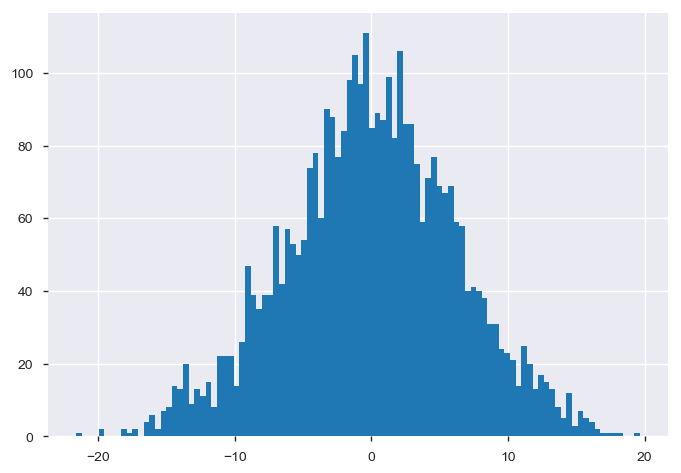

In [399]:
model.resid.hist(bins=100)

In [400]:
#Decile analysis - Train

train['Deciles']=pd.qcut(train['pred'],10, labels=False)

avg_actual = train[['Deciles','ln_TotalSpend']].groupby(train.Deciles).mean().sort_index(ascending=False)['ln_TotalSpend']
avg_pred = train[['Deciles','pred']].groupby(train.Deciles).mean().sort_index(ascending=False)['pred']

Decile_analysis_train = pd.concat([avg_actual, avg_pred], axis=1)

Decile_analysis_train

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,ln_TotalSpend,pred
Deciles,,
9,45.185112,45.022952
8,41.425989,41.624053
7,39.513474,39.698542
6,38.166781,38.021263
5,36.780105,36.590953
4,35.411148,35.308807
3,34.195974,34.175824
2,32.864551,33.194492
1,32.556388,32.036412


In [401]:
Decile_analysis_train.to_csv("Decile_analysis_train.csv")

In [402]:
#Decile analysis - Train
test['Deciles']=pd.qcut(test['pred'],10, labels=False)

avg_actual_test = test[['Deciles','ln_TotalSpend']].groupby(test.Deciles).mean().sort_index(ascending=False)['ln_TotalSpend']
avg_pred_test = test[['Deciles','pred']].groupby(test.Deciles).mean().sort_index(ascending=False)['pred']

Decile_analysis_test = pd.concat([avg_actual_test, avg_pred_test], axis=1)

Decile_analysis_test

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,ln_TotalSpend,pred
Deciles,,
9,44.925730,44.893015
8,40.370780,41.544886
7,39.899607,39.486440
6,37.654644,37.756381
5,35.911342,36.318954
4,35.033839,35.035729
3,33.350314,33.947257
2,32.529753,32.994798
1,32.311243,31.848664


In [403]:
Decile_analysis_test.to_csv("Decile_analysis_test.csv")

# Variable reduction using Select K-Best technique

In [404]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif

In [405]:
features = result[result.columns.difference( ['ln_TotalSpend'] )]
target = result['ln_TotalSpend']
features_new = SelectKBest(f_classif, k=15).fit(features, target )

In [406]:
features_new.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,

In [407]:
features_new.scores_

array([0.99558822, 0.99558822, 0.92536224, 0.91476256, 1.08704152,
       1.0414592 , 0.82063665, 0.8864436 , 1.10587352, 0.93020365,
       1.01799554, 0.86633879, 1.26632032, 1.02719361, 0.81153137,
       0.97480409, 0.77302604, 0.82525139, 1.13961749, 1.43564649,
       1.03391606, 0.85953583, 1.22335687, 0.96246007, 0.94495912,
       1.00743061, 1.00279754, 1.11201822, 1.09354761, 1.06791064,
       0.94733587, 0.89716336, 1.80695462, 0.94615713, 1.05075485,
       1.12185801, 1.17498667, 1.10060702, 1.10060702, 0.9556499 ,
       1.25973718, 1.06537134, 0.940273  , 0.94269405, 1.02399857,
       0.96103406, 1.01105412, 1.38926354, 1.01479737, 0.96917035,
       0.83664606, 0.98360157, 0.90316674, 0.96782303, 1.30856787,
       1.14830047, 1.00511975, 1.00342923, 1.11380553, 1.02584213,
       0.95023453, 0.97159343, 1.12647526, 1.0161885 , 0.97695016,
       1.10381263, 0.95756014, 0.95756014, 0.98967281, 0.98967281,
       1.08831692, 0.98323823, 0.83970671, 1.02716352, 1.02716

In [408]:
# summarize the selection of the attributes
import itertools
feature_map = [(i, v) for i, v in itertools.zip_longest(features.columns, features_new.get_support())]
feature_map
#Alternative of capturing the important variables
KBest_features=features.columns[features_new.get_support()]

selected_features_from_KBest = features[KBest_features]

In [409]:
KBest_features

Index(['birthmonth_May', 'card2_o', 'card_card5', 'cardtenurecat_cat2',
       'default_y', 'lncardten', 'lntollten', 'lntollten', 'lnwireten',
       'pets_cats', 'pets_saltfish', 'pets_saltfish', 'reason_rea2',
       'response_03_y', 'spousedcat_spo6'],
      dtype='object')

# Prediction using Decision Trees

In [410]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.metrics import mean_squared_error

from sklearn.tree import DecisionTreeRegressor

In [411]:
import sklearn.tree as dt

In [412]:
dir(dt)

['DecisionTreeClassifier',
 'DecisionTreeRegressor',
 'ExtraTreeClassifier',
 'ExtraTreeRegressor',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_criterion',
 '_splitter',
 '_tree',
 '_utils',
 'export',
 'export_graphviz',
 'tree']

In [413]:
from sklearn import metrics
from sklearn.tree import DecisionTreeRegressor, export_graphviz, export
from sklearn.model_selection import GridSearchCV

In [414]:
from sklearn.model_selection import train_test_split

X = selected_features_from_KBest
y = target
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)

In [415]:
### Building Decision Tree Model
import sklearn.tree as dt
dir(dt)

['DecisionTreeClassifier',
 'DecisionTreeRegressor',
 'ExtraTreeClassifier',
 'ExtraTreeRegressor',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_criterion',
 '_splitter',
 '_tree',
 '_utils',
 'export',
 'export_graphviz',
 'tree']

In [416]:
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz, export
from sklearn.model_selection import learning_curve, GridSearchCV

In [417]:
reg_tree = DecisionTreeRegressor( max_depth = 3 )
reg_tree=reg_tree.fit( train_X, train_y )

In [418]:
pd.DataFrame(reg_tree.predict(train_X)).head()

,0
0,35.726546
1,37.368496
2,37.368496
3,35.726546
4,37.368496


In [419]:
pd.DataFrame(reg_tree.predict(train_X))

,0
0,35.726546
1,37.368496
2,37.368496
3,35.726546
4,37.368496
5,35.726546
6,35.726546
7,35.726546
8,35.726546
9,35.726546


In [420]:
pred = pd.DataFrame(reg_tree.predict( train_X ), index=train_X.index)

In [421]:
tree_train_pred = pd.concat([train_y, pred], axis=1)

In [422]:
tree_train_pred.columns = ['actual', 'predicted']

In [423]:
tree_train_pred.head()

,actual,predicted
1840,33.031329,35.726546
2115,44.070756,37.368496
4437,37.134068,37.368496
1146,26.546282,35.726546
2486,29.122073,37.368496


In [424]:
tree_train_pred.to_csv("tree_train_pred.csv")

In [425]:
pred_test = pd.DataFrame(reg_tree.predict( test_X ), index=test_X.index)
tree_test_pred = pd.concat([test_y, pred_test], axis=1)
tree_test_pred.columns = ['actual', 'predicted']
tree_test_pred.head()

,actual,predicted
1501,30.433864,37.368496
2586,35.655359,35.726546
2653,22.882517,35.726546
1055,43.349470,35.726546
705,36.697393,35.726546


In [426]:
tree_test_pred.to_csv("tree_test_pred.csv")

In [427]:
print("train_mean_squared_error:")
print(metrics.regression.mean_squared_error(tree_train_pred.actual, tree_train_pred.predicted ))

print("test_mean_squared_error:")
print(metrics.regression.mean_squared_error( tree_test_pred.actual, tree_test_pred.predicted ))

train_mean_squared_error:
56.27743680303147
test_mean_squared_error:
56.449405063945186


# Fine Tuning the parameters

In [428]:
param_grid = {'max_depth': np.arange(3, 5),
             'max_features': np.arange(3,5)}

In [429]:
reg_tree = DecisionTreeRegressor(max_depth = 5, max_features=10)

In [430]:
reg_tree.fit(train_X, train_y )

DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=10,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [431]:
tree = GridSearchCV(DecisionTreeRegressor(), param_grid, cv = 5)
tree.fit( train_X, train_y )

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': array([3, 4]), 'max_features': array([3, 4])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [432]:
tree.best_score_

0.004138418316931536

In [433]:
tree.best_estimator_

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=3,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [434]:
tree.best_params_

{'max_depth': 4, 'max_features': 3}

In [435]:
train_pred = tree.predict(train_X)

In [436]:
print(metrics.completeness_score(train_y, train_pred))
print(metrics.mean_squared_error(train_y, train_pred))
print(metrics.mean_absolute_error(train_y, train_pred))
print(metrics.mean_squared_log_error(train_y, train_pred))
print(metrics.median_absolute_error(train_y, train_pred))
print(metrics.explained_variance_score(train_y, train_pred))

0.9726405747281928
56.055280574461584
5.850462226348507
0.04541418331907634
4.646841094238956
0.043016330117915724


In [437]:
test_pred = tree.predict(test_X)

In [438]:
print(metrics.completeness_score(test_y, test_pred))
print(metrics.mean_squared_error(test_y, test_pred))
print(metrics.mean_absolute_error(test_y, test_pred))
print(metrics.mean_squared_log_error(test_y, test_pred))
print(metrics.median_absolute_error(test_y, test_pred))
print(metrics.explained_variance_score(test_y, test_pred))

0.9815442679047485
56.689420994063326
5.942093908333683
0.04498275693603732
4.759917210027986
0.025753857717986883


# Building Final Decision Tree Model

In [439]:
reg_tree = DecisionTreeRegressor( max_depth = 4, max_features=3, max_leaf_nodes=5 )
reg_tree.fit( train_X, train_y )

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=3,
           max_leaf_nodes=5, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

# Feature Relative Importance

In [440]:
reg_tree.feature_importances_

array([0.        , 0.09032385, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.17235287, 0.        , 0.        ,
       0.        , 0.29336241, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.44396087, 0.        ,
       0.        ])

In [441]:
# summarize the selection of the attributes
import itertools
feature_map = [(i, v) for i, v in itertools.zip_longest(train_X.columns, reg_tree.feature_importances_)]

feature_map

[('birthmonth_May', 0.0),
 ('card2_o', 0.09032385146888991),
 ('card_card5', 0.0),
 ('cardtenurecat_cat2', 0.0),
 ('default_y', 0.0),
 ('lncardten', 0.0),
 ('lncardten', 0.0),
 ('lntollten', 0.17235286995430793),
 ('lntollten', 0.0),
 ('lntollten', 0.0),
 ('lntollten', 0.0),
 ('lnwireten', 0.2933624056933425),
 ('lnwireten', 0.0),
 ('pets_cats', 0.0),
 ('pets_saltfish', 0.0),
 ('pets_saltfish', 0.0),
 ('pets_saltfish', 0.0),
 ('pets_saltfish', 0.0),
 ('reason_rea2', 0.4439608728834597),
 ('response_03_y', 0.0),
 ('spousedcat_spo6', 0.0)]

In [442]:
Feature_importance = pd.DataFrame(feature_map, columns=['Feature', 'importance'])
Feature_importance.sort_values('importance', inplace=True, ascending=False)
Feature_importance

,Feature,importance
18,reason_rea2,0.443961
11,lnwireten,0.293362
7,lntollten,0.172353
1,card2_o,0.090324
0,birthmonth_May,0.000000
12,lnwireten,0.000000
19,response_03_y,0.000000
17,pets_saltfish,0.000000
16,pets_saltfish,0.000000
15,pets_saltfish,0.000000


In [443]:
Feature_importance.to_csv("Feature_importance.csv")

In [444]:
tree_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': reg_tree.predict( test_X ) } )

In [445]:
tree_test_pred.sample( n = 10 )

,actual,predicted
485,33.907864,35.862262
4866,31.753269,35.862262
3811,44.848614,35.862262
4692,38.756709,34.441747
4011,43.411233,35.862262
4877,36.174471,35.862262
3955,27.995114,35.862262
1751,39.783141,35.862262
1894,31.357249,35.862262
65,44.432358,39.866027


In [446]:
metrics.completeness_score( tree_test_pred.actual, tree_test_pred.predicted )

0.9811081874737654

# Generate Rules from Decision Trees
To create a decision tree visualization graph. Install GraphViz (As per the OS and version you are using) pip install pydotplus Add the path to environmental variables Note: The notebook needs a restart.



In [447]:
import os     
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

In [448]:
# Exporting the tree output in the form opendocument
export_graphviz( reg_tree,
              out_file = "credit_card_tree.odt",
              feature_names = train_X.columns )

In [449]:
# Converting open document file to jpg imanage

import pydotplus as pdot
chd_tree_graph = pdot.graphviz.graph_from_dot_file( 'credit_card_tree.odt' )

In [450]:
chd_tree_graph.write_jpg( 'credit_card_tree.jpg' )

True

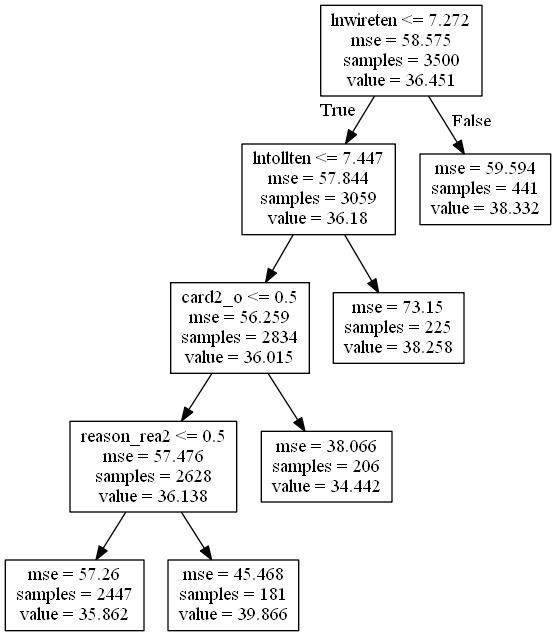

In [451]:
# Viewing the image in the notebook (display the image)
from IPython.display import Image
Image(filename='credit_card_tree.jpg')

# Random Forest¶

In [452]:
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler

In [453]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

X, y = make_regression(n_features=15, n_informative=2,random_state=0, shuffle=False)
regr = RandomForestRegressor(max_depth=2, random_state=0,n_estimators=100)
regr.fit(train_X, train_y)  

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [454]:
print(regr.feature_importances_)

[0.00222334 0.         0.00139876 0.         0.         0.02134353
 0.00260527 0.06719353 0.06517136 0.07313926 0.06159443 0.08427064
 0.0483705  0.00430331 0.         0.         0.         0.
 0.56752073 0.         0.00086534]


In [455]:
print(regr.predict(train_X))

[35.84031044 36.9924016  37.50943617 ... 35.84031044 35.84031044
 37.19450401]


In [456]:
from sklearn.ensemble import RandomForestRegressor

regr_reg = RandomForestRegressor(oob_score=False,n_estimators=100 , max_features='auto', n_jobs=None)
regr_reg.fit( train_X, train_y )

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [457]:
regr_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': regr_reg.predict( test_X ) } )

metrics.completeness_score(regr_test_pred.actual, regr_test_pred.predicted )

0.9919292535828391

# Feature importance from the Random Forest Model

In [458]:
regr_reg.feature_importances_

indices = np.argsort(regr_reg.feature_importances_)[::-1]

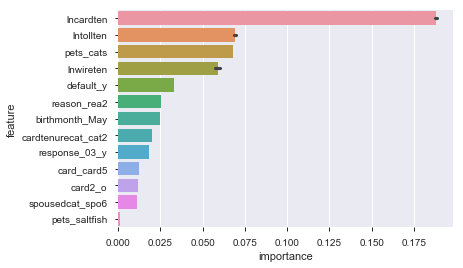

In [459]:
indices = np.argsort(regr_reg.feature_importances_)[::-1]
feature_rank = pd.DataFrame( columns = ['rank', 'feature', 'importance'] )
for f in range(train_X.shape[1]):
  feature_rank.loc[f] = [f+1,
                         train_X.columns[indices[f]],
                         regr_reg.feature_importances_[indices[f]]]
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

# Tuning parameters¶

In [460]:
pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}

from sklearn.model_selection import learning_curve, GridSearchCV
gscv_Rf = GridSearchCV(estimator=RandomForestRegressor(), 
                        param_grid=pargrid_ada, 
                        cv=5, scoring='neg_mean_squared_error', verbose=0, n_jobs=-1)

In [461]:
gscv_results = gscv_Rf.fit(train_X, train_y)
gscv_results.best_score_

-64.80482264930468

In [462]:
gscv_results.best_params_

{'max_features': 7, 'n_estimators': 70}

In [463]:
import pandas as pd
import numpy as np
from io import StringIO
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt

In [464]:
#Corr_test = stats.stats.pearsonr(test.ln_TotalSpend, test.pred)
#print(Corr_test)

In [465]:
reg = RandomForestRegressor(criterion='mse')
reg.fit(train_X,train_y)
modelPred = reg.predict(train_X)
print(modelPred)

print("Number of predictions:",len(modelPred))

meanSquaredError=mean_squared_error(train_y, modelPred)
print("MSE:", meanSquaredError)
rootMeanSquaredError = sqrt(meanSquaredError)
print("RMSE:", rootMeanSquaredError)
MAPE_train = np.mean(np.abs(train_y - modelPred)/train_y)
print("MAPE:", MAPE_train)
Corr_train = stats.stats.pearsonr(train_y, modelPred)
print("Corr_train:",Corr_train)

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[36.32232871 42.23575375 37.31630034 ... 35.49748014 36.86300304
 30.75156879]
Number of predictions: 3500
MSE: 21.2211512395054
RMSE: 4.606642078510702
MAPE: 0.09903332781766963
Corr_train: (0.8166864623633701, 0.0)


In [466]:
reg = RandomForestRegressor(criterion='mse')
reg.fit(test_X,test_y)
modelPred = reg.predict(test_X)
print(modelPred)

print("Number of predictions:",len(modelPred))

meanSquaredError=mean_squared_error(test_y, modelPred)
print("MSE:", meanSquaredError)
rootMeanSquaredError = sqrt(meanSquaredError)
print("RMSE:", rootMeanSquaredError)
MAPE_test = np.mean(np.abs(test_y - modelPred)/test_y)
print("MAPE:",MAPE_test)
Corr_test = stats.stats.pearsonr(test_y, modelPred)
print("Corr_test:",Corr_test)

[33.03354749 35.73277158 35.73277158 ... 29.976218   35.73277158
 33.32129937]
Number of predictions: 1500
MSE: 19.091100154959864
RMSE: 4.369336351776991
MAPE: 0.09400611403141322
Corr_test: (0.8369933646440191, 0.0)


C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


# Gradient Boost

In [467]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import GradientBoostingRegressor


from sklearn.model_selection import learning_curve, GridSearchCV
gscv_gbm = GridSearchCV(estimator=GradientBoostingRegressor(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        scoring='neg_mean_squared_error', verbose=0, n_jobs=-1)

gscv_gbm.fit(train_X, train_y)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_sampl...=None, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [50, 60, 70, 80, 90, 100], 'max_features': [5, 6, 7, 8, 9, 10, 11, 12]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

In [468]:
gscv_gbm.best_params_

{'max_features': 8, 'n_estimators': 50}

In [469]:
clf_gbm = gscv_gbm.best_estimator_

gscv_gbm.best_score_

-57.35111859531273

In [470]:
gbm=GradientBoostingRegressor(learning_rate = 0.1, n_estimators=800)
gbm.fit(train_X, train_y )

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=800, n_iter_no_change=None, presort='auto',
             random_state=None, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)

In [471]:
print(pd.Series(cross_val_score(gbm, train_X, train_y, cv=10)).describe()[['min', 'mean', 'max']])

min    -0.146122
mean   -0.082879
max    -0.042889
dtype: float64


# XGBOOST

In [472]:
import xgboost
from xgboost import XGBRegressor

In [473]:
#All Columns
xgb_estimator = XGBRegressor(n_estimators=200,
                         random_state = 42,
                        n_jobs=-1,
                        verbose=0)


In [474]:
train_X = train_X.loc[:,~train_X.columns.duplicated()]

In [475]:
test_X = test_X.loc[:,~test_X.columns.duplicated()]

In [476]:
xgb_estimator.fit(train_X, train_y)

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[18:04:23] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=200,
       n_jobs=-1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbose=0, verbosity=1)

In [477]:
xgb_estimator.predict(train_X)

array([34.550632, 38.051342, 36.576687, ..., 35.862392, 35.634094,
       32.482483], dtype=float32)

In [478]:
xgb_estimator.predict(test_X)

array([34.413364, 35.913506, 35.913506, ..., 36.28318 , 35.913506,
       34.038338], dtype=float32)

In [479]:
metrics.mean_squared_error(train_y,pd.DataFrame(xgb_estimator.predict(train_X)))

47.72278206062517

In [480]:
metrics.mean_squared_error(test_y,pd.DataFrame(xgb_estimator.predict(test_X)))

57.724874891386946

In [481]:
print(metrics.mean_squared_error(train_y, xgb_estimator.predict(train_X)))

print(metrics.mean_squared_error(test_y, xgb_estimator.predict(test_X)))

47.72278206062517
57.724874891386946


In [482]:
# with all tuning parameters
xgb_estimator = XGBRegressor( learning_rate=0.01,
                               n_estimators=1000,
                               max_depth=5,
                               min_child_weight=1,
                               gamma=1,
                               subsample=0.8,
                               colsample_bytree=0.8,
                               n_jobs=-1,
                               reg_alpa=1,
                               scale_pos_weight=1,
                               random_state=42,
                               verbose=0)

In [483]:
xgb_estimator.fit(train_X, train_y)

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[18:04:25] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.8, gamma=1,
       importance_type='gain', learning_rate=0.01, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=1000,
       n_jobs=-1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpa=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=0.8, verbose=0, verbosity=1)

In [484]:
print(metrics.mean_squared_error(train_y,pd.DataFrame(xgb_estimator.predict(train_X))))

print(metrics.mean_squared_error(test_y,pd.DataFrame(xgb_estimator.predict(test_X))))

43.94862372976079
57.183429927603214


In [485]:
print(metrics.completeness_score(train_y, xgb_estimator.predict(train_X)))

print(metrics.completeness_score(test_y, xgb_estimator.predict(test_X)))

0.9859032369067535
0.9919002149363091


# SVR

In [486]:
import math
import pandas
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.utils import shuffle

In [487]:
import random
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVR 
from sklearn.metrics import mean_squared_error 

In [488]:
from sklearn.svm import SVR
regressor=SVR(kernel='linear',degree=1)

In [489]:
#LOADING THE SVR MODEL FROM sklearn.svm
from sklearn.svm import SVR
regressor=SVR(kernel='linear')

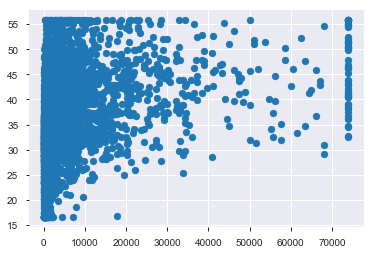

In [490]:
#PLOT THE RELATION:
import matplotlib.pyplot as plt
plt.scatter(result['income'],result['ln_TotalSpend'])

In [491]:
#SPLIT INTO TRAIN AND TEST SET
from sklearn.model_selection import train_test_split
train_X,test_X,train_y,test_y=train_test_split(X,y)

In [492]:
#FIT THE MODEL DO THE PREDICTION
regressor.fit(train_X,train_y)
pred=regressor.predict(test_X)

In [493]:
#CHECK THE ACCURACY
print(regressor.score(test_X,test_y))
from sklearn.metrics import r2_score
print(r2_score(test_y,pred))

0.997917012803374
0.997917012803374


In [494]:
#LET’S TUNE SO PARAMETERS TO SEE IF WE CAN GET BETTER SCORE:
regressor=SVR(kernel='rbf',epsilon=1.0)
regressor.fit(train_X,train_y)
pred=regressor.predict(test_X)
print(regressor.score(test_X,test_y))
print(r2_score(test_y,pred))

-0.587577099182395
-0.587577099182395


C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


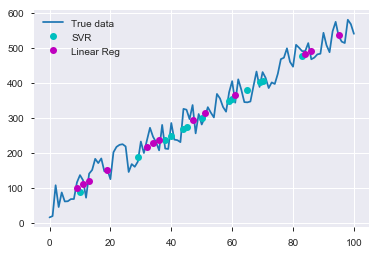

In [495]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split

X = np.linspace(0,100,101)
y = np.array([(100*np.random.rand(1)+num) for num in (5*X+10)])

train_X, test_X, train_y, test_y = train_test_split(X, y)

svr = SVR(kernel='linear')
lm = LinearRegression()
svr.fit(train_X.reshape(-1,1),train_y.flatten())
lm.fit(train_X.reshape(-1,1), train_y.flatten())

pred_SVR = svr.predict(test_X.reshape(-1,1))
pred_lm = lm.predict(test_X.reshape(-1,1))

plt.plot(X,y, label='True data')
plt.plot(test_X[::2], pred_SVR[::2], 'co', label='SVR')
plt.plot(test_X[1::2], pred_lm[1::2], 'mo', label='Linear Reg')
plt.legend(loc='upper left');


In [496]:
import random
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVR 
from sklearn.metrics import mean_squared_error 

#Next, we create sample data.

random.seed(123)
def getData(N):
 X,y = [],[]
 for i in range(N):  
  a = i/10+random.uniform(-1,1)
  yy = math.sin(a)+3+random.uniform(-1,1)
  X.append([a])
  y.append([yy])  
 return np.array(X), np.array(y)

X,y = getData(3500)

In [497]:
model = SVR()
print(model)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)


In [498]:
model.fit(X,y)
pred_y = model.predict(X)
pred_y

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


array([1.72489336, 2.38786564, 3.27543704, ..., 2.81516879, 2.91353132,
       2.81899286])

In [499]:
for yo, yp in zip(y[1:15,:], pred_y[1:15]):
 print(yo,yp)

[2.12998819] 2.387865639387363
[2.91907141] 3.275437043594179
[3.02825117] 2.944818496320369
[3.21241735] 3.336178409181666
[2.84114287] 2.74116781279726
[2.09354503] 2.634716304203995
[2.71700547] 3.0808245052515555
[2.97862119] 3.2715810345764367
[3.40296856] 3.0575276897938934
[3.15686687] 3.908987522028397
[3.95510045] 2.954810917047531
[4.06240409] 2.8191158536926197
[3.52296771] 3.623041997235057
[4.41282252] 3.918519224855301


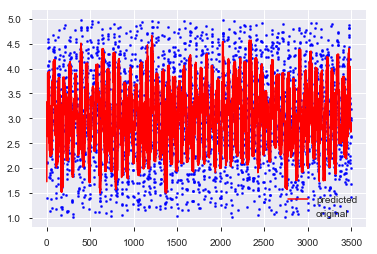

In [500]:
X_ax=range(3500)
plt.scatter(X_ax, y, s=5, color="blue", label="original")
plt.plot(X_ax, pred_y, lw=1.5, color="red", label="predicted")
plt.legend()
plt.show() 
 

In [501]:
score=model.score(X,y)
print(score)

 
mse =mean_squared_error(y, pred_y)
print("Mean Squared Error:",mse)

rmse = math.sqrt(mse)
print("Root Mean Squared Error:", rmse)


0.6390685758247246
Mean Squared Error: 0.30022181630745876
Root Mean Squared Error: 0.547925009748103


# Predicting the values for development data

In [502]:
model = sm.ols('ln_TotalSpend~region_z5+gender_m+retire_y+inccat_ic3+carown_o+carcatvalue_l+carcatvalue_n+carcatvalue_s+reason_rea2+reason_rea9+polview_pol2+card_card2+card_card3+card_card4+card_card5+card2_d+card2_m+card2_o+card2_v+owndvd_y+owncd_y+income',data = DataSet3_new)

In [503]:
model = model.fit()

In [504]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          ln_TotalSpend   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     112.9
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:04:35   Log-Likelihood:                -3889.5
No. Observations:                5000   AIC:                             7825.
Df Residuals:                    4977   BIC:                             7975.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.2573      0.052    120.854      0.000       6.156       6.359
region_z5         0.0423      0.019      2.282      0.023       0.006       0.079
gender_m          0.0526      0.015      3.497      0.000       0.023       0.082
retire_y         -0.1613      0.023     -7.003      0.000      -0.206      -0.116
inccat_ic3        0.0841      0.024      3.545      0.000       0.038       0.131
carown_o          0.0491      0.022      2.188      0.029       0.005       0.093
carcatvalue_l     0.1015      0.035      2.904      0.004       0.033       0.170
carcatvalue_n     0.0905      0.032      2.786      0.005       0.027       0.154
carcatvalue_s     0.0588      0.024      2.478      0.013       0.012       0.105
reason_rea2       0.3633      0.036     10.065      0.000       0.292       0.434
reason_rea9       0.1146      0.023      4.978      0.000       0.069       0.160
polview_pol2      0.0398      0.023      1.757      0.079      -0.005       0.084
card_card2       -0.5748      0.024    -23.927      0.000      -0.622      -0.528
card_card3       -0.5962      0.024    -24.615      0.000      -0.644      -0.549
card_card4       -0.6872      0.025    -27.552      0.000      -0.736      -0.638
card_card5       -0.4814      0.040    -11.913      0.000      -0.561      -0.402
card2_d          -0.4372      0.027    -16.271      0.000      -0.490      -0.385
card2_m          -0.3932      0.025    -16.040      0.000      -0.441      -0.345
card2_o          -0.2918      0.035     -8.280      0.000      -0.361      -0.223
card2_v          -0.3989      0.025    -16.273      0.000      -0.447      -0.351
owndvd_y          0.0952      0.031      3.118      0.002       0.035       0.155
owncd_y           0.0881      0.034      2.593      0.010       0.021       0.155
income            0.0033      0.000     12.353      0.000       0.003       0.004
==============================================================================
Omnibus:                      120.096   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              129.251
Skew:                          -0.374   Prob(JB):                     8.58e-29
Kurtosis:                       3.244   Cond. No.                         620.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [505]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          ln_TotalSpend   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     112.9
Date:                Sat, 30 Nov 2019   Prob (F-statistic):               0.00
Time:                        18:04:35   Log-Likelihood:                -3889.5
No. Observations:                5000   AIC:                             7825.
Df Residuals:                    4977   BIC:                             7975.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.2573      0.052    120.854

In [506]:
train2, test2 = train_test_split( DataSet3_new, test_size = 0.3, random_state = 12345678)

In [507]:
print(len(train2))
print(len(test2))

3500
1500


In [508]:
my_formula ='ln_TotalSpend~region_z5+gender_m+retire_y+inccat_ic3+carown_o+carcatvalue_l+carcatvalue_n+carcatvalue_s+reason_rea2+reason_rea9+polview_pol2+card_card2+card_card3+card_card4+card_card5+card2_d+card2_m+card2_o+card2_v+owndvd_y+owncd_y+income'
my_formula

'ln_TotalSpend~region_z5+gender_m+retire_y+inccat_ic3+carown_o+carcatvalue_l+carcatvalue_n+carcatvalue_s+reason_rea2+reason_rea9+polview_pol2+card_card2+card_card3+card_card4+card_card5+card2_d+card2_m+card2_o+card2_v+owndvd_y+owncd_y+income'

In [509]:
model = smf.ols(my_formula, data=train2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          ln_TotalSpend   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     77.99
Date:                Sat, 30 Nov 2019   Prob (F-statistic):          1.68e-282
Time:                        18:04:36   Log-Likelihood:                -2673.2
No. Observations:                3500   AIC:                             5392.
Df Residuals:                    3477   BIC:                             5534.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.2542      0.061    102.144

In [510]:
train2['pred'] = pd.DataFrame(model.predict(train2))

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [511]:
train2.head()

,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,owncd_y,ownpda_y,ownpc_y,ownipod_y,owngame_y,ownfax_y,news_y,response_02_y,response_03_y,pred
4004,3.0,25,16,1,31.0,3.433987,1.5,0.091605,-2.390269,0.373395,...,1,0,0,0,0,0,1,0,0,5.666791
763,2.0,20,15,0,16.0,2.772589,27.1,0.351216,-1.046354,3.984784,...,1,0,0,0,1,0,0,0,0,5.919634
4815,2.0,58,11,13,59.0,4.077537,16.7,3.093842,1.129414,6.759158,...,1,0,0,0,0,0,0,1,0,6.211892
1812,1.0,52,16,13,60.0,4.094345,4.1,0.472320,-0.750099,1.987680,...,1,0,1,0,1,0,0,0,0,6.223206
4399,5.0,77,17,38,14.0,2.639057,10.3,0.155736,-1.859593,1.286264,...,1,0,1,0,0,0,0,0,0,5.570898


In [512]:
train2.to_csv("train2.csv")

In [513]:
test2['pred'] = pd.DataFrame(model.predict(test2))
test2.head()

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,townsize,age,ed,employ,income,lninc,debtinc,creddebt,lncreddebt,othdebt,...,owncd_y,ownpda_y,ownpc_y,ownipod_y,owngame_y,ownfax_y,news_y,response_02_y,response_03_y,pred
519,3.0,76,12,30,20.0,2.995732,2.5,0.193000,-1.645065,0.307000,...,1,0,0,0,0,0,1,0,0,5.527474
4172,2.0,48,11,11,44.0,3.784190,4.1,0.725208,-0.321297,1.078792,...,1,0,0,0,1,0,1,0,0,6.026198
1593,2.0,53,13,2,27.0,3.295837,16.2,0.358668,-1.025358,4.015332,...,1,0,1,1,1,1,0,0,1,5.694757
4367,2.0,57,20,5,170.0,5.135798,19.6,1.566040,0.448550,24.064260,...,1,0,1,1,1,0,0,0,0,6.810371
3722,1.0,35,13,8,34.0,3.526361,2.6,0.315588,-1.153318,0.568412,...,1,0,0,0,0,0,1,0,0,5.691312


In [514]:
test2.to_csv("test2.csv")

In [515]:
# calculate these metrics by hand!
from sklearn import metrics
import numpy as np
import scipy.stats as stats

In [516]:
#Train Data
MAPE_train2 = np.mean(np.abs(train2.ln_TotalSpend - train2.pred)/train2.ln_TotalSpend )
print(MAPE_train2)


RMSE_train2 = metrics.mean_squared_error(train2.ln_TotalSpend, train2.pred)
print(RMSE_train2)

Corr_train2 = stats.stats.pearsonr(train2.ln_TotalSpend , train2.pred)
print(Corr_train2)


#Test Data
MAPE_test2 = np.mean(np.abs(test2.ln_TotalSpend - test2.pred)/test2.ln_TotalSpend )
print(MAPE_test2)

RMSE_test2 = metrics.mean_squared_error(test2.ln_TotalSpend , test2.pred)
print(RMSE_test2)

Corr_test2 = stats.stats.pearsonr(test2.ln_TotalSpend , test2.pred)
print(Corr_test2)

0.07056470727694444
0.2697244852893244
(0.5748096854439966, 5.181231264747588e-307)
0.07524839407968184
0.29831285750575276
(0.5778802545241315, 2.2933500946377794e-134)


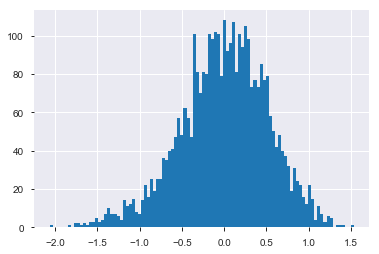

In [517]:
model.resid.hist(bins=100)

In [518]:
train2['Deciles']=pd.qcut(train2['pred'],10, labels=False)

avg_actual = train2[['Deciles','ln_TotalSpend']].groupby(train2.Deciles).mean().sort_index(ascending=False)['ln_TotalSpend']
avg_pred = train2[['Deciles','pred']].groupby(train2.Deciles).mean().sort_index(ascending=False)['pred']

Decile_analysis_train2 = pd.concat([avg_actual, avg_pred], axis=1)

Decile_analysis_train2

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ln_TotalSpend,pred
Deciles,,
9,6.704277,6.708852
8,6.445081,6.423121
7,6.276177,6.276616
6,6.098725,6.137049
5,6.037995,6.024437
4,5.972831,5.917245
3,5.823176,5.824113
2,5.710070,5.745166
1,5.638025,5.648262


In [519]:
Decile_analysis_train2.to_csv("Decile_analysis_train2.csv")

In [520]:
test2['Deciles']=pd.qcut(test2['pred'],10, labels=False)

avg_actual_test = test2[['Deciles','ln_TotalSpend']].groupby(test2.Deciles).mean().sort_index(ascending=False)['ln_TotalSpend']
avg_pred_test = test2[['Deciles','pred']].groupby(test2.Deciles).mean().sort_index(ascending=False)['pred']

Decile_analysis_test2 = pd.concat([avg_actual_test, avg_pred_test], axis=1)

Decile_analysis_test2

C:\Users\RAMKUMAR\Documents\Python Scripts\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ln_TotalSpend,pred
Deciles,,
9,6.656303,6.738464
8,6.453773,6.438907
7,6.218142,6.265992
6,6.142002,6.106024
5,5.963140,6.002432
4,5.917763,5.899786
3,5.816233,5.813779
2,5.652589,5.746104
1,5.590302,5.653110


In [521]:
Decile_analysis_test2.to_csv("Decile_analysis_test2.csv")

# correlation between actual and predicted values


In [522]:
Decile_analysis_train2.corr()

,ln_TotalSpend,pred
ln_TotalSpend,1.000000,0.997504
pred,0.997504,1.000000


In [523]:
Decile_analysis_test2.corr()

,ln_TotalSpend,pred
ln_TotalSpend,1.000000,0.990575
pred,0.990575,1.000000


# Saving as pickle object
Lets save everything in metrics df to pickle object

In [524]:
import pickle

In [525]:
# Now you can save it to a file
with open('model.pkl','wb') as f:
    pickle.dump(model, f)

In [526]:
# And later you can load it
with open('model.pkl','rb') as f:
    model = pickle.load(f) 

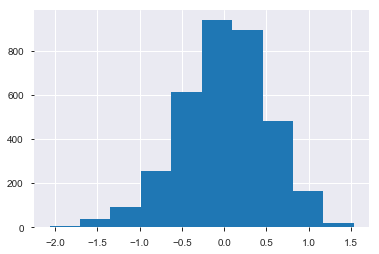

In [527]:
resid = model.resid
resid.hist()

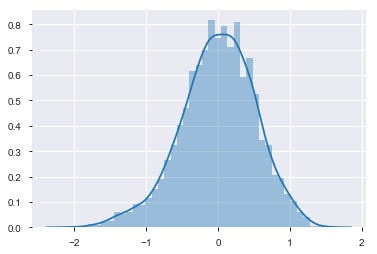

In [528]:
import seaborn as sns
sns.distplot(resid)